<a href="https://colab.research.google.com/github/Khaled-Abdelhamid/Vanilla-GANs-generator-loass-function-comaprison/blob/master/GAN_b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip3 install tensorboardX

     |████████████████████████████████| 204kB 6.1MB/s 


In [0]:
import torch
from torch import nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd.variable import Variable
from torchvision import transforms
from torchvision.datasets import MNIST
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib inline
import warnings
import numpy as np
from utils import Logger


In [0]:
device = torch.device("cuda:0")
is_cuda = torch.cuda.is_available()
print (torch.cuda.get_device_name(0))

Tesla P100-PCIE-16GB


In [0]:
 from google.colab import drive
drive.mount('/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive


In [0]:
def mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((.5,),(.5,))
        ])
    out_dir = './data'
    return MNIST(root=out_dir, train=True, transform=compose, download=True)

In [0]:
# Load data
data = mnist_data()
# Create loader with data, so that we can iterate over it
batch_size=100
data_loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True)
# Num batches
num_batches = len(data_loader)

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...
Done!


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


In [0]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x


In [0]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

In [0]:
# instantiate discriminator and generator
discriminator = DiscriminatorNet()
generator = GeneratorNet()
# check that they are as you expect
print(discriminator)
print()
print(generator)

DiscriminatorNet(
  (hidden0): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=1024, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=256, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

GeneratorNet(
  (hidden0): Sequential(
    (0): Linear(in_features=100, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=256, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=1024, bias=True)
    

In [0]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)
loss = nn.BCELoss()


In [0]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [0]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

In [0]:
def noise(size,input_features=100):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, input_features))
    return n

In [0]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [0]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

In [0]:
num_test_samples = 16
test_noise = noise(num_test_samples)

In [0]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='MNIST')

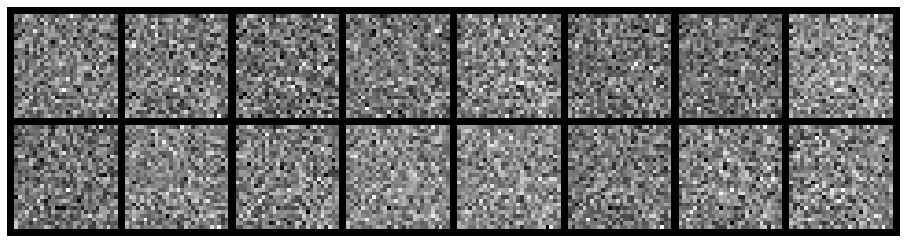

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3663, Generator Loss: 0.7045
D(x): 0.5047, D(G(z)): 0.4944
gen_epochs:1 ,dis_epochs:1


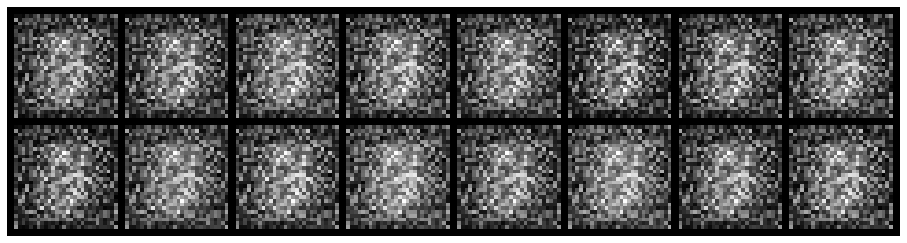

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 1.1096, Generator Loss: 1.2535
D(x): 0.8039, D(G(z)): 0.5526
gen_epochs:1 ,dis_epochs:1


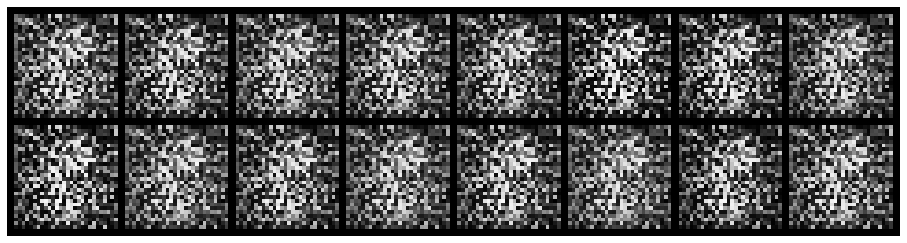

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.5388, Generator Loss: 2.8471
D(x): 0.9139, D(G(z)): 0.3004
gen_epochs:1 ,dis_epochs:1


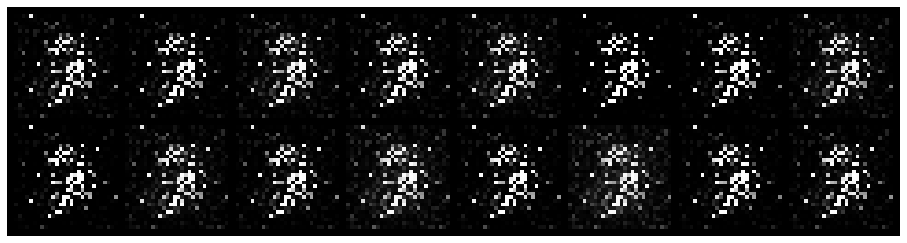

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0399, Generator Loss: 5.0466
D(x): 0.9882, D(G(z)): 0.0258
gen_epochs:1 ,dis_epochs:1


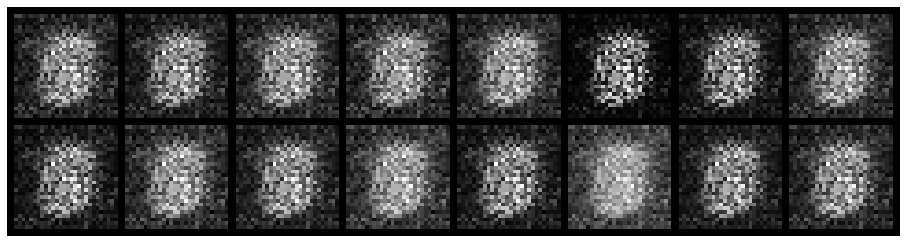

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.4476, Generator Loss: 2.5341
D(x): 0.7877, D(G(z)): 0.1623
gen_epochs:1 ,dis_epochs:1


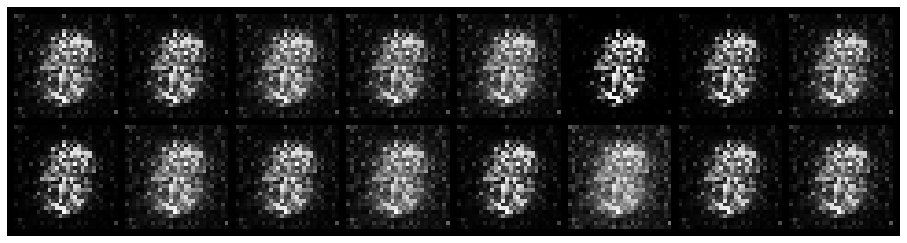

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 1.5510, Generator Loss: 0.6250
D(x): 0.4883, D(G(z)): 0.5525
gen_epochs:1 ,dis_epochs:1


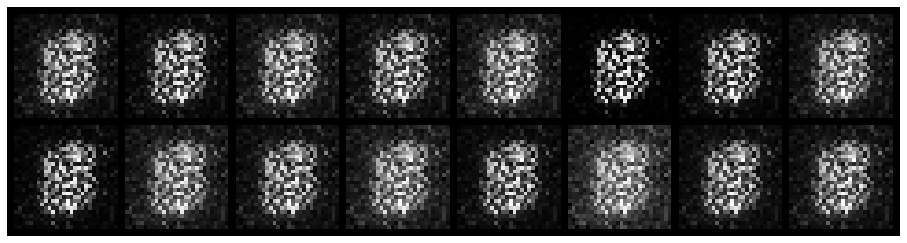

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 1.3593, Generator Loss: 1.8185
D(x): 0.5115, D(G(z)): 0.4369
gen_epochs:1 ,dis_epochs:1


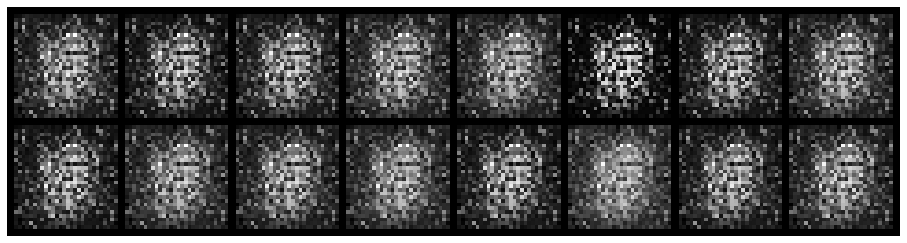

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 1.1435, Generator Loss: 0.7276
D(x): 0.6401, D(G(z)): 0.4963
gen_epochs:1 ,dis_epochs:1


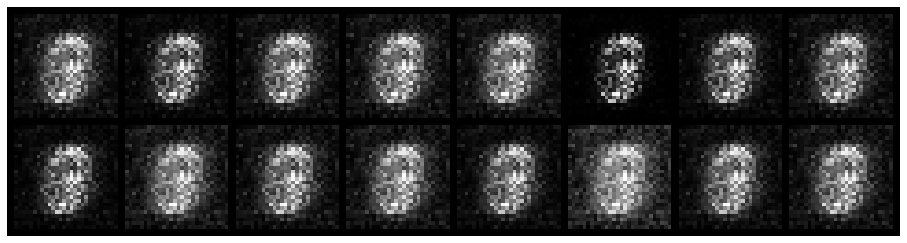

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.6194, Generator Loss: 2.5804
D(x): 0.6874, D(G(z)): 0.1945
gen_epochs:1 ,dis_epochs:1


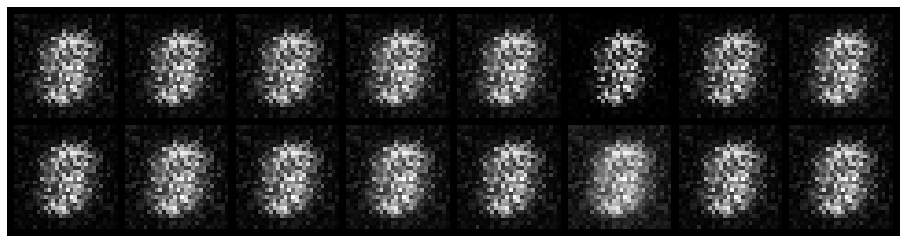

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 1.3480, Generator Loss: 0.9750
D(x): 0.5581, D(G(z)): 0.4647
gen_epochs:1 ,dis_epochs:1


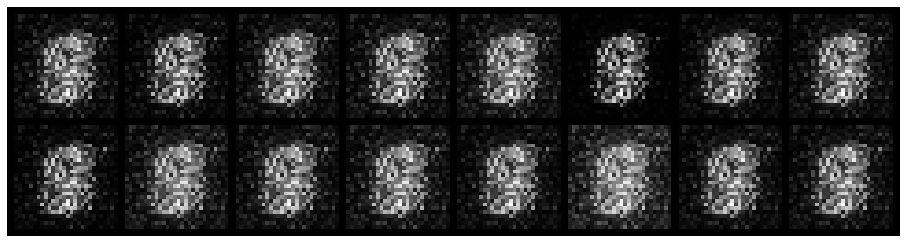

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.5234, Generator Loss: 2.5099
D(x): 0.7841, D(G(z)): 0.2324
gen_epochs:1 ,dis_epochs:1


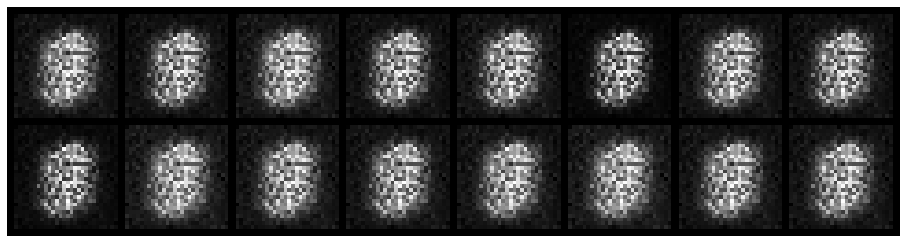

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 1.1189, Generator Loss: 1.7430
D(x): 0.6222, D(G(z)): 0.3688
gen_epochs:1 ,dis_epochs:1


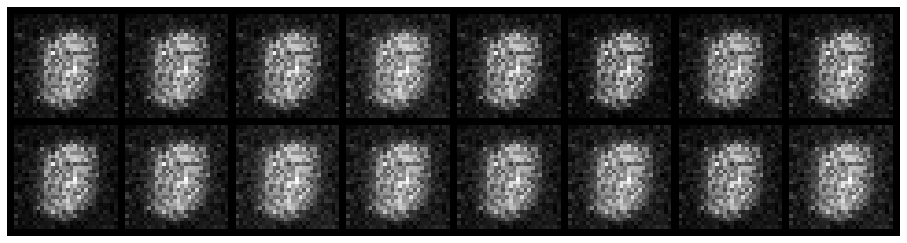

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.2290, Generator Loss: 0.9105
D(x): 0.5939, D(G(z)): 0.4491
gen_epochs:1 ,dis_epochs:1


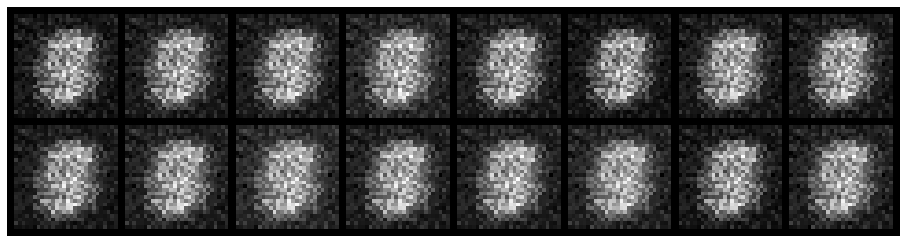

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 1.1938, Generator Loss: 1.5710
D(x): 0.7416, D(G(z)): 0.4523
gen_epochs:1 ,dis_epochs:1


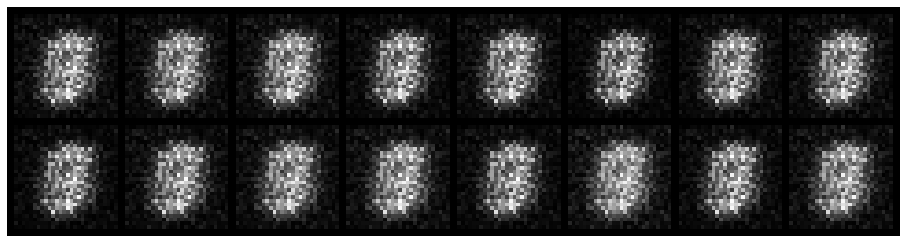

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.9517, Generator Loss: 1.5869
D(x): 0.6373, D(G(z)): 0.3053
gen_epochs:1 ,dis_epochs:1


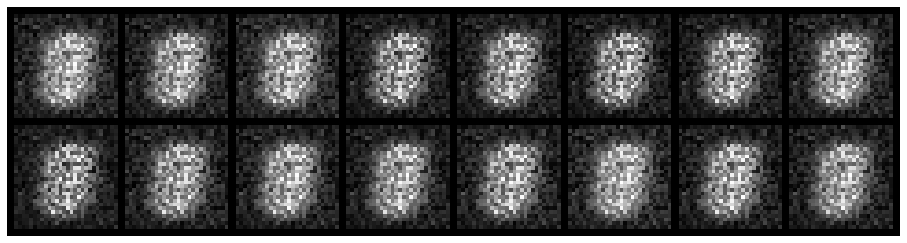

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 1.0339, Generator Loss: 1.0777
D(x): 0.6879, D(G(z)): 0.4285
gen_epochs:1 ,dis_epochs:1


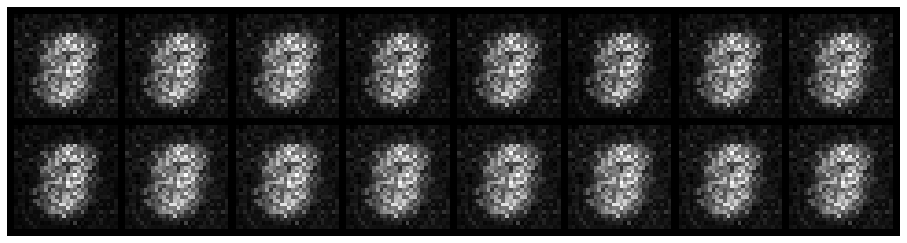

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 1.4036, Generator Loss: 0.9004
D(x): 0.5551, D(G(z)): 0.4552
gen_epochs:1 ,dis_epochs:1


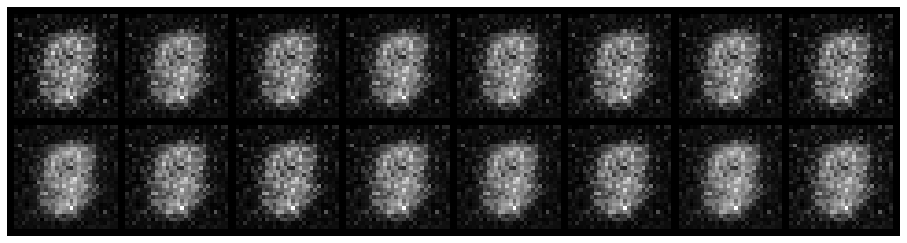

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.9664, Generator Loss: 2.9735
D(x): 0.7194, D(G(z)): 0.3636
gen_epochs:1 ,dis_epochs:1


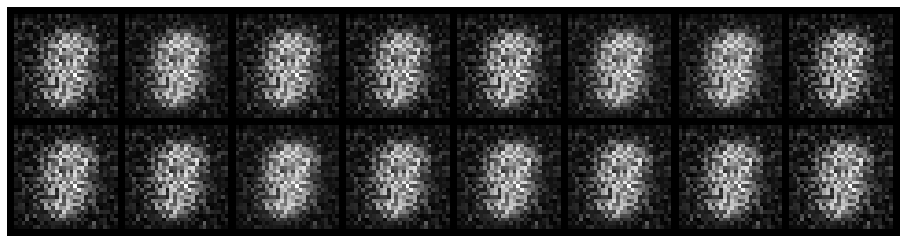

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.6393, Generator Loss: 1.6505
D(x): 0.8242, D(G(z)): 0.3151
gen_epochs:1 ,dis_epochs:1


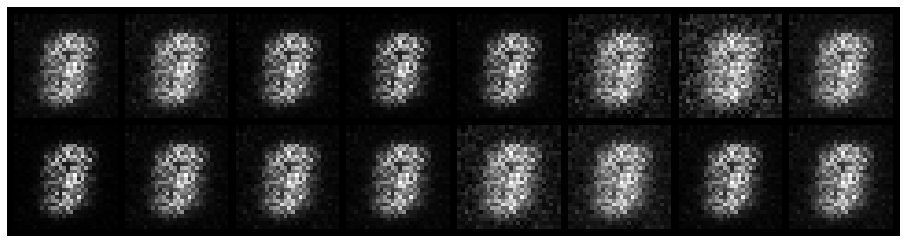

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.7720, Generator Loss: 1.5113
D(x): 0.7835, D(G(z)): 0.3238
gen_epochs:1 ,dis_epochs:1


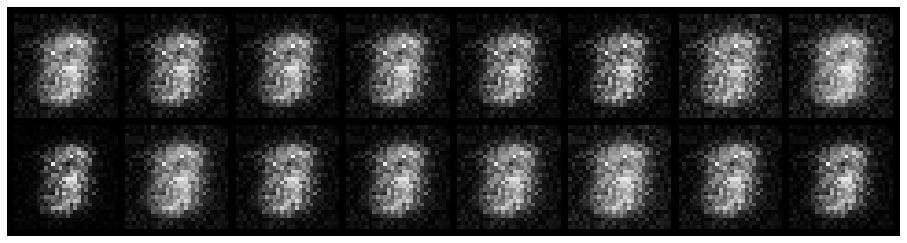

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.8280, Generator Loss: 2.3235
D(x): 0.7778, D(G(z)): 0.3226
gen_epochs:1 ,dis_epochs:1


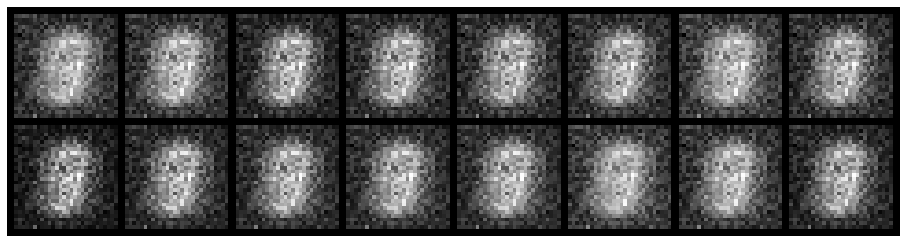

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 1.4700, Generator Loss: 0.7121
D(x): 0.6248, D(G(z)): 0.5471
gen_epochs:1 ,dis_epochs:1


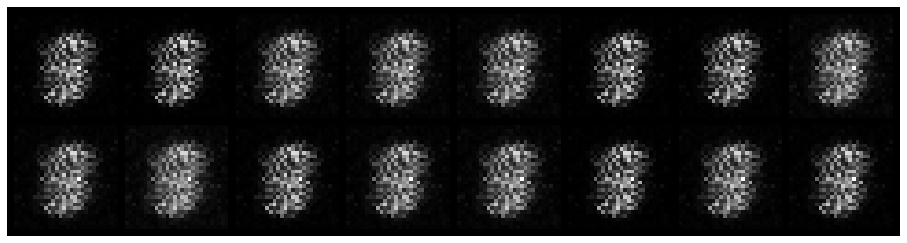

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 1.1397, Generator Loss: 1.3290
D(x): 0.6356, D(G(z)): 0.3312
gen_epochs:1 ,dis_epochs:1


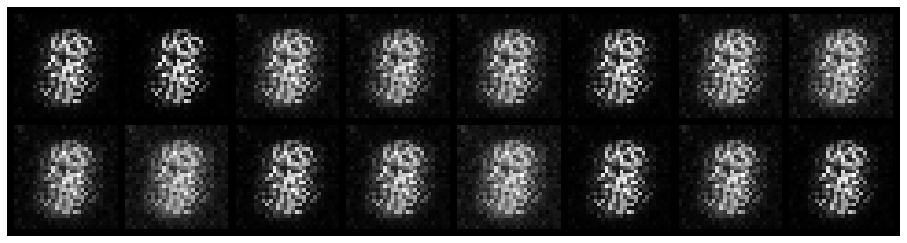

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.2771, Generator Loss: 3.1319
D(x): 0.8917, D(G(z)): 0.1177
gen_epochs:1 ,dis_epochs:1


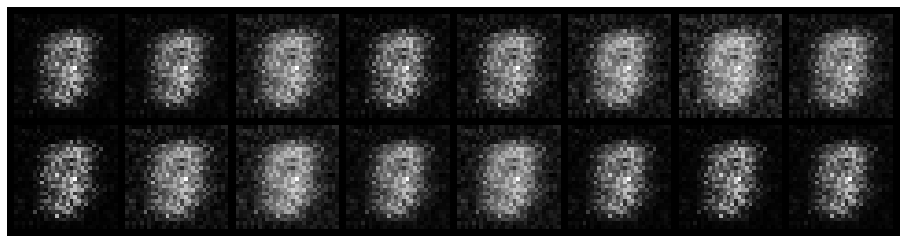

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 1.1656, Generator Loss: 1.6803
D(x): 0.6532, D(G(z)): 0.3141
gen_epochs:1 ,dis_epochs:1


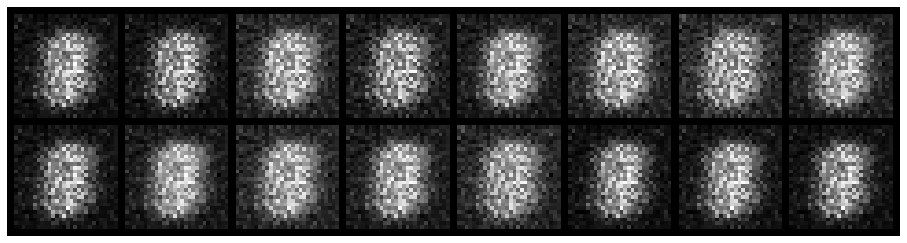

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.6712, Generator Loss: 3.7165
D(x): 0.8535, D(G(z)): 0.2295
gen_epochs:1 ,dis_epochs:1


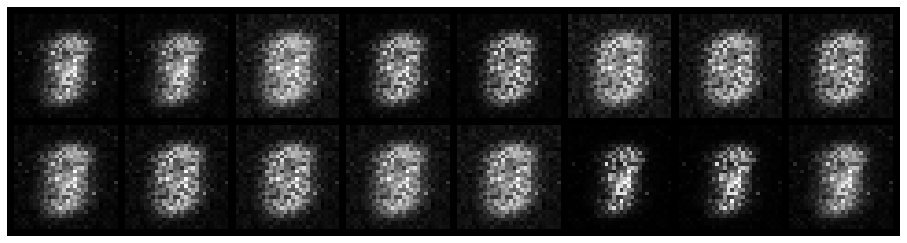

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.7899, Generator Loss: 2.0070
D(x): 0.7486, D(G(z)): 0.2383
gen_epochs:1 ,dis_epochs:1


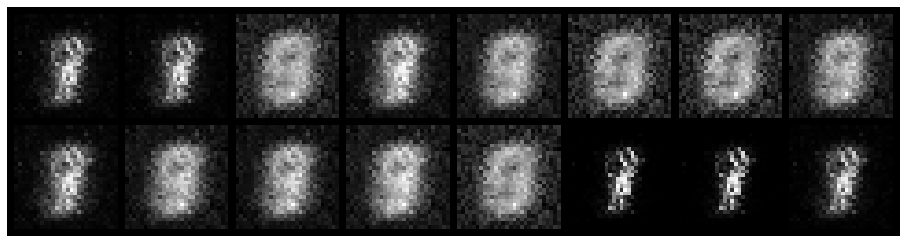

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.4417, Generator Loss: 1.8227
D(x): 0.8410, D(G(z)): 0.1754
gen_epochs:1 ,dis_epochs:1


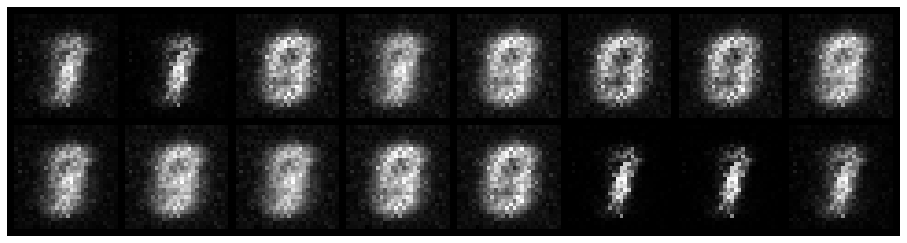

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.7478, Generator Loss: 1.7687
D(x): 0.8180, D(G(z)): 0.3055
gen_epochs:1 ,dis_epochs:1


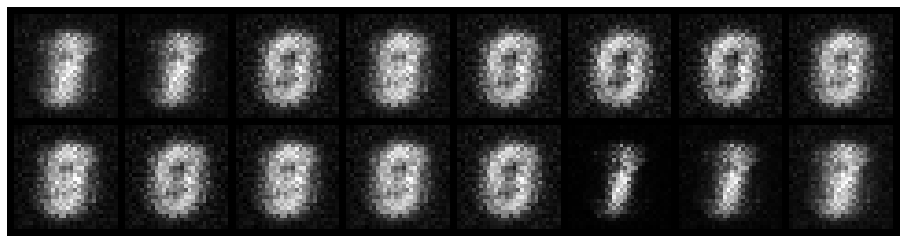

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.6315, Generator Loss: 1.9513
D(x): 0.7687, D(G(z)): 0.1883
gen_epochs:1 ,dis_epochs:1


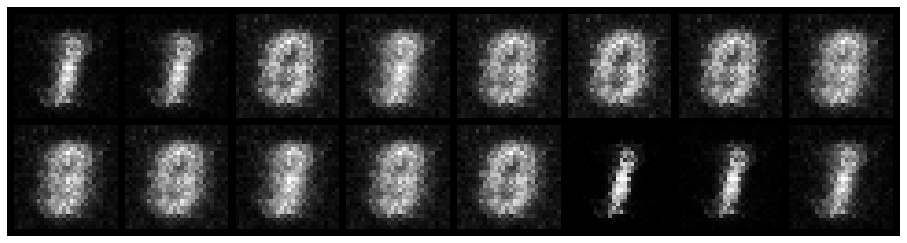

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.7347, Generator Loss: 2.2134
D(x): 0.7987, D(G(z)): 0.1429
gen_epochs:1 ,dis_epochs:1


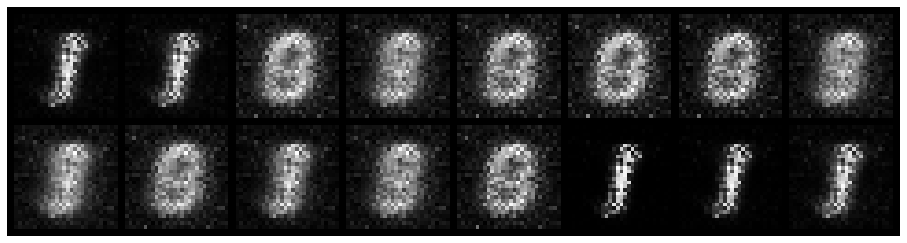

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.3602, Generator Loss: 2.8976
D(x): 0.8654, D(G(z)): 0.0805
gen_epochs:1 ,dis_epochs:1


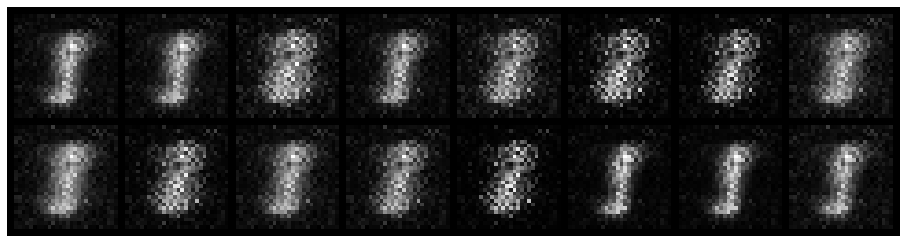

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.0910, Generator Loss: 3.5395
D(x): 0.9674, D(G(z)): 0.0456
gen_epochs:1 ,dis_epochs:1


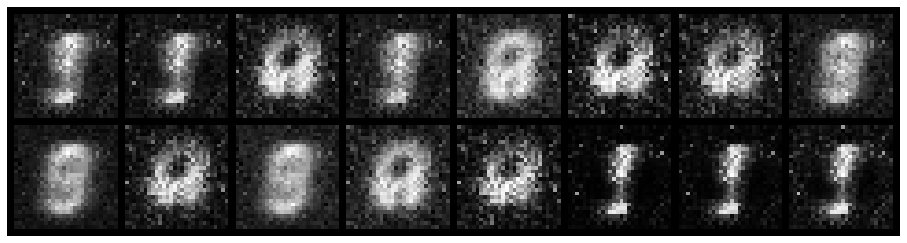

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.5594, Generator Loss: 3.5448
D(x): 0.9120, D(G(z)): 0.1552
gen_epochs:1 ,dis_epochs:1


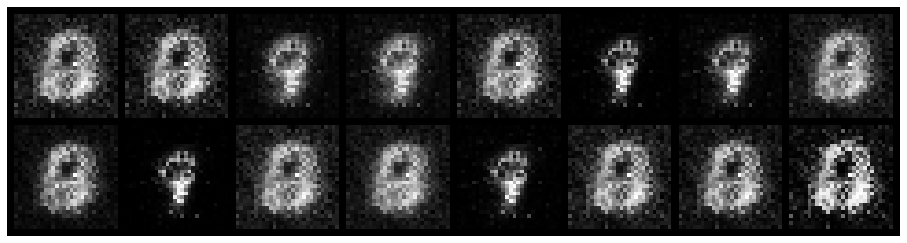

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.6677, Generator Loss: 1.9972
D(x): 0.7750, D(G(z)): 0.1737
gen_epochs:1 ,dis_epochs:1


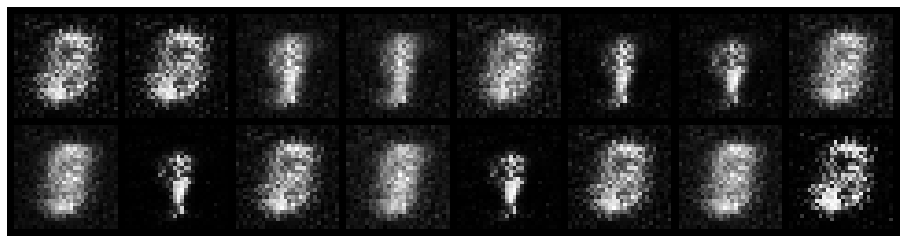

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.4593, Generator Loss: 2.5746
D(x): 0.8821, D(G(z)): 0.1802
gen_epochs:1 ,dis_epochs:1


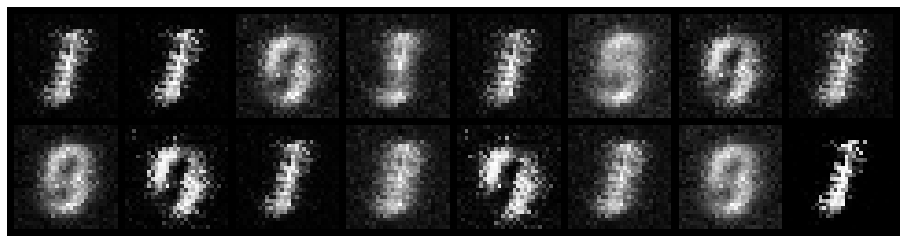

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.4901, Generator Loss: 2.9140
D(x): 0.8079, D(G(z)): 0.1340
gen_epochs:1 ,dis_epochs:1


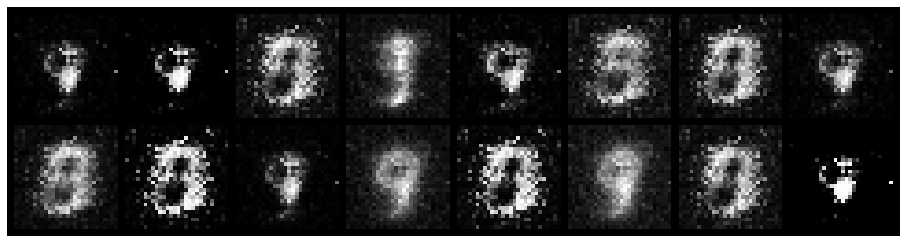

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.4507, Generator Loss: 2.6592
D(x): 0.8366, D(G(z)): 0.1416
gen_epochs:1 ,dis_epochs:1


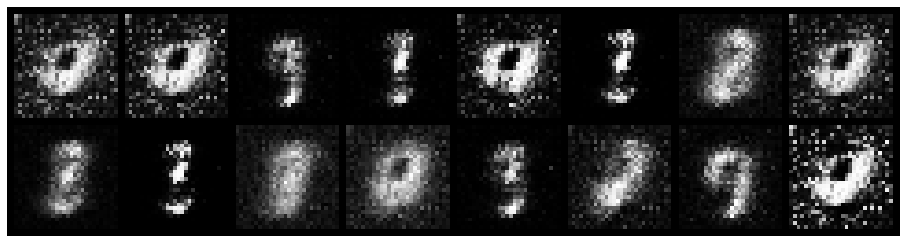

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.4224, Generator Loss: 3.1255
D(x): 0.8848, D(G(z)): 0.1178
gen_epochs:1 ,dis_epochs:1


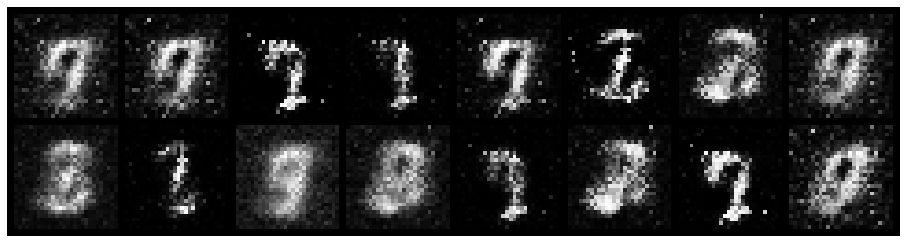

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.4787, Generator Loss: 2.6657
D(x): 0.8656, D(G(z)): 0.1667
gen_epochs:1 ,dis_epochs:1


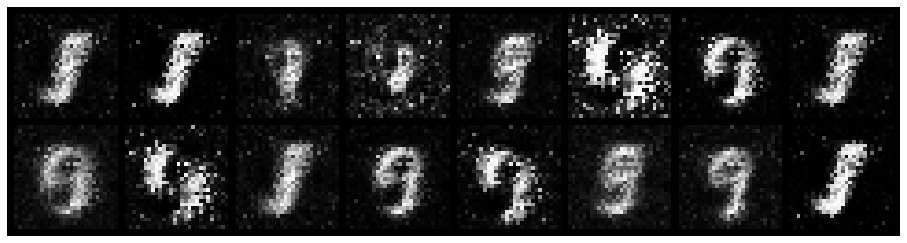

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.3481, Generator Loss: 2.8886
D(x): 0.8620, D(G(z)): 0.1077
gen_epochs:1 ,dis_epochs:1


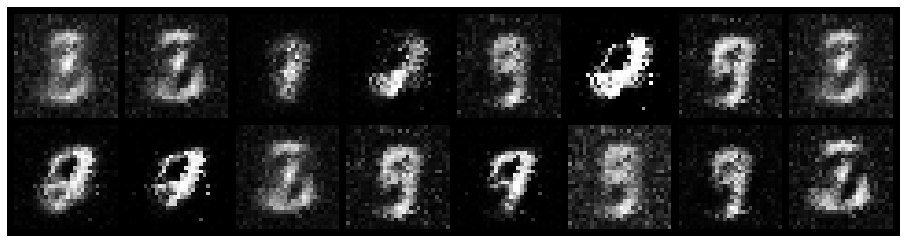

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.8998, Generator Loss: 1.6838
D(x): 0.7692, D(G(z)): 0.2637
gen_epochs:1 ,dis_epochs:1


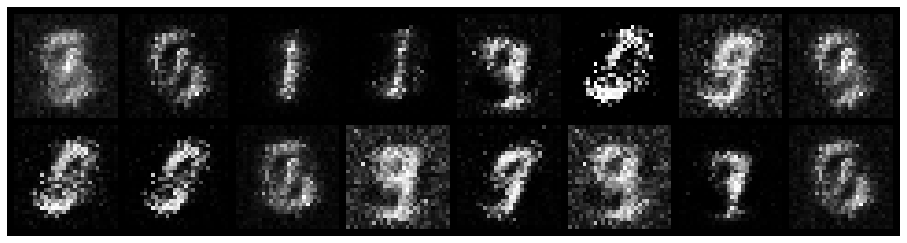

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.8333, Generator Loss: 1.3063
D(x): 0.7678, D(G(z)): 0.3046
gen_epochs:1 ,dis_epochs:1


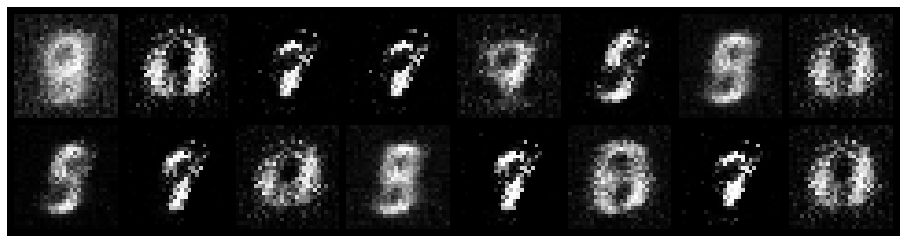

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.5657, Generator Loss: 2.3250
D(x): 0.7989, D(G(z)): 0.1462
gen_epochs:1 ,dis_epochs:1


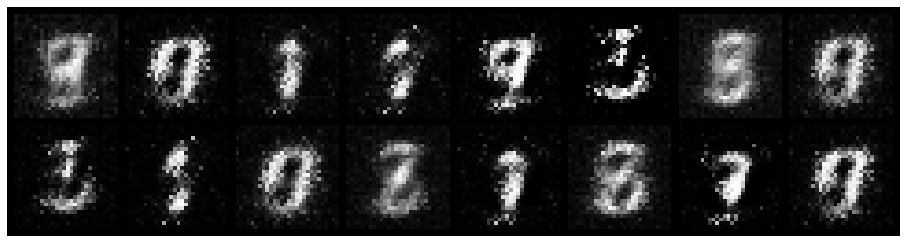

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.5752, Generator Loss: 2.8972
D(x): 0.8163, D(G(z)): 0.1546
gen_epochs:1 ,dis_epochs:1


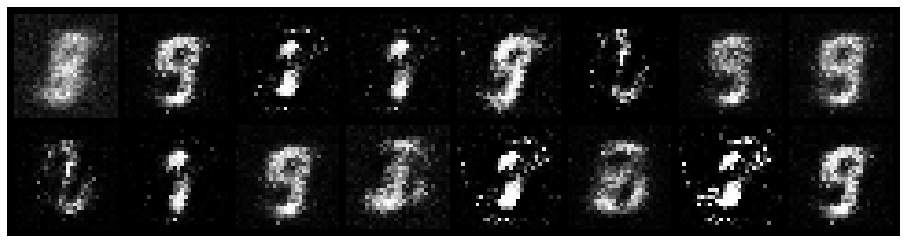

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.6805, Generator Loss: 2.8131
D(x): 0.7859, D(G(z)): 0.1480
gen_epochs:1 ,dis_epochs:1


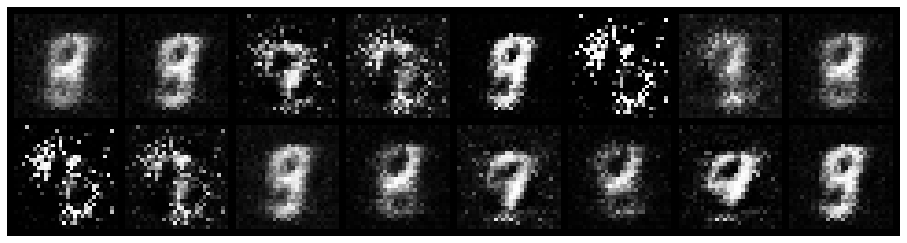

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.2829, Generator Loss: 2.9010
D(x): 0.9017, D(G(z)): 0.0925
gen_epochs:1 ,dis_epochs:1


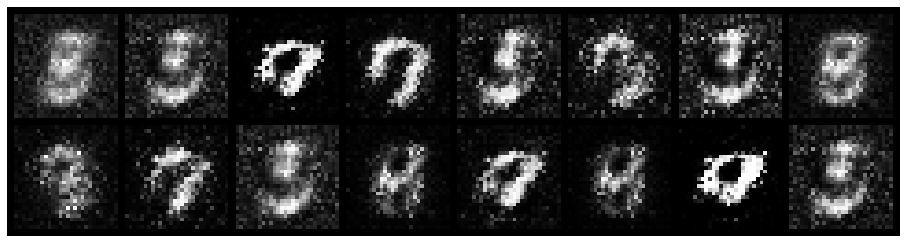

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.5184, Generator Loss: 2.1729
D(x): 0.8376, D(G(z)): 0.1314
gen_epochs:1 ,dis_epochs:1


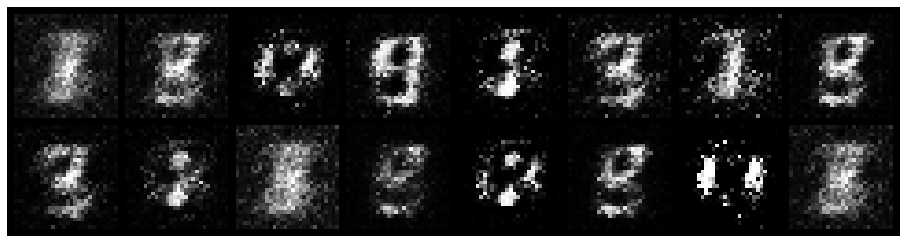

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 1.0350, Generator Loss: 2.6117
D(x): 0.7188, D(G(z)): 0.2487
gen_epochs:1 ,dis_epochs:1


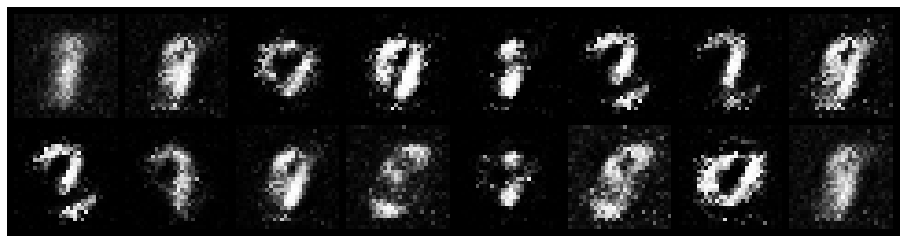

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.9960, Generator Loss: 1.7580
D(x): 0.7510, D(G(z)): 0.2529
gen_epochs:1 ,dis_epochs:1


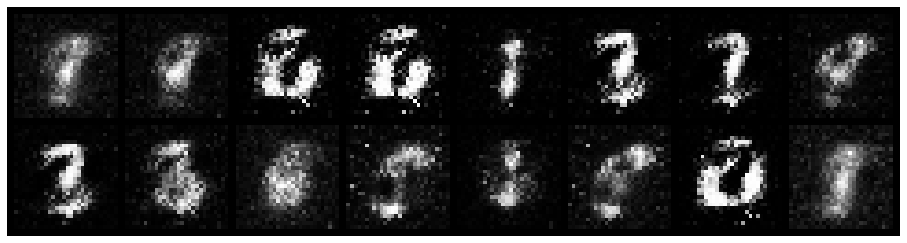

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 1.0728, Generator Loss: 1.8186
D(x): 0.7313, D(G(z)): 0.3182
gen_epochs:1 ,dis_epochs:1


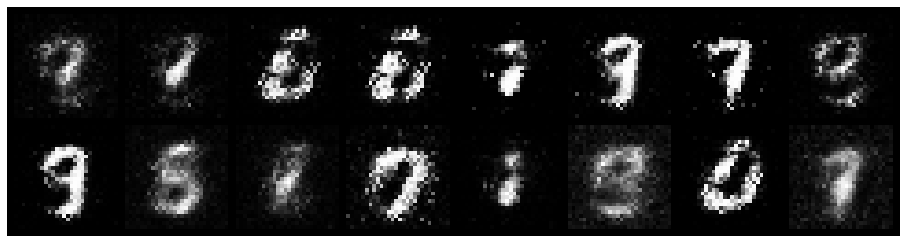

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.6469, Generator Loss: 1.8759
D(x): 0.7974, D(G(z)): 0.2455
gen_epochs:1 ,dis_epochs:1


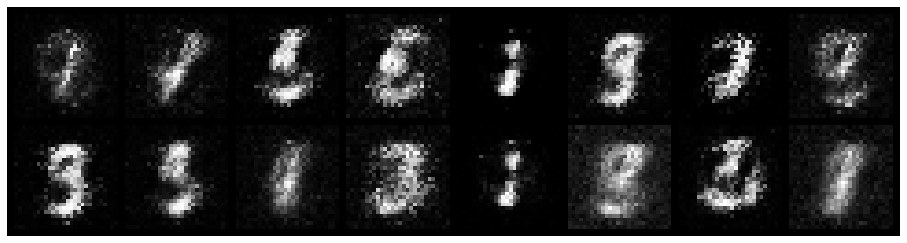

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.3970, Generator Loss: 2.3721
D(x): 0.8745, D(G(z)): 0.1383
gen_epochs:1 ,dis_epochs:1


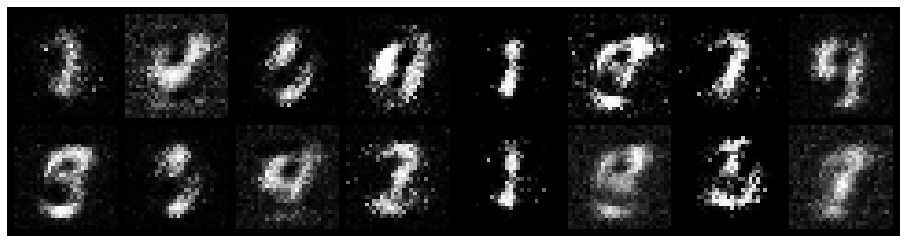

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.5961, Generator Loss: 2.0792
D(x): 0.8076, D(G(z)): 0.2207
gen_epochs:1 ,dis_epochs:1


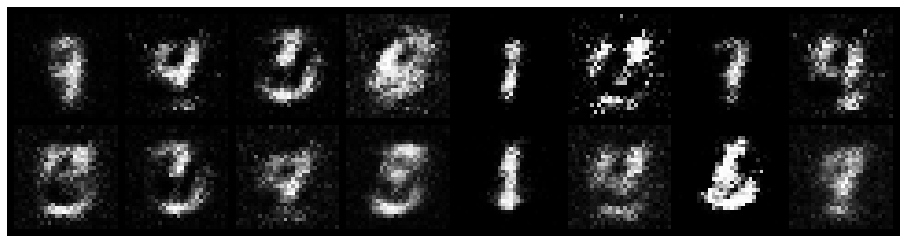

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.4613, Generator Loss: 2.7022
D(x): 0.8655, D(G(z)): 0.1760
gen_epochs:1 ,dis_epochs:1


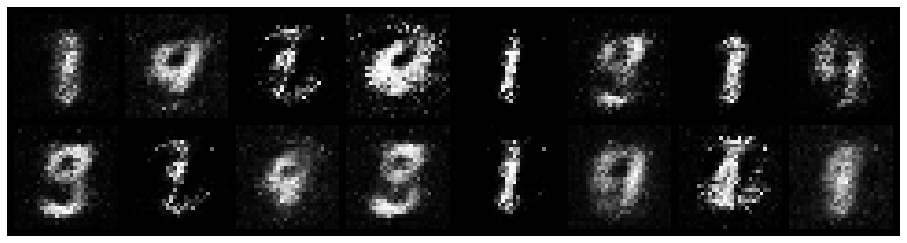

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.4980, Generator Loss: 2.5662
D(x): 0.7946, D(G(z)): 0.1075
gen_epochs:1 ,dis_epochs:1


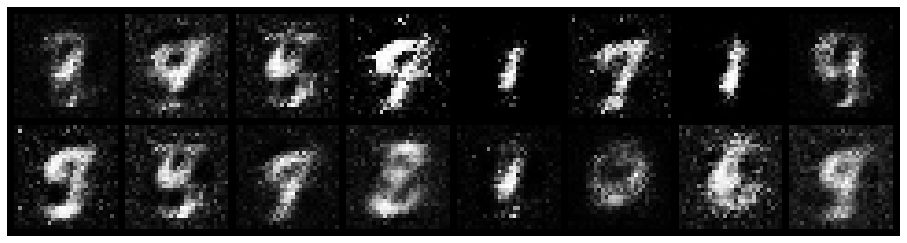

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.6174, Generator Loss: 1.8921
D(x): 0.7846, D(G(z)): 0.2171
gen_epochs:1 ,dis_epochs:1


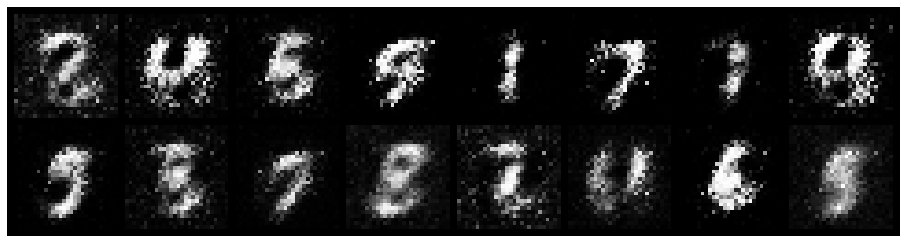

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.7410, Generator Loss: 1.2790
D(x): 0.8004, D(G(z)): 0.3327
gen_epochs:1 ,dis_epochs:1


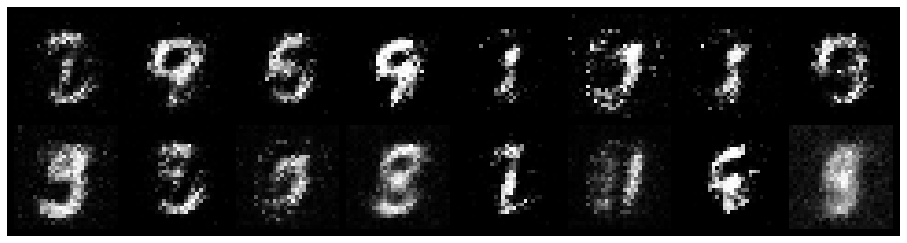

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.6845, Generator Loss: 2.4217
D(x): 0.8181, D(G(z)): 0.2364
gen_epochs:1 ,dis_epochs:1


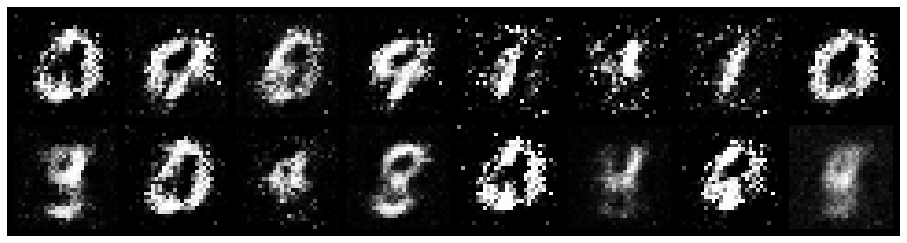

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.9449, Generator Loss: 1.6970
D(x): 0.6907, D(G(z)): 0.2730
gen_epochs:1 ,dis_epochs:1


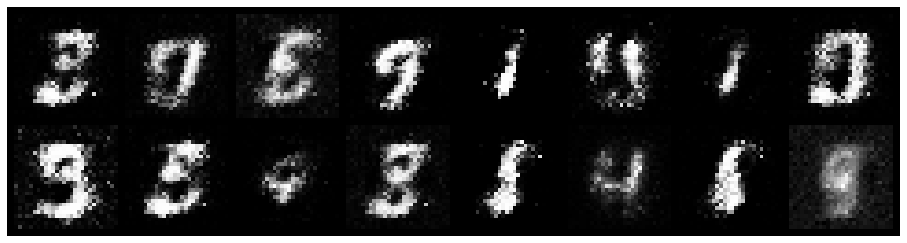

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.8546, Generator Loss: 1.6273
D(x): 0.7895, D(G(z)): 0.3492
gen_epochs:1 ,dis_epochs:1


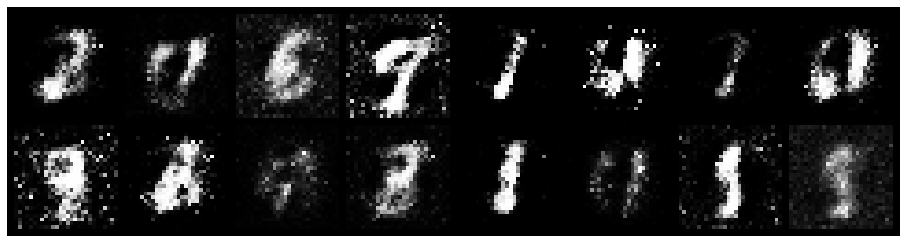

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.6222, Generator Loss: 1.7143
D(x): 0.8422, D(G(z)): 0.2213
gen_epochs:1 ,dis_epochs:1


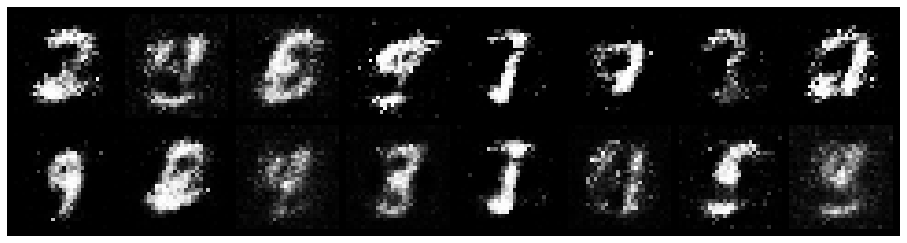

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.4869, Generator Loss: 1.9409
D(x): 0.8759, D(G(z)): 0.2097
gen_epochs:1 ,dis_epochs:1


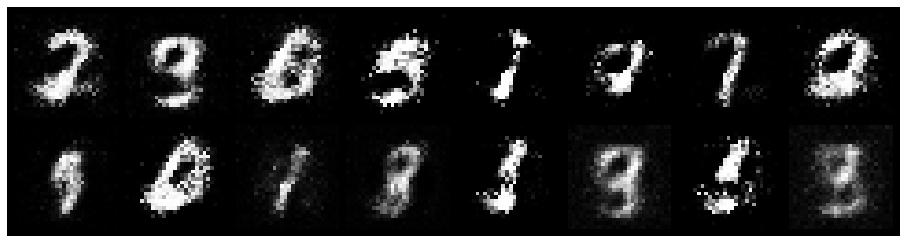

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.4496, Generator Loss: 2.5267
D(x): 0.8560, D(G(z)): 0.1738
gen_epochs:1 ,dis_epochs:1


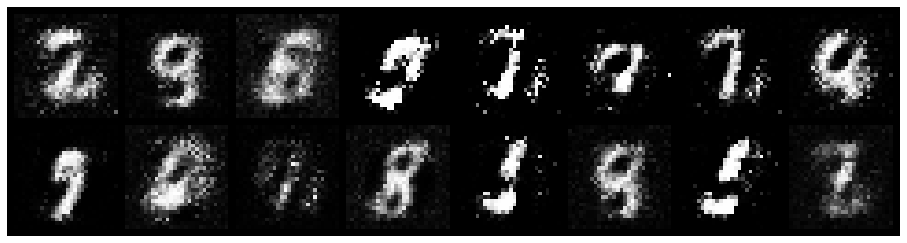

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.4254, Generator Loss: 2.2956
D(x): 0.9171, D(G(z)): 0.2235
gen_epochs:1 ,dis_epochs:1


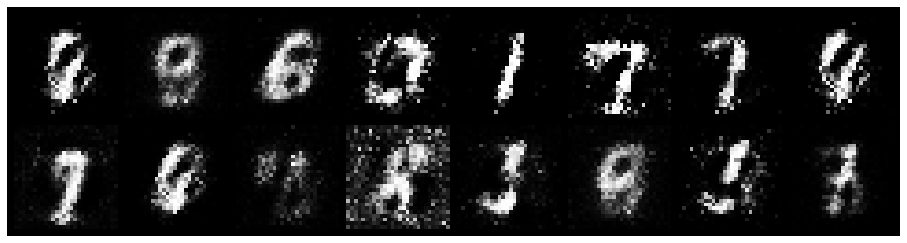

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.7181, Generator Loss: 1.6487
D(x): 0.7808, D(G(z)): 0.2715
gen_epochs:1 ,dis_epochs:1


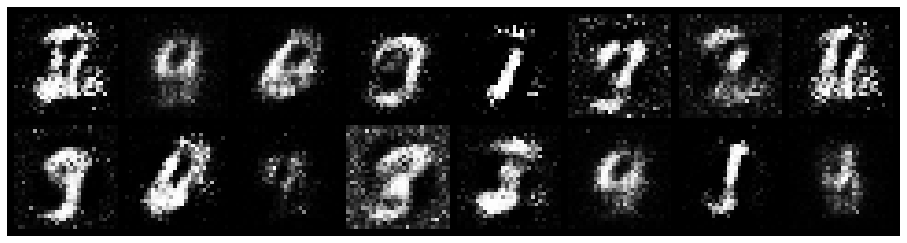

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.5062, Generator Loss: 2.1610
D(x): 0.8041, D(G(z)): 0.1732
gen_epochs:1 ,dis_epochs:1


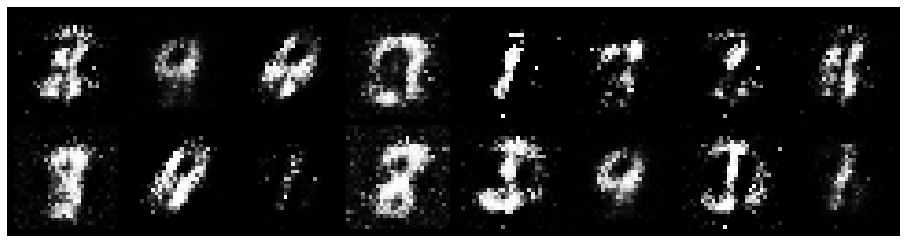

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.4212, Generator Loss: 2.5303
D(x): 0.8654, D(G(z)): 0.1543
gen_epochs:1 ,dis_epochs:1


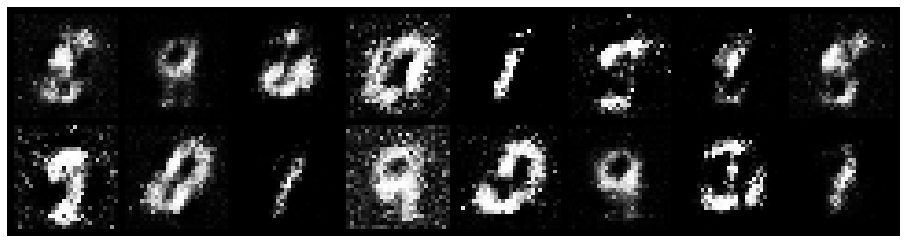

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.9987, Generator Loss: 1.8846
D(x): 0.8144, D(G(z)): 0.3686
gen_epochs:1 ,dis_epochs:1


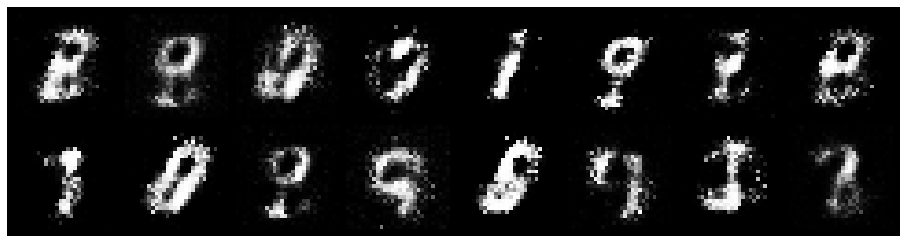

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.6749, Generator Loss: 1.7472
D(x): 0.8306, D(G(z)): 0.3061
gen_epochs:1 ,dis_epochs:1


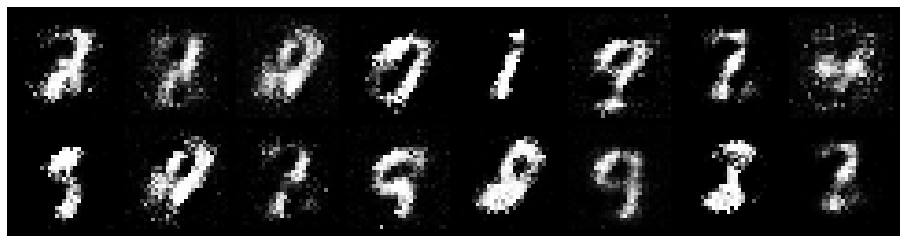

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.6341, Generator Loss: 2.2198
D(x): 0.7659, D(G(z)): 0.1834
gen_epochs:1 ,dis_epochs:1


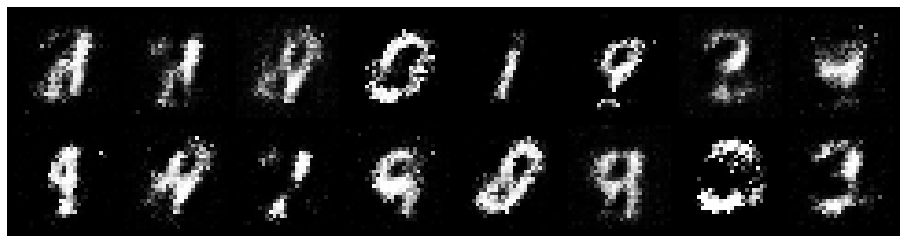

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.6069, Generator Loss: 1.8198
D(x): 0.8957, D(G(z)): 0.3060
gen_epochs:1 ,dis_epochs:1


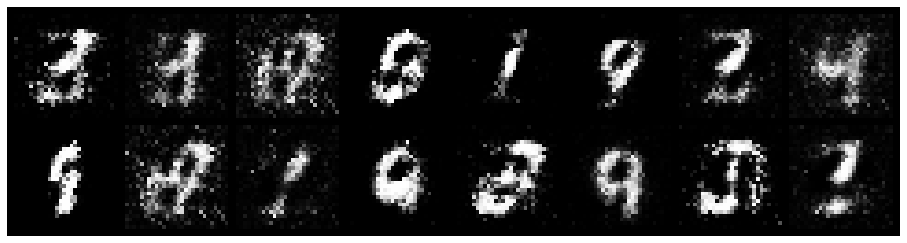

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.6134, Generator Loss: 1.8945
D(x): 0.8509, D(G(z)): 0.2434
gen_epochs:1 ,dis_epochs:1


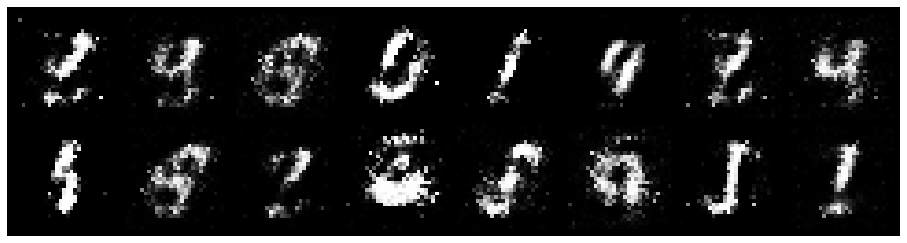

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.6487, Generator Loss: 2.5774
D(x): 0.7602, D(G(z)): 0.1666
gen_epochs:1 ,dis_epochs:1


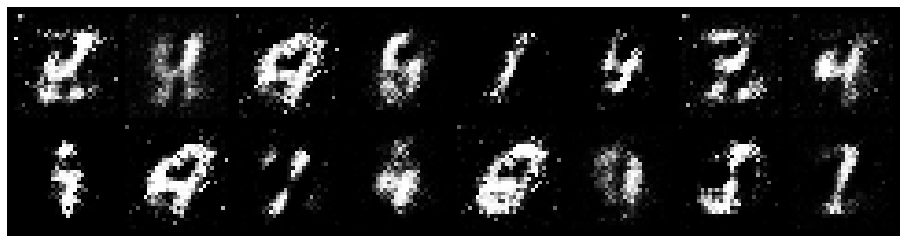

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.7757, Generator Loss: 1.7607
D(x): 0.6912, D(G(z)): 0.2174
gen_epochs:1 ,dis_epochs:1


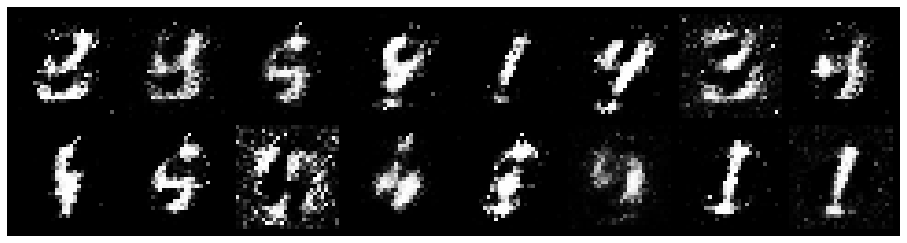

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.8016, Generator Loss: 2.0778
D(x): 0.7074, D(G(z)): 0.2127
gen_epochs:1 ,dis_epochs:1


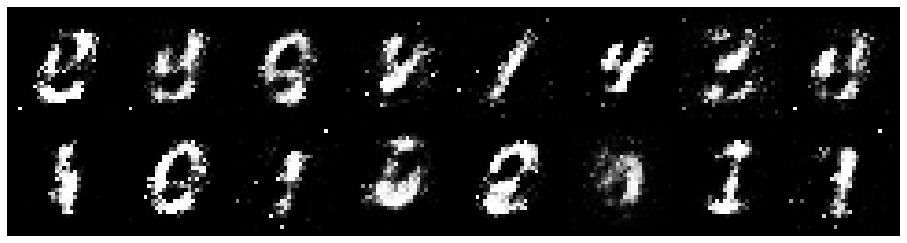

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.9042, Generator Loss: 1.9152
D(x): 0.7093, D(G(z)): 0.2518
gen_epochs:1 ,dis_epochs:1


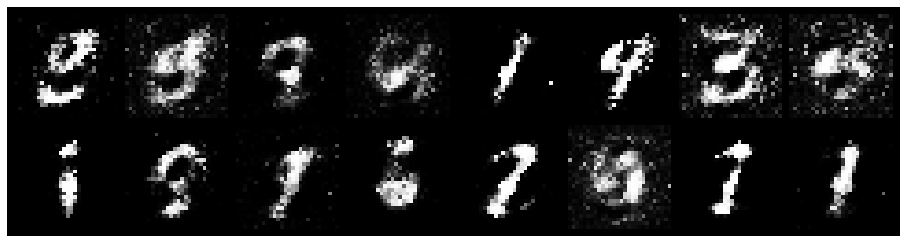

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 1.0486, Generator Loss: 1.6599
D(x): 0.6152, D(G(z)): 0.2555
gen_epochs:1 ,dis_epochs:1


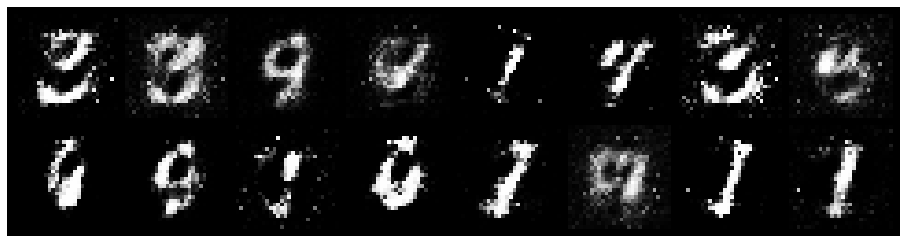

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.7604, Generator Loss: 1.7803
D(x): 0.7621, D(G(z)): 0.2289
gen_epochs:1 ,dis_epochs:1


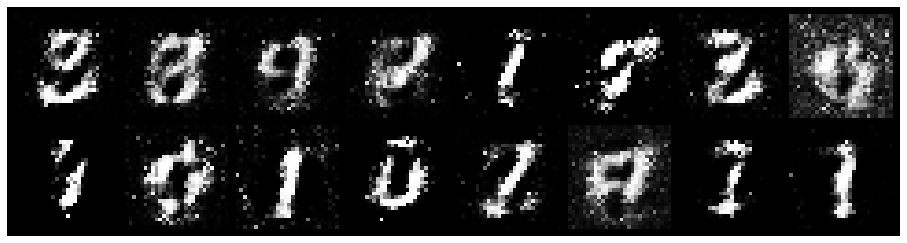

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.8467, Generator Loss: 2.1093
D(x): 0.7071, D(G(z)): 0.2281
gen_epochs:1 ,dis_epochs:1


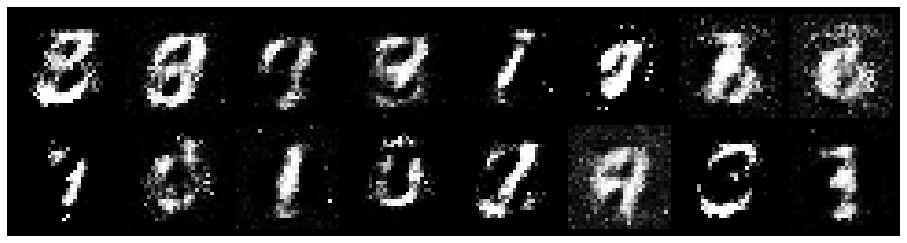

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.8355, Generator Loss: 1.5627
D(x): 0.7866, D(G(z)): 0.2971
gen_epochs:1 ,dis_epochs:1


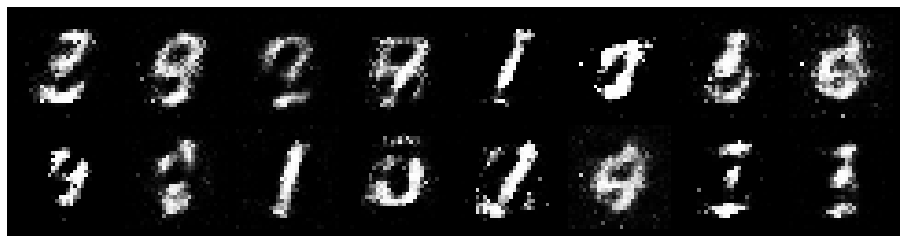

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.6322, Generator Loss: 1.8954
D(x): 0.7831, D(G(z)): 0.1872
gen_epochs:1 ,dis_epochs:1


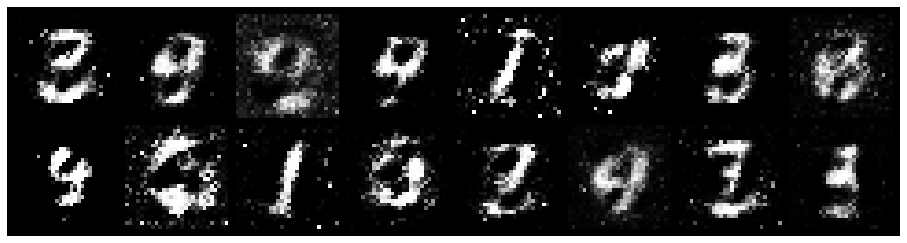

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.6259, Generator Loss: 2.1268
D(x): 0.8017, D(G(z)): 0.2366
gen_epochs:1 ,dis_epochs:1


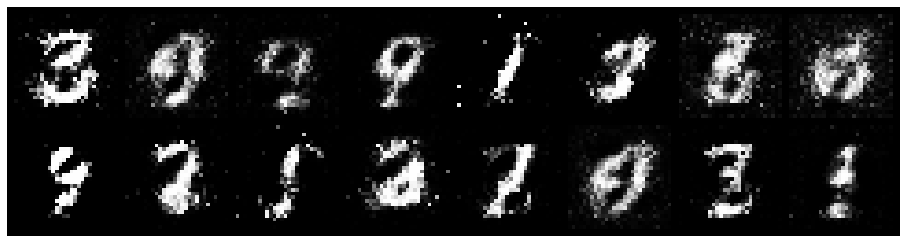

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.6536, Generator Loss: 1.8338
D(x): 0.8254, D(G(z)): 0.2593
gen_epochs:1 ,dis_epochs:1


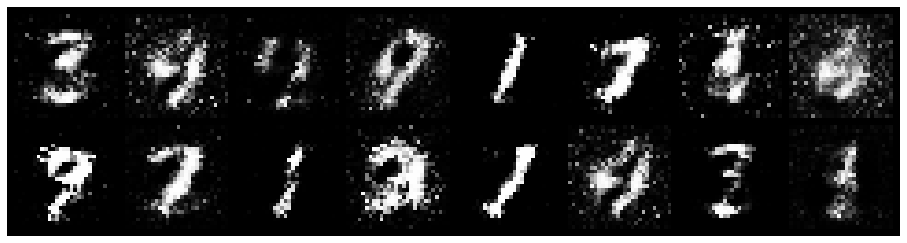

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.7602, Generator Loss: 2.0506
D(x): 0.7241, D(G(z)): 0.2073
gen_epochs:1 ,dis_epochs:1


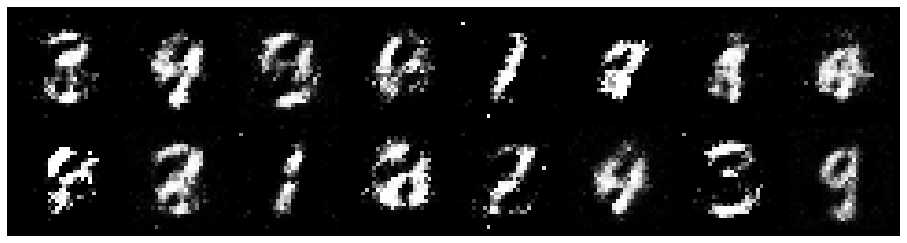

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.9736, Generator Loss: 1.2233
D(x): 0.6558, D(G(z)): 0.3088
gen_epochs:1 ,dis_epochs:1


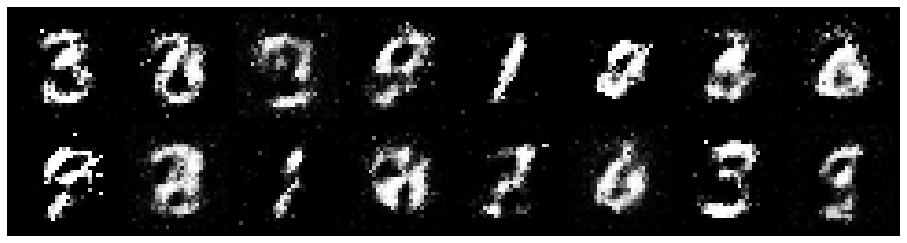

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.8797, Generator Loss: 1.8948
D(x): 0.7602, D(G(z)): 0.3085
gen_epochs:1 ,dis_epochs:1


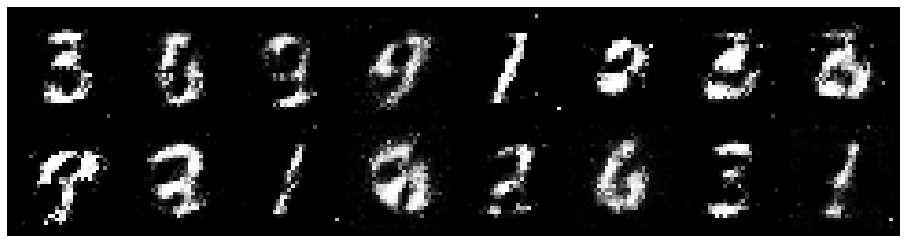

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.7695, Generator Loss: 1.8132
D(x): 0.7462, D(G(z)): 0.2328
gen_epochs:1 ,dis_epochs:1


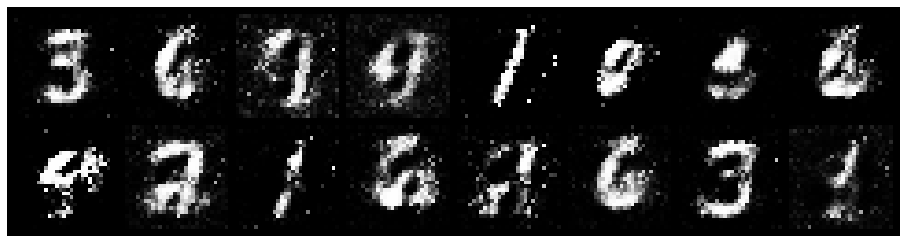

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.8707, Generator Loss: 1.8429
D(x): 0.7053, D(G(z)): 0.2190
gen_epochs:1 ,dis_epochs:1


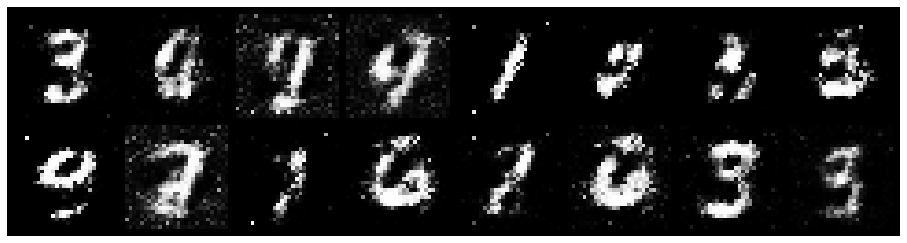

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.8813, Generator Loss: 1.6276
D(x): 0.7214, D(G(z)): 0.2727
gen_epochs:1 ,dis_epochs:1


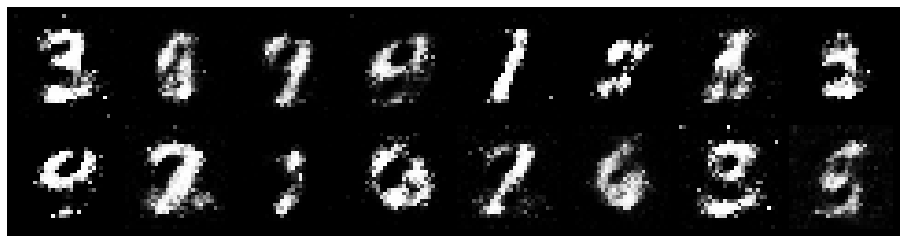

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.8625, Generator Loss: 1.8625
D(x): 0.6400, D(G(z)): 0.2179
gen_epochs:1 ,dis_epochs:1


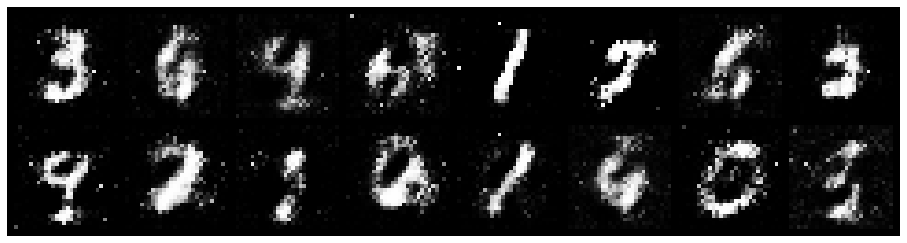

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.6520, Generator Loss: 1.5375
D(x): 0.7845, D(G(z)): 0.2460
gen_epochs:1 ,dis_epochs:1


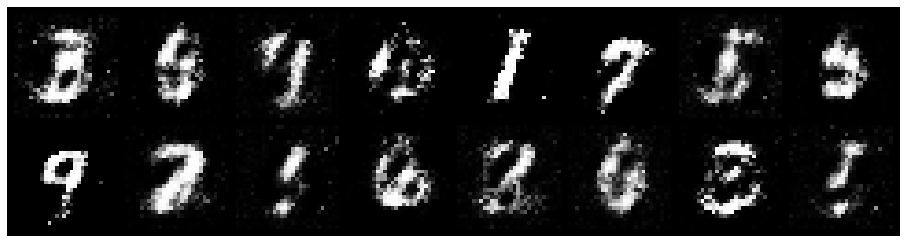

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.9499, Generator Loss: 1.6233
D(x): 0.7440, D(G(z)): 0.3197
gen_epochs:1 ,dis_epochs:1


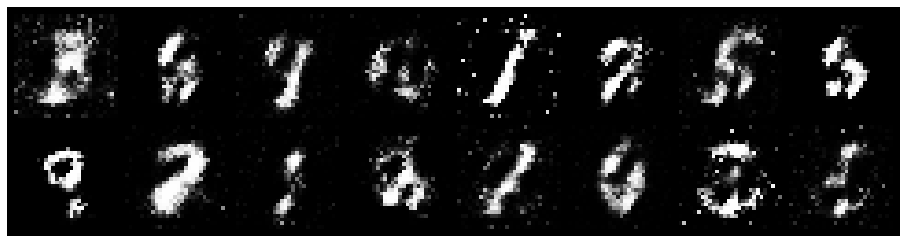

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.7315, Generator Loss: 1.7042
D(x): 0.8093, D(G(z)): 0.2889
gen_epochs:1 ,dis_epochs:1


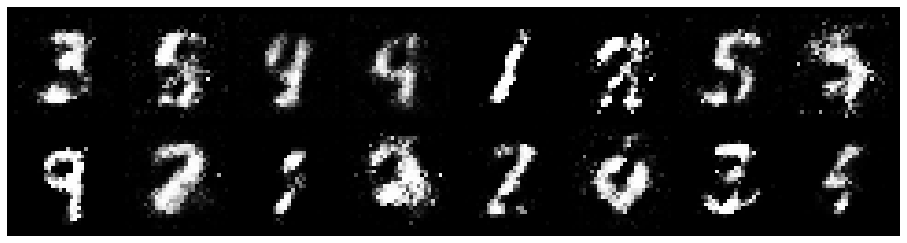

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.9531, Generator Loss: 2.3125
D(x): 0.6656, D(G(z)): 0.1849
gen_epochs:1 ,dis_epochs:1


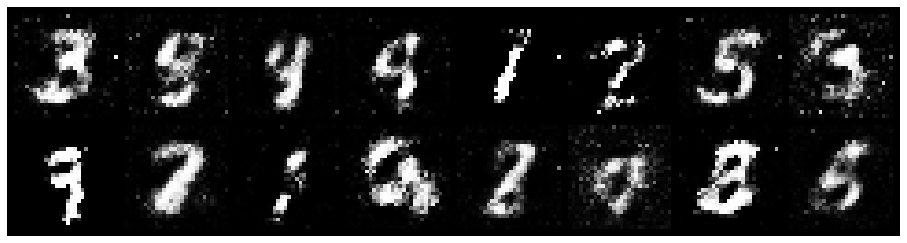

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.6416, Generator Loss: 2.1050
D(x): 0.7264, D(G(z)): 0.1506
gen_epochs:1 ,dis_epochs:1


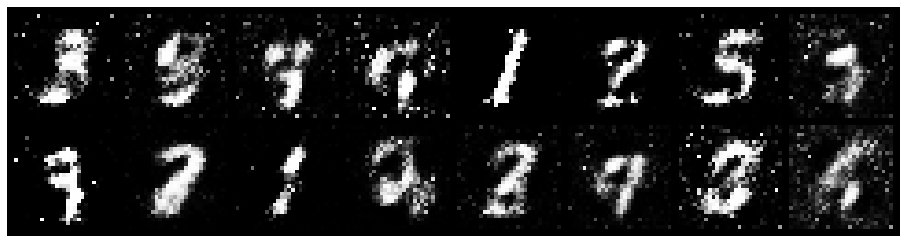

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.9008, Generator Loss: 1.5982
D(x): 0.6659, D(G(z)): 0.2523
gen_epochs:1 ,dis_epochs:1


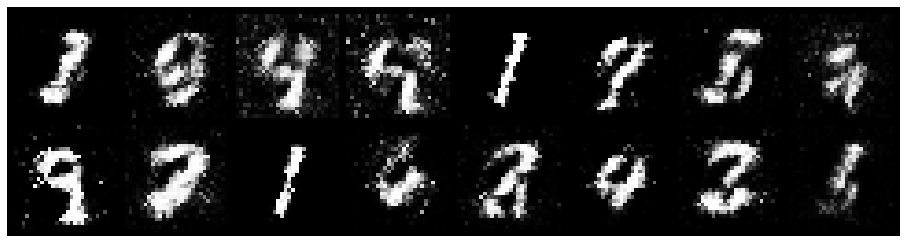

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.7090, Generator Loss: 1.7035
D(x): 0.7587, D(G(z)): 0.2622
gen_epochs:1 ,dis_epochs:1


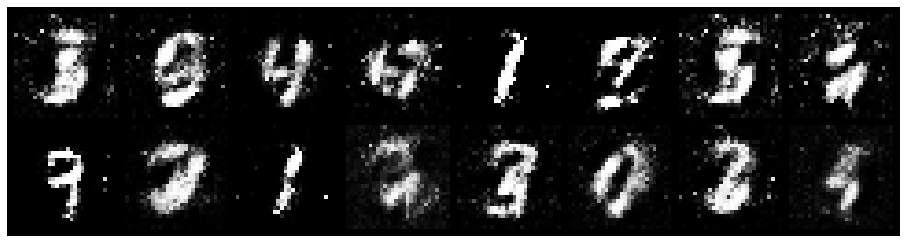

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.9781, Generator Loss: 1.6454
D(x): 0.6542, D(G(z)): 0.2974
gen_epochs:1 ,dis_epochs:1


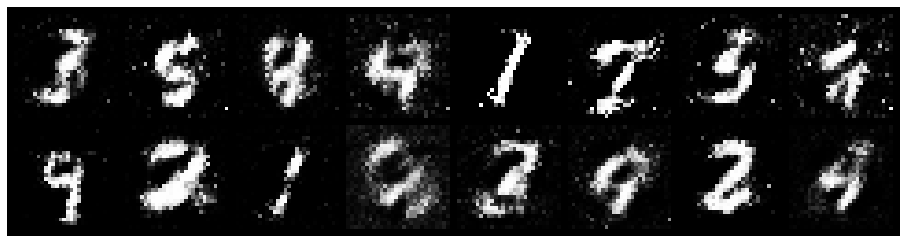

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.6363, Generator Loss: 2.2031
D(x): 0.7852, D(G(z)): 0.2104
gen_epochs:1 ,dis_epochs:1


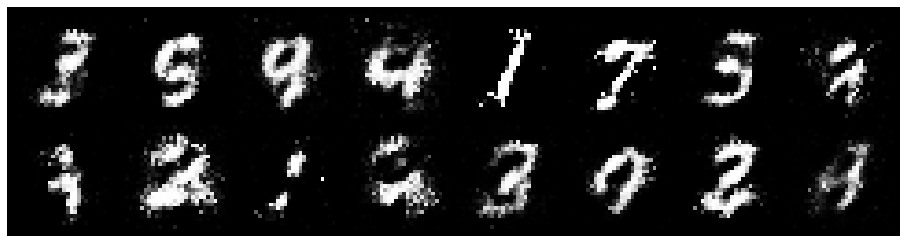

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.9542, Generator Loss: 1.8660
D(x): 0.7392, D(G(z)): 0.3239
gen_epochs:1 ,dis_epochs:1


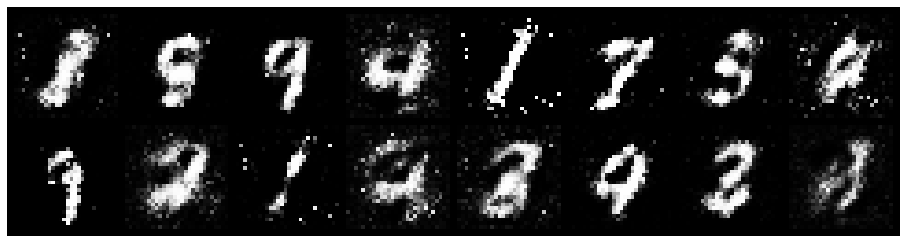

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.7178, Generator Loss: 1.9105
D(x): 0.7686, D(G(z)): 0.2288
gen_epochs:1 ,dis_epochs:1


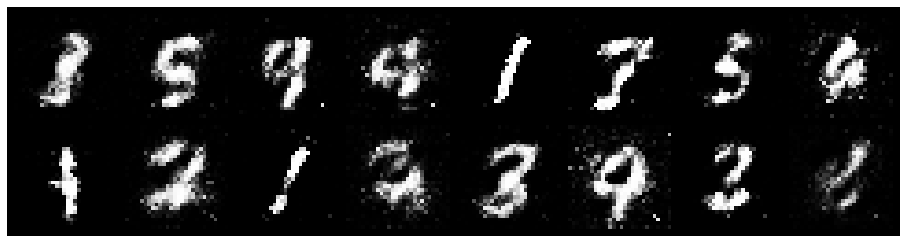

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.8416, Generator Loss: 1.5662
D(x): 0.7850, D(G(z)): 0.2700
gen_epochs:1 ,dis_epochs:1


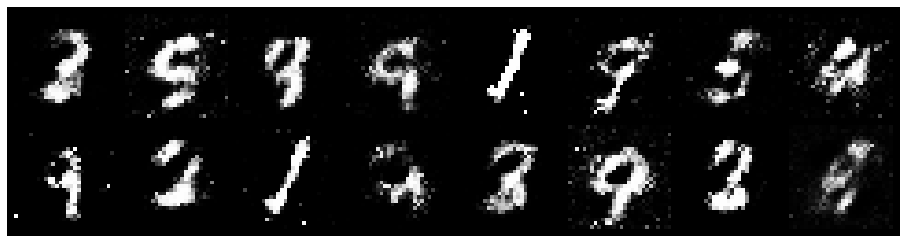

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.8052, Generator Loss: 1.9416
D(x): 0.7394, D(G(z)): 0.2373
gen_epochs:1 ,dis_epochs:1


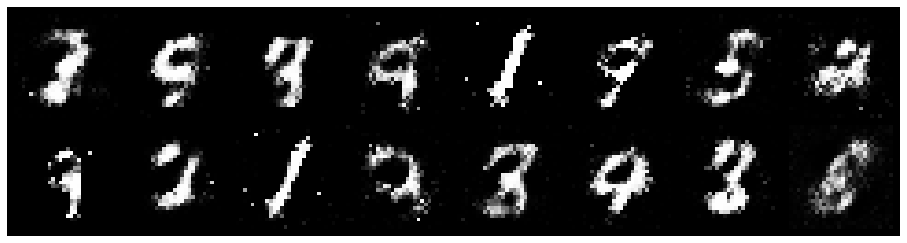

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.5983, Generator Loss: 2.0747
D(x): 0.7848, D(G(z)): 0.2068
gen_epochs:1 ,dis_epochs:1


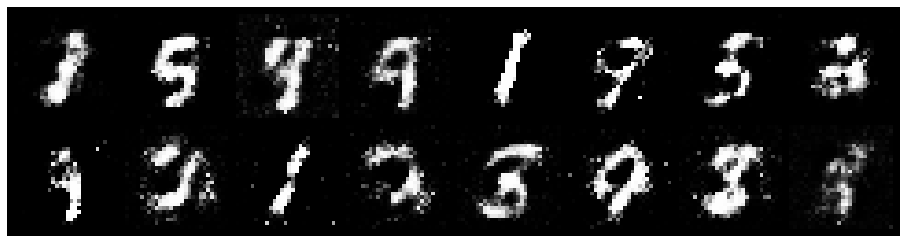

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.9022, Generator Loss: 1.5729
D(x): 0.6985, D(G(z)): 0.2264
gen_epochs:1 ,dis_epochs:1


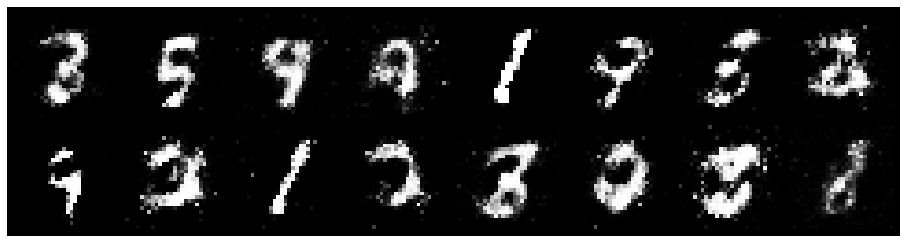

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.6723, Generator Loss: 1.9247
D(x): 0.8183, D(G(z)): 0.2560
gen_epochs:1 ,dis_epochs:1


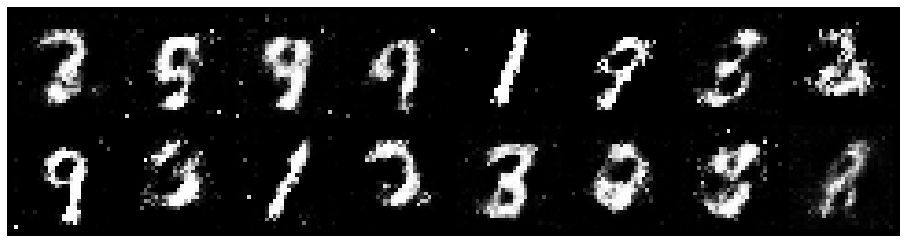

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 1.1450, Generator Loss: 1.6175
D(x): 0.5811, D(G(z)): 0.2141
gen_epochs:1 ,dis_epochs:1


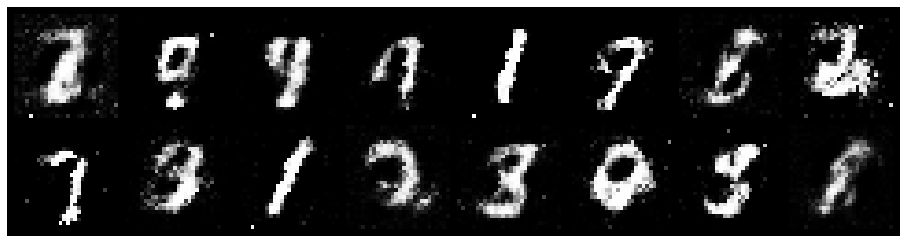

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.7773, Generator Loss: 1.7190
D(x): 0.8327, D(G(z)): 0.2931
gen_epochs:1 ,dis_epochs:1


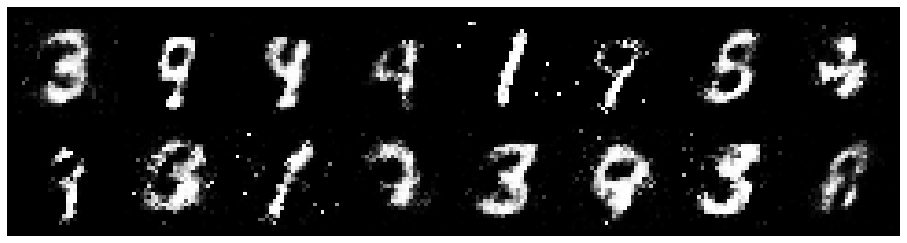

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 0.8040, Generator Loss: 1.9369
D(x): 0.6738, D(G(z)): 0.1946
gen_epochs:1 ,dis_epochs:1


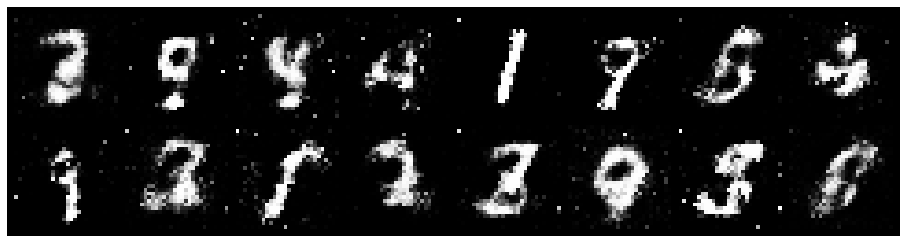

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.7085, Generator Loss: 1.8835
D(x): 0.7257, D(G(z)): 0.2067
gen_epochs:1 ,dis_epochs:1


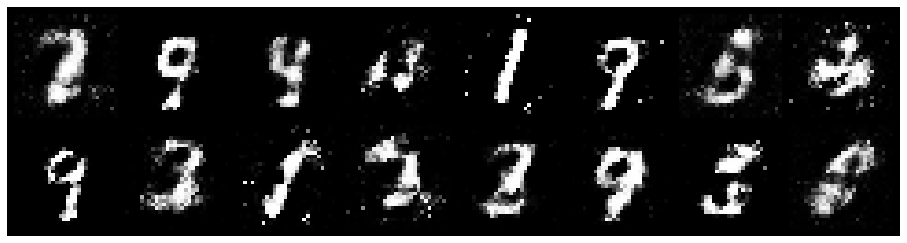

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.6405, Generator Loss: 1.8167
D(x): 0.7838, D(G(z)): 0.2357
gen_epochs:1 ,dis_epochs:1


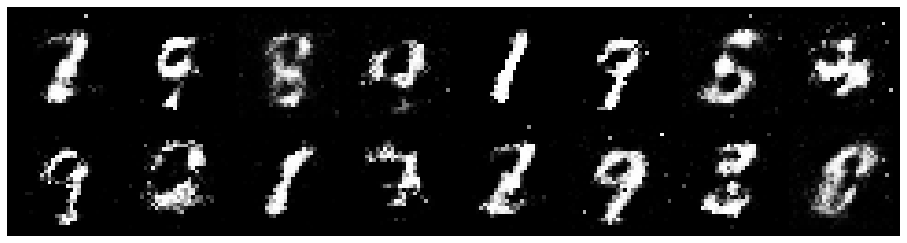

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.7526, Generator Loss: 1.7019
D(x): 0.7360, D(G(z)): 0.2347
gen_epochs:1 ,dis_epochs:1


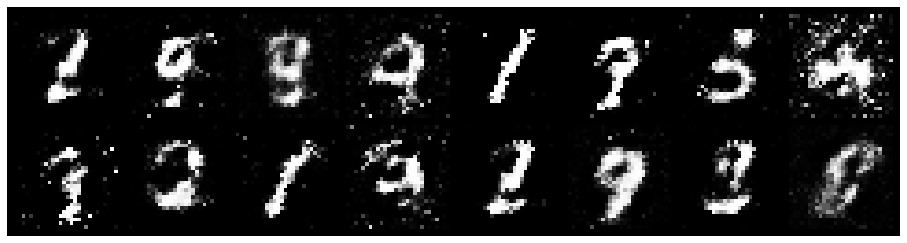

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.8334, Generator Loss: 1.6126
D(x): 0.7246, D(G(z)): 0.2871
gen_epochs:1 ,dis_epochs:1


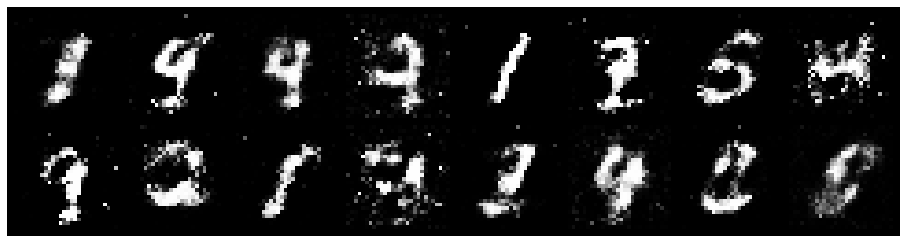

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.8632, Generator Loss: 1.4799
D(x): 0.7510, D(G(z)): 0.3272
gen_epochs:1 ,dis_epochs:1


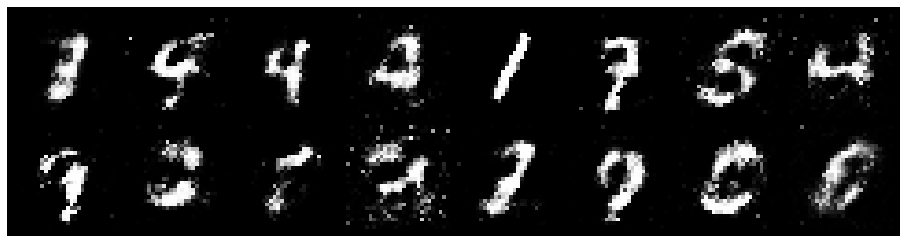

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.9795, Generator Loss: 1.4968
D(x): 0.7100, D(G(z)): 0.3489
gen_epochs:1 ,dis_epochs:1


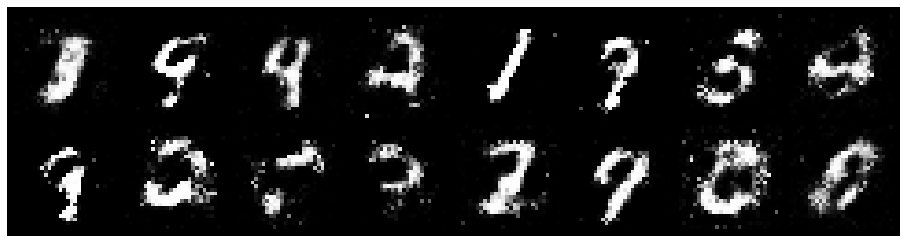

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.7719, Generator Loss: 1.5656
D(x): 0.7966, D(G(z)): 0.3241
gen_epochs:1 ,dis_epochs:1


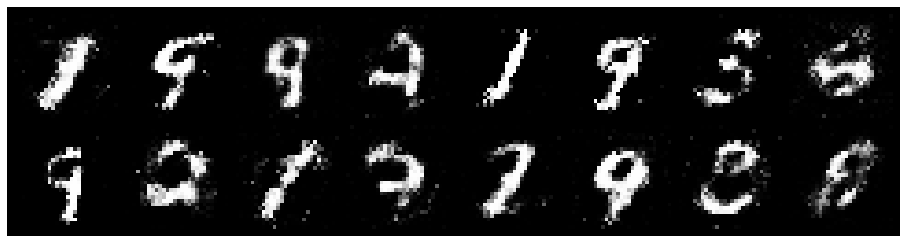

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.7300, Generator Loss: 1.6951
D(x): 0.7391, D(G(z)): 0.2290
gen_epochs:1 ,dis_epochs:1


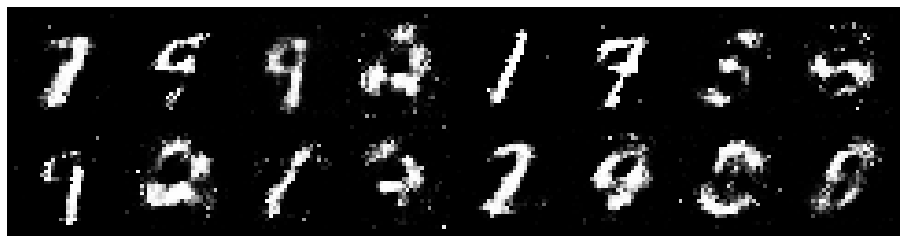

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.7307, Generator Loss: 1.5212
D(x): 0.7503, D(G(z)): 0.2683
gen_epochs:1 ,dis_epochs:1


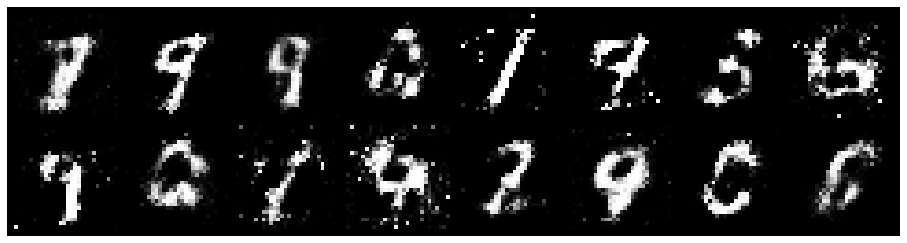

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 1.0735, Generator Loss: 1.6848
D(x): 0.6932, D(G(z)): 0.3239
gen_epochs:1 ,dis_epochs:1


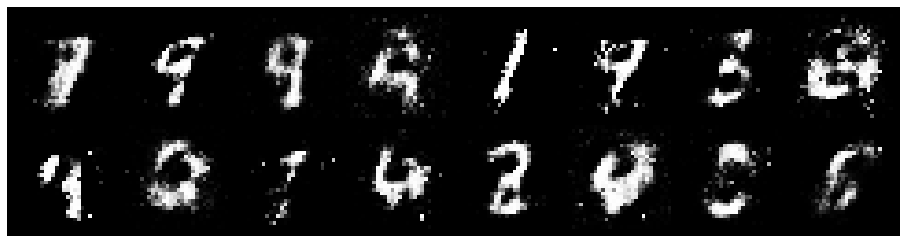

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.9903, Generator Loss: 1.6579
D(x): 0.6818, D(G(z)): 0.2675
gen_epochs:1 ,dis_epochs:1


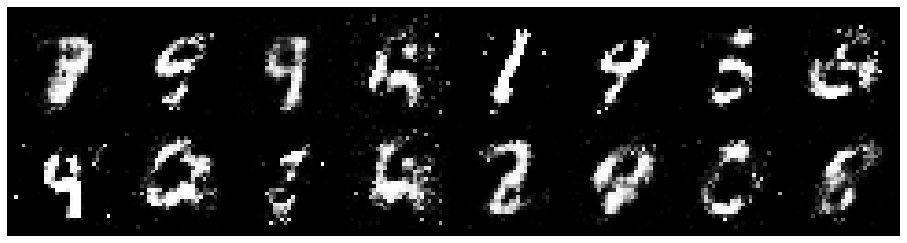

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 1.3161, Generator Loss: 1.1484
D(x): 0.5711, D(G(z)): 0.3911
gen_epochs:1 ,dis_epochs:1


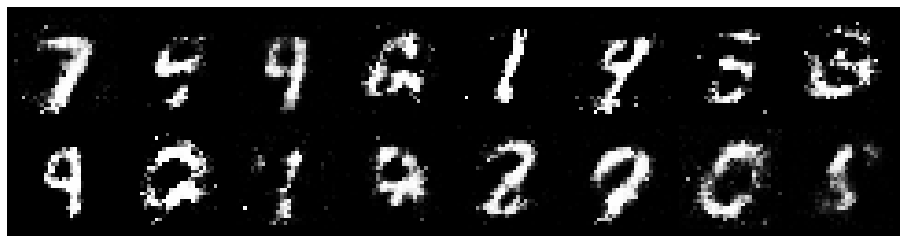

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 1.2456, Generator Loss: 1.4847
D(x): 0.6481, D(G(z)): 0.4213
gen_epochs:1 ,dis_epochs:1


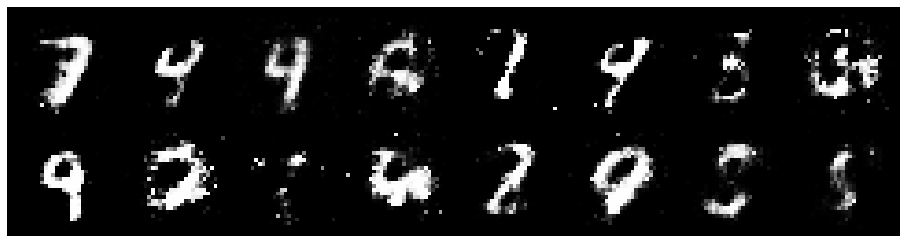

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.8000, Generator Loss: 1.7167
D(x): 0.7318, D(G(z)): 0.2673
gen_epochs:1 ,dis_epochs:1


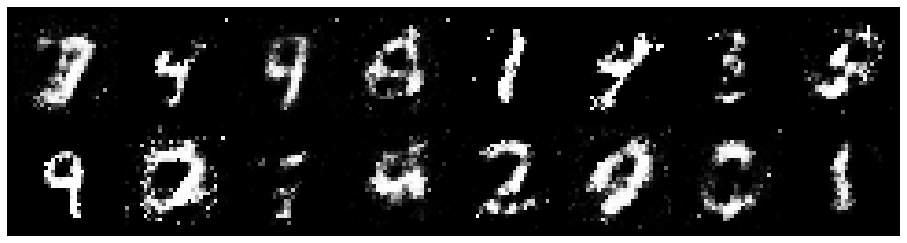

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 0.9129, Generator Loss: 1.6022
D(x): 0.6560, D(G(z)): 0.2411
gen_epochs:1 ,dis_epochs:1


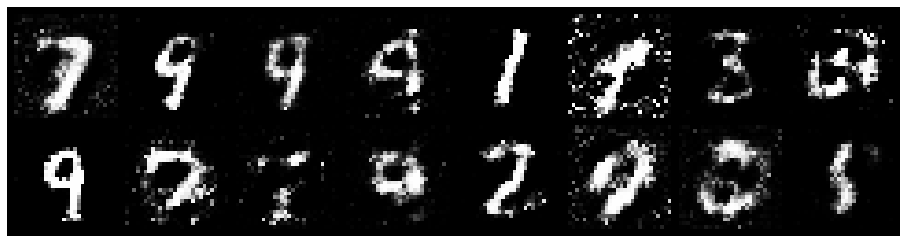

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 0.7863, Generator Loss: 1.6922
D(x): 0.7175, D(G(z)): 0.2565
gen_epochs:1 ,dis_epochs:1


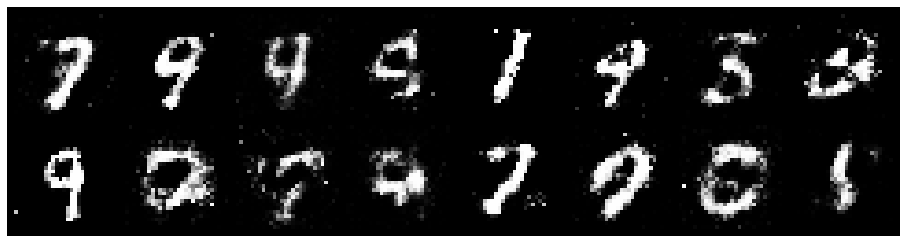

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.7782, Generator Loss: 2.1270
D(x): 0.7160, D(G(z)): 0.2041
gen_epochs:1 ,dis_epochs:1


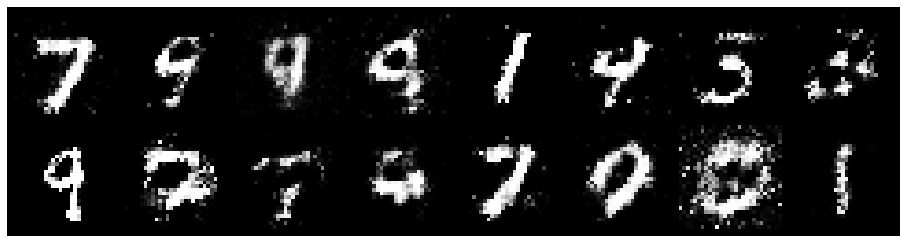

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 0.7564, Generator Loss: 1.5713
D(x): 0.7407, D(G(z)): 0.2917
gen_epochs:1 ,dis_epochs:1


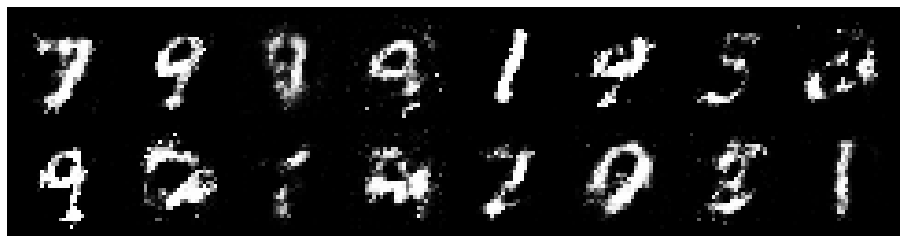

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.7549, Generator Loss: 1.6596
D(x): 0.7356, D(G(z)): 0.2613
gen_epochs:1 ,dis_epochs:1


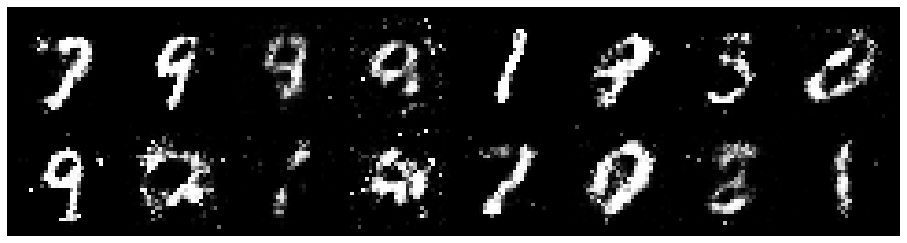

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 0.7672, Generator Loss: 1.3282
D(x): 0.7409, D(G(z)): 0.2891
gen_epochs:1 ,dis_epochs:1


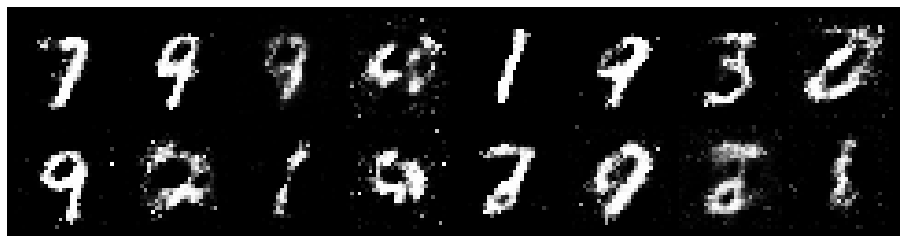

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.8928, Generator Loss: 1.4832
D(x): 0.7327, D(G(z)): 0.3250
gen_epochs:1 ,dis_epochs:1


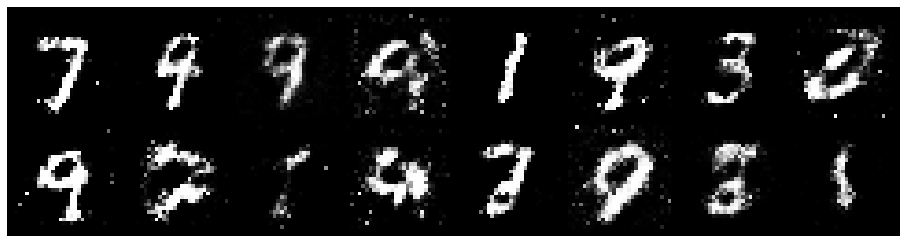

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 0.8751, Generator Loss: 1.7395
D(x): 0.6251, D(G(z)): 0.1783
gen_epochs:1 ,dis_epochs:1


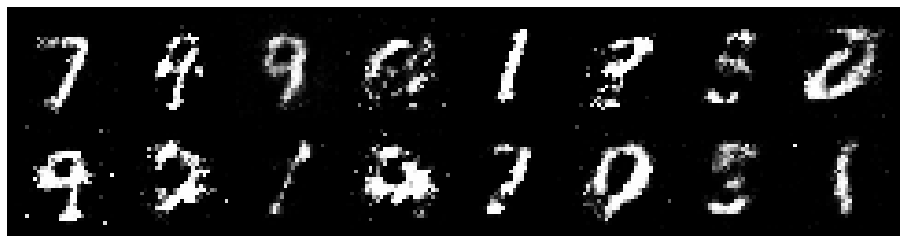

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.8095, Generator Loss: 1.6219
D(x): 0.7517, D(G(z)): 0.3142
gen_epochs:1 ,dis_epochs:1


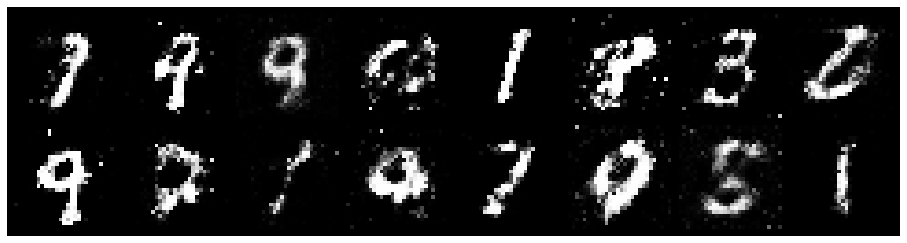

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.8553, Generator Loss: 1.4866
D(x): 0.6915, D(G(z)): 0.2439
gen_epochs:1 ,dis_epochs:1


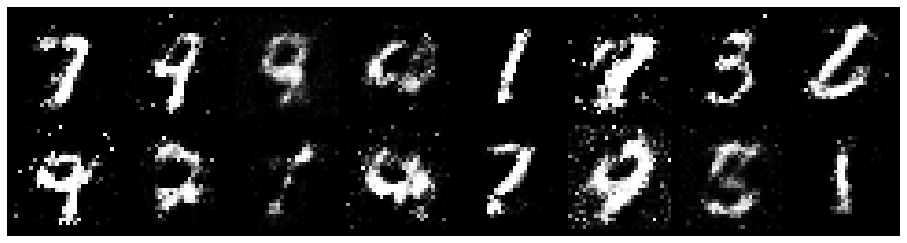

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.8191, Generator Loss: 1.6088
D(x): 0.7548, D(G(z)): 0.3136
gen_epochs:1 ,dis_epochs:1


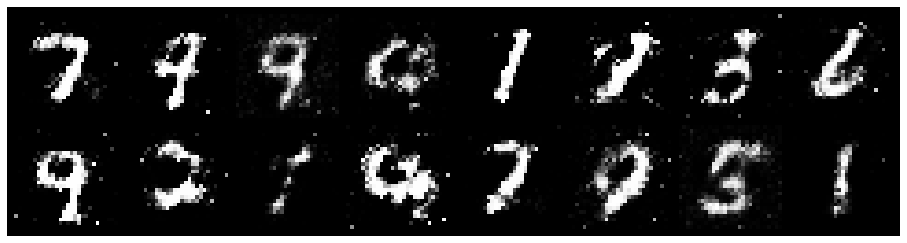

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.8527, Generator Loss: 1.5530
D(x): 0.7794, D(G(z)): 0.3157
gen_epochs:1 ,dis_epochs:1


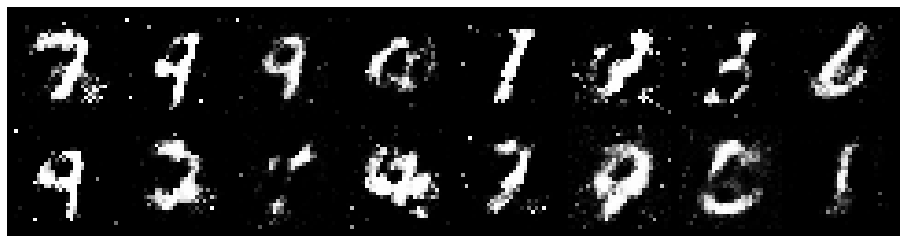

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 1.2211, Generator Loss: 1.5955
D(x): 0.5352, D(G(z)): 0.2612
gen_epochs:1 ,dis_epochs:1


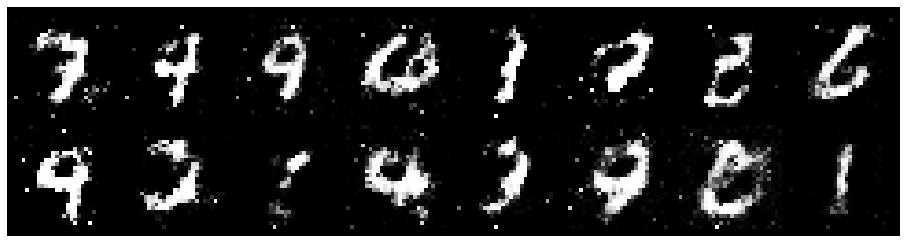

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 1.1517, Generator Loss: 1.4016
D(x): 0.6966, D(G(z)): 0.4259
gen_epochs:1 ,dis_epochs:1


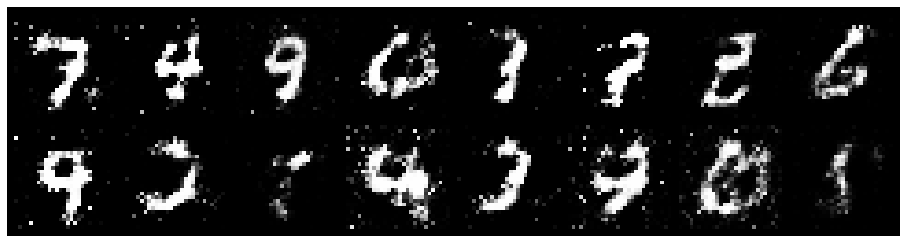

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 1.2279, Generator Loss: 1.2597
D(x): 0.6675, D(G(z)): 0.4125
gen_epochs:1 ,dis_epochs:1


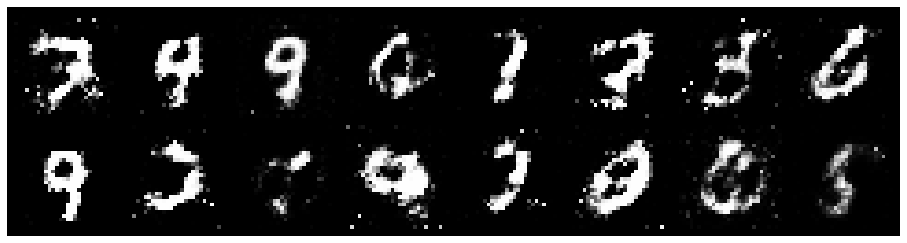

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 0.9785, Generator Loss: 1.5863
D(x): 0.6671, D(G(z)): 0.3043
gen_epochs:1 ,dis_epochs:1


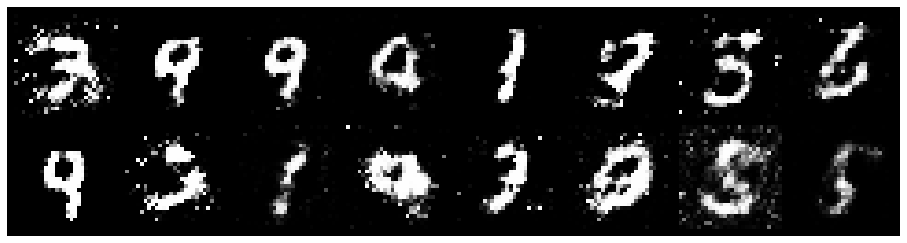

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.8948, Generator Loss: 1.6563
D(x): 0.7411, D(G(z)): 0.3264
gen_epochs:1 ,dis_epochs:1


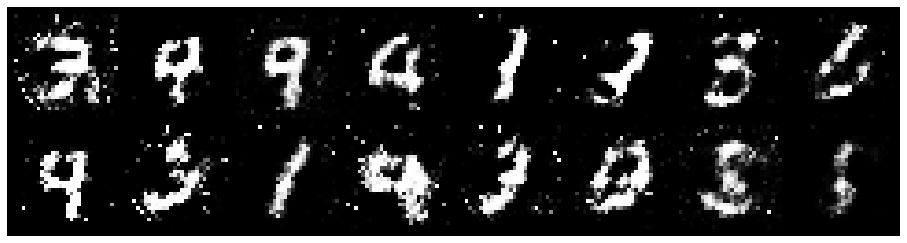

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 1.1835, Generator Loss: 1.0904
D(x): 0.7148, D(G(z)): 0.4458
gen_epochs:1 ,dis_epochs:1


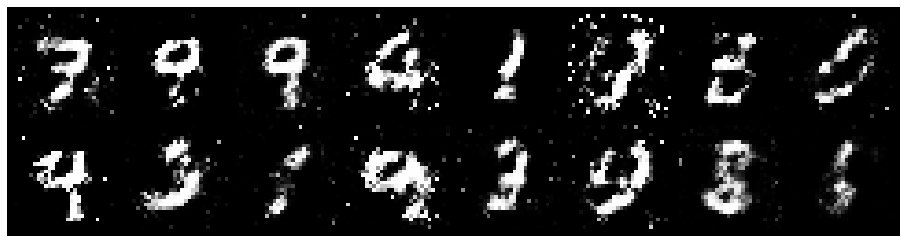

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.9655, Generator Loss: 1.5039
D(x): 0.6908, D(G(z)): 0.3249
gen_epochs:1 ,dis_epochs:1


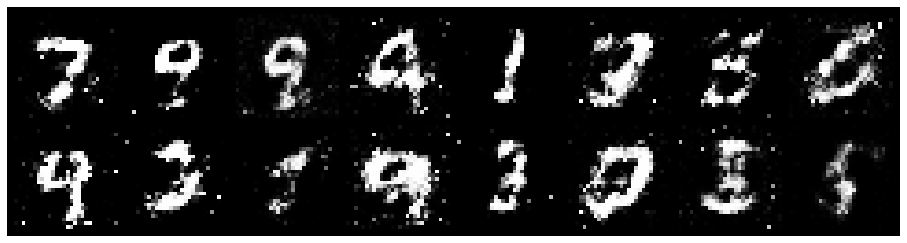

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.9302, Generator Loss: 1.6617
D(x): 0.6446, D(G(z)): 0.2852
gen_epochs:1 ,dis_epochs:1


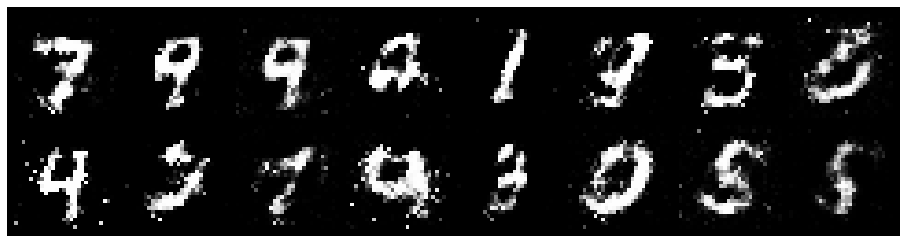

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.8674, Generator Loss: 1.6732
D(x): 0.6914, D(G(z)): 0.2323
gen_epochs:1 ,dis_epochs:1


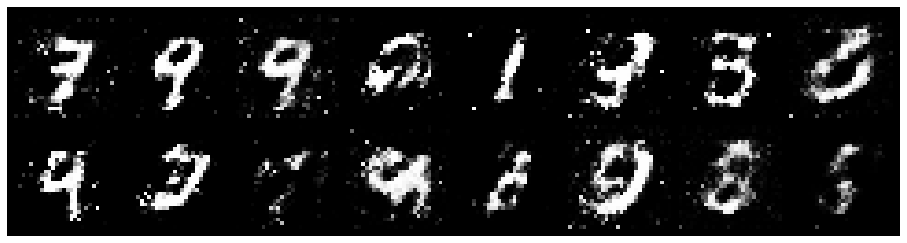

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.8373, Generator Loss: 1.6919
D(x): 0.7440, D(G(z)): 0.2873
gen_epochs:1 ,dis_epochs:1


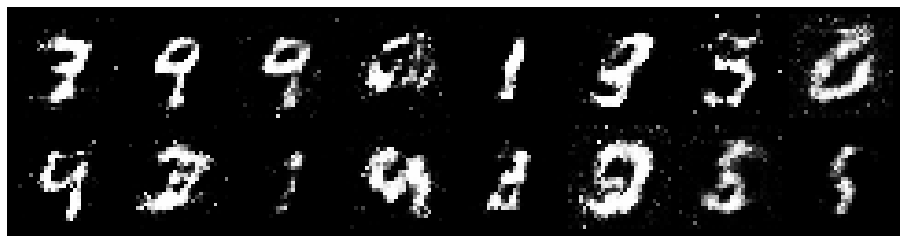

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 1.0438, Generator Loss: 1.6352
D(x): 0.6653, D(G(z)): 0.2805
gen_epochs:1 ,dis_epochs:1


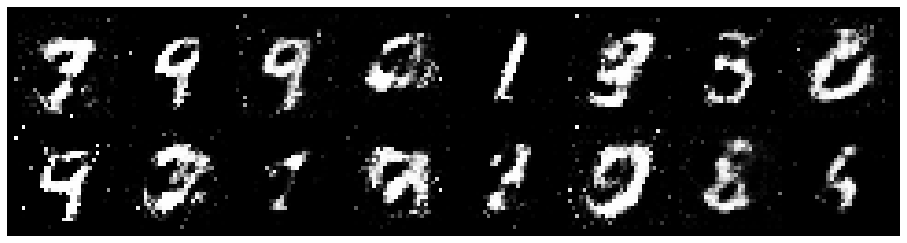

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 1.1312, Generator Loss: 1.2287
D(x): 0.6745, D(G(z)): 0.3766
gen_epochs:1 ,dis_epochs:1


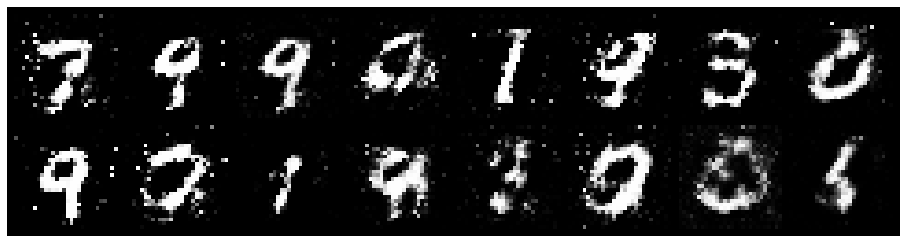

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 1.0714, Generator Loss: 1.2097
D(x): 0.6897, D(G(z)): 0.3923
gen_epochs:1 ,dis_epochs:1


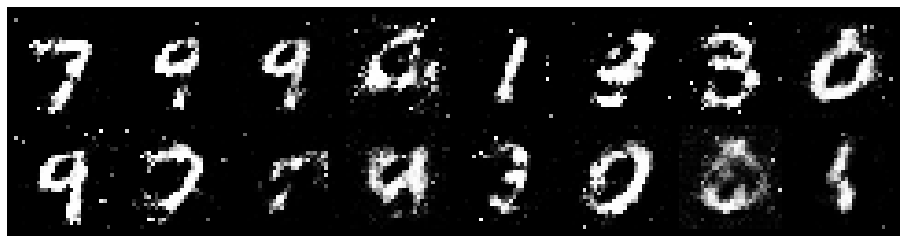

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 1.1249, Generator Loss: 1.2161
D(x): 0.6043, D(G(z)): 0.3407
gen_epochs:1 ,dis_epochs:1


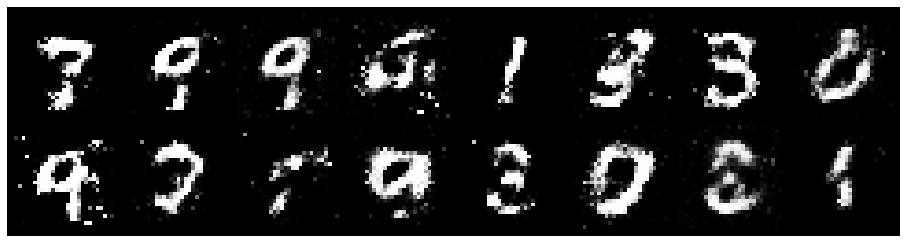

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.9321, Generator Loss: 1.3906
D(x): 0.6873, D(G(z)): 0.3004
gen_epochs:1 ,dis_epochs:1


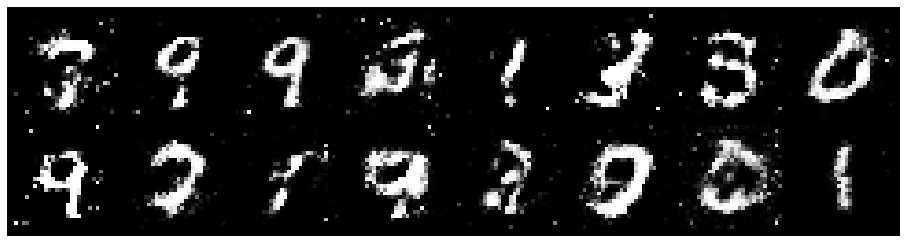

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 1.1900, Generator Loss: 1.6537
D(x): 0.6229, D(G(z)): 0.3531
gen_epochs:1 ,dis_epochs:1


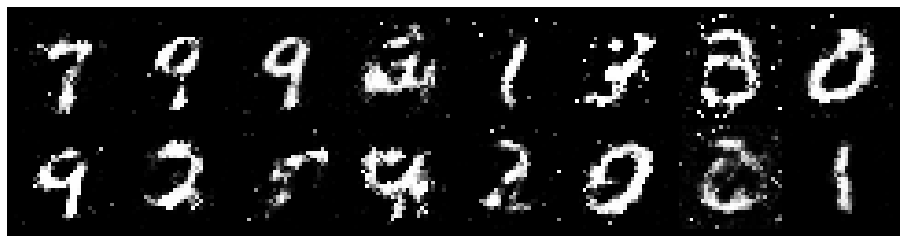

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.8880, Generator Loss: 1.4071
D(x): 0.7759, D(G(z)): 0.3636
gen_epochs:1 ,dis_epochs:1


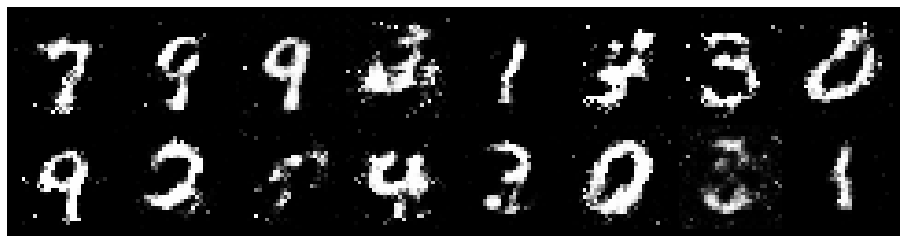

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 0.8101, Generator Loss: 1.7064
D(x): 0.7107, D(G(z)): 0.2647
gen_epochs:1 ,dis_epochs:1


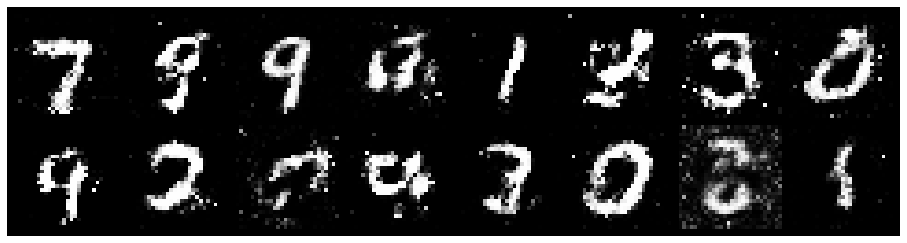

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 1.1162, Generator Loss: 1.6171
D(x): 0.6918, D(G(z)): 0.3460
gen_epochs:1 ,dis_epochs:1


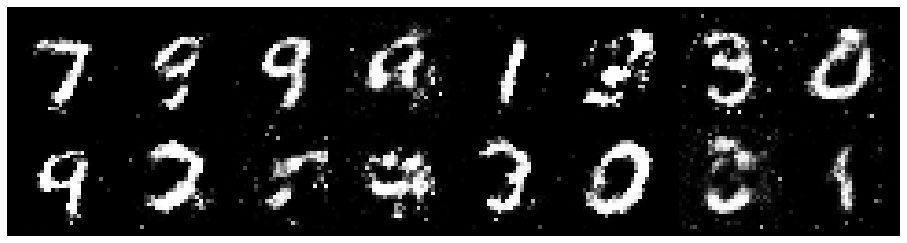

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 0.9633, Generator Loss: 1.9799
D(x): 0.7260, D(G(z)): 0.3237
gen_epochs:1 ,dis_epochs:1


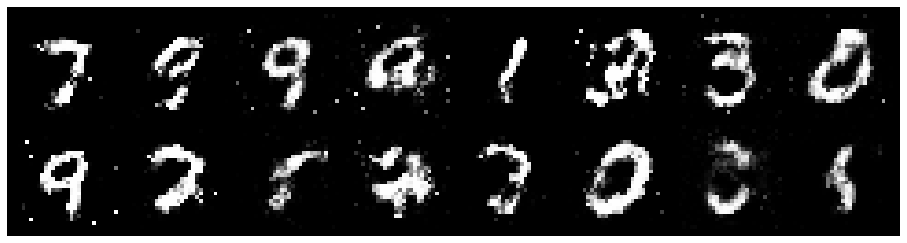

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 0.8654, Generator Loss: 1.7954
D(x): 0.7299, D(G(z)): 0.3072
gen_epochs:1 ,dis_epochs:1


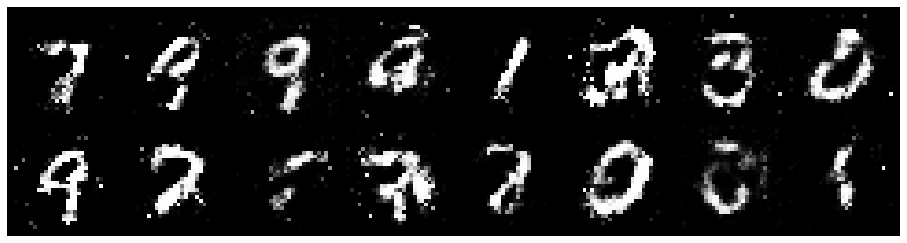

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 1.1838, Generator Loss: 1.3729
D(x): 0.6388, D(G(z)): 0.3547
gen_epochs:1 ,dis_epochs:1


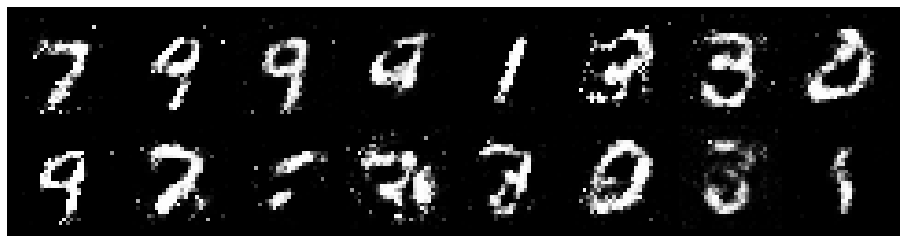

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 1.1757, Generator Loss: 1.4150
D(x): 0.7566, D(G(z)): 0.4531
gen_epochs:1 ,dis_epochs:1


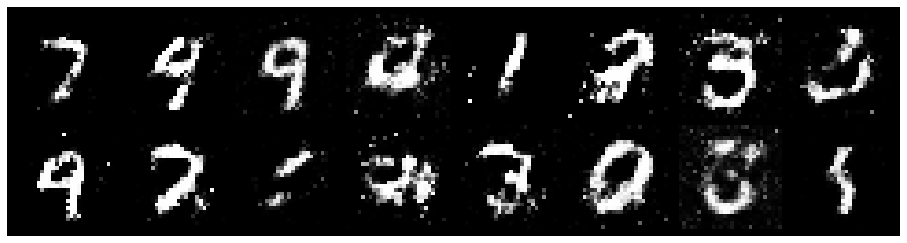

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 1.1344, Generator Loss: 1.2044
D(x): 0.6236, D(G(z)): 0.3256
gen_epochs:1 ,dis_epochs:1


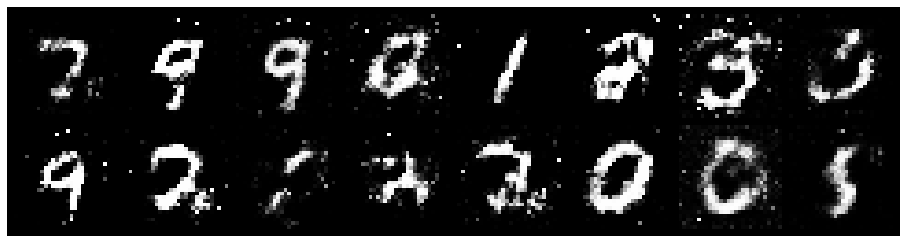

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 1.2102, Generator Loss: 1.3021
D(x): 0.6019, D(G(z)): 0.3857
gen_epochs:1 ,dis_epochs:1


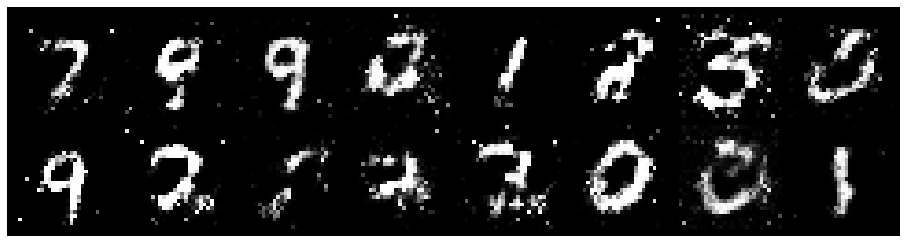

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.2389, Generator Loss: 1.1605
D(x): 0.6320, D(G(z)): 0.3828
gen_epochs:1 ,dis_epochs:1


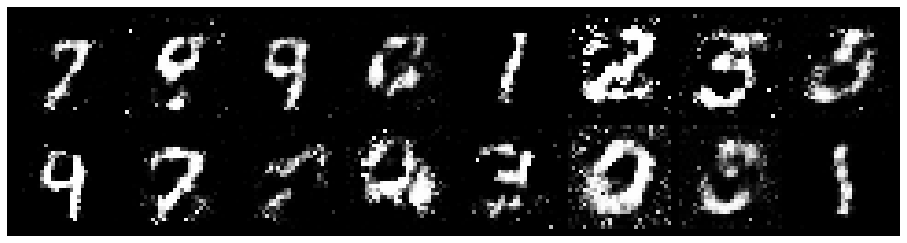

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 1.0834, Generator Loss: 1.2807
D(x): 0.5815, D(G(z)): 0.3360
gen_epochs:1 ,dis_epochs:1


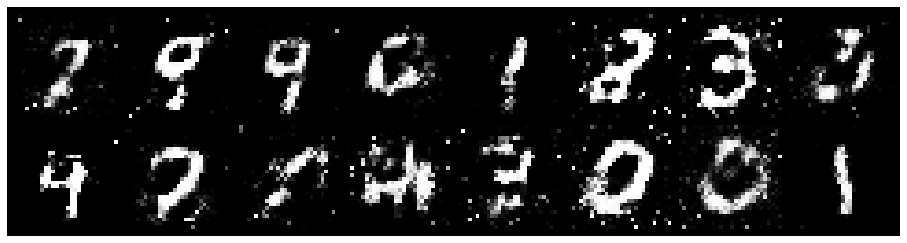

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.1803, Generator Loss: 1.2876
D(x): 0.6048, D(G(z)): 0.3573
gen_epochs:1 ,dis_epochs:1


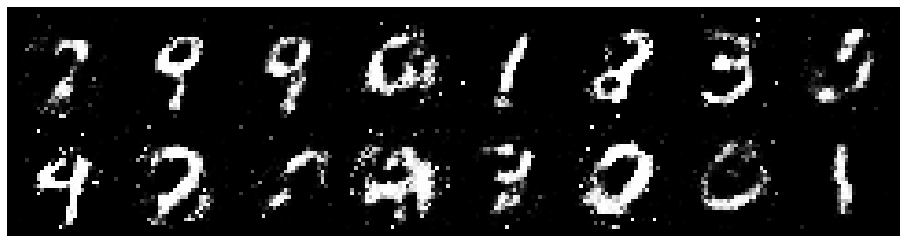

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 0.8799, Generator Loss: 1.3094
D(x): 0.7305, D(G(z)): 0.3430
gen_epochs:1 ,dis_epochs:1


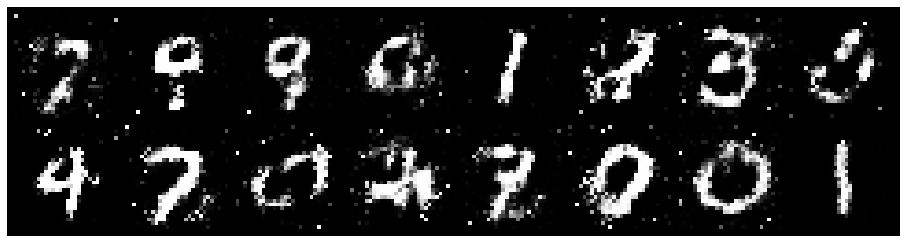

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.7579, Generator Loss: 1.4074
D(x): 0.7667, D(G(z)): 0.3138
gen_epochs:1 ,dis_epochs:1


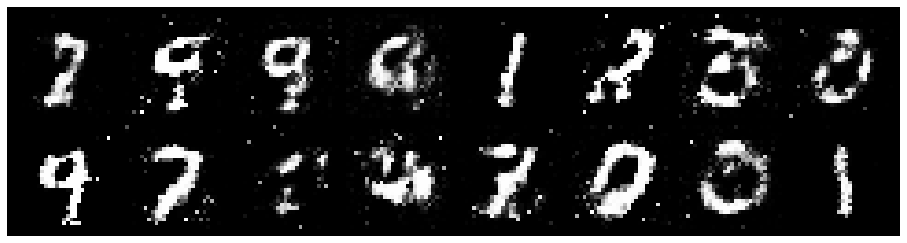

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 0.7498, Generator Loss: 1.3098
D(x): 0.7696, D(G(z)): 0.3030
gen_epochs:1 ,dis_epochs:1


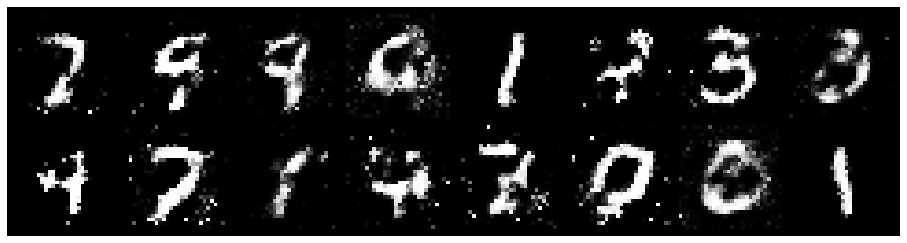

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 0.9400, Generator Loss: 1.4605
D(x): 0.6802, D(G(z)): 0.2997
gen_epochs:1 ,dis_epochs:1


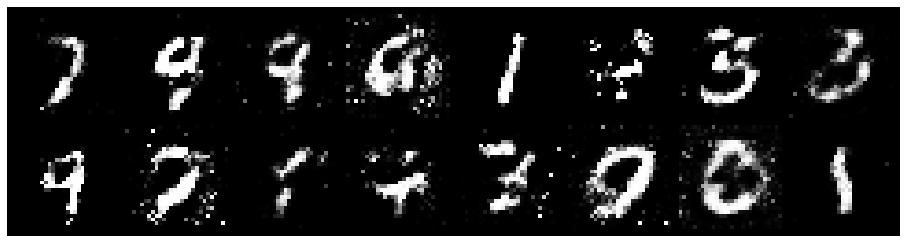

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.2278, Generator Loss: 1.3681
D(x): 0.6951, D(G(z)): 0.4575
gen_epochs:1 ,dis_epochs:1


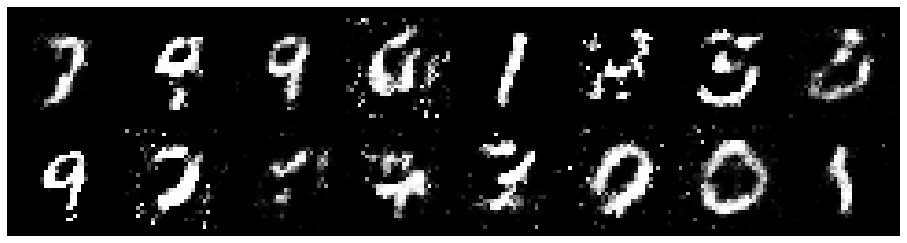

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 0.9213, Generator Loss: 1.3552
D(x): 0.6888, D(G(z)): 0.3095
gen_epochs:1 ,dis_epochs:1


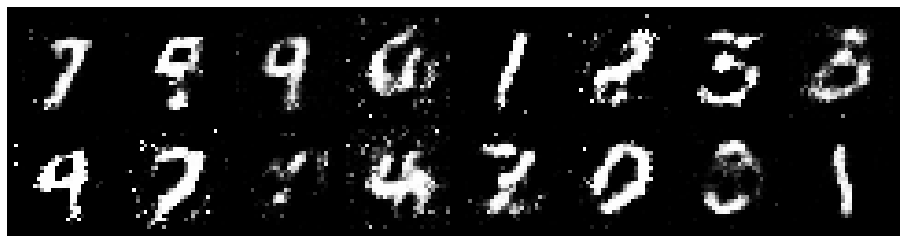

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 0.8788, Generator Loss: 1.4349
D(x): 0.7272, D(G(z)): 0.3486
gen_epochs:1 ,dis_epochs:1


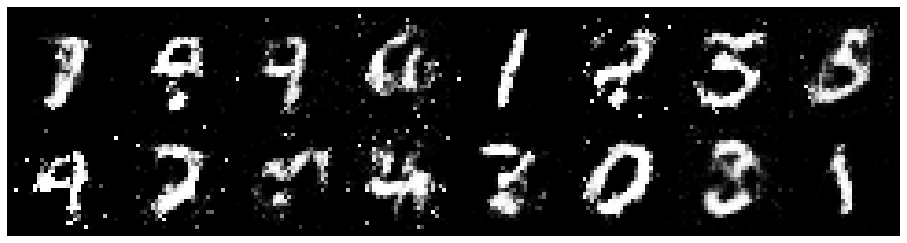

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 0.9006, Generator Loss: 1.5809
D(x): 0.7372, D(G(z)): 0.3375
gen_epochs:1 ,dis_epochs:1


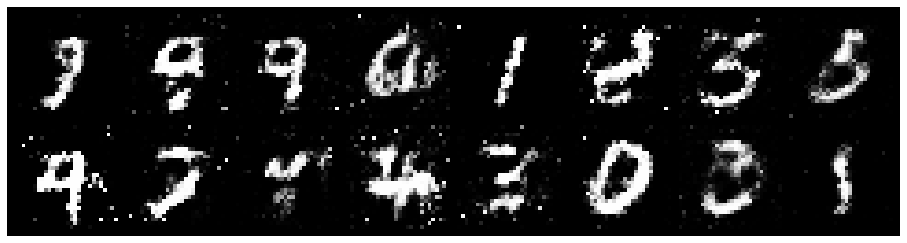

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.1186, Generator Loss: 0.8984
D(x): 0.6032, D(G(z)): 0.3756
gen_epochs:1 ,dis_epochs:1


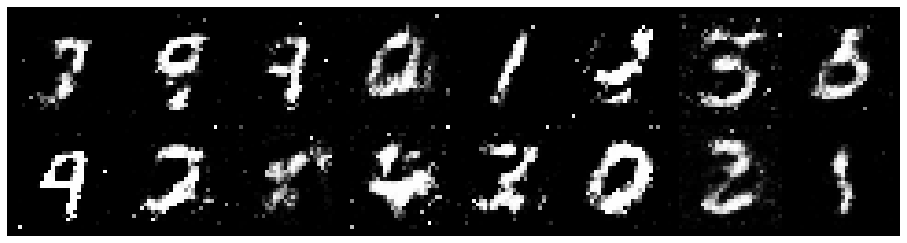

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 1.0183, Generator Loss: 1.0237
D(x): 0.7155, D(G(z)): 0.4237
gen_epochs:1 ,dis_epochs:1


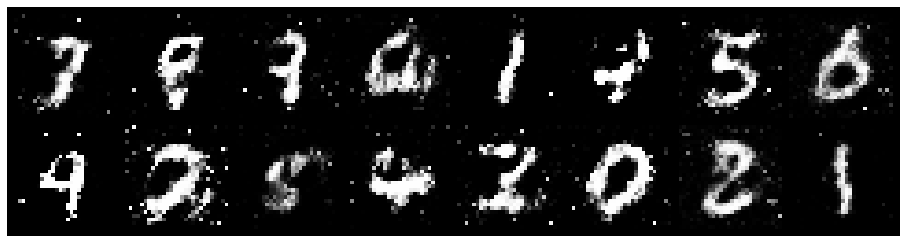

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 1.0102, Generator Loss: 1.2630
D(x): 0.6376, D(G(z)): 0.3320
gen_epochs:1 ,dis_epochs:1


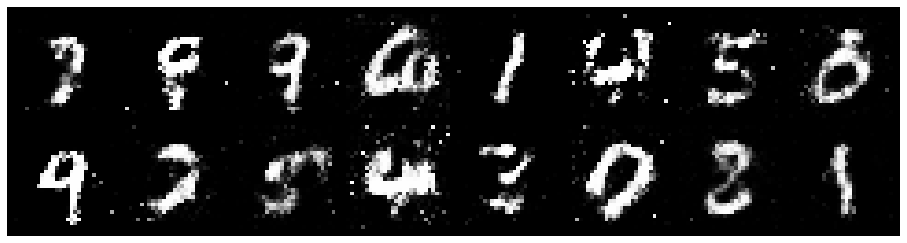

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 1.0635, Generator Loss: 1.4583
D(x): 0.6041, D(G(z)): 0.2977
gen_epochs:1 ,dis_epochs:1


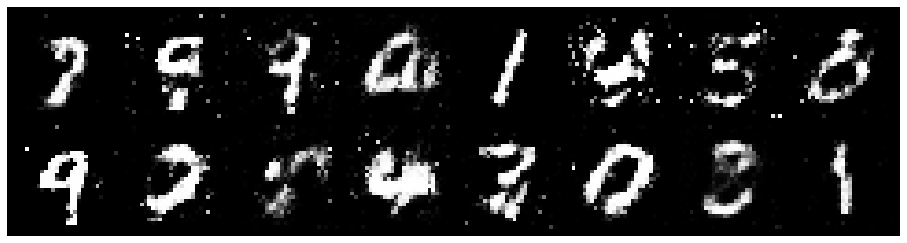

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 1.0325, Generator Loss: 1.1442
D(x): 0.6991, D(G(z)): 0.3757
gen_epochs:1 ,dis_epochs:1


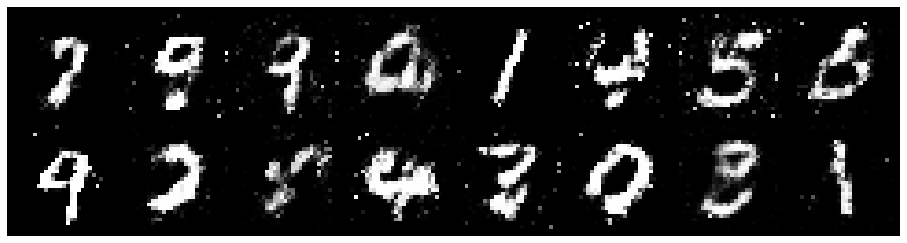

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 1.0480, Generator Loss: 1.2780
D(x): 0.5876, D(G(z)): 0.2888
gen_epochs:1 ,dis_epochs:1


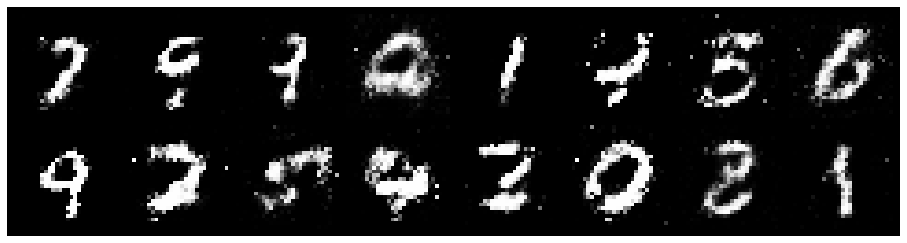

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 0.8024, Generator Loss: 1.5418
D(x): 0.7325, D(G(z)): 0.2996
gen_epochs:1 ,dis_epochs:1


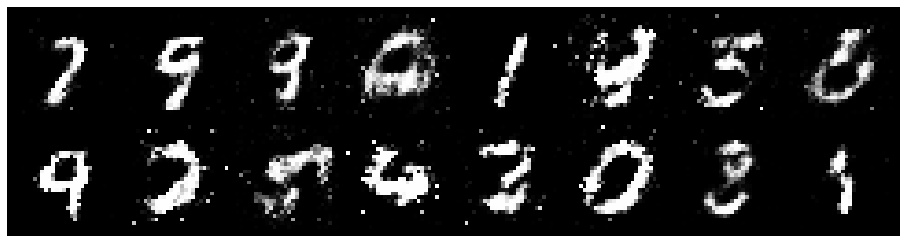

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 0.8843, Generator Loss: 1.2812
D(x): 0.6895, D(G(z)): 0.3096
gen_epochs:1 ,dis_epochs:1


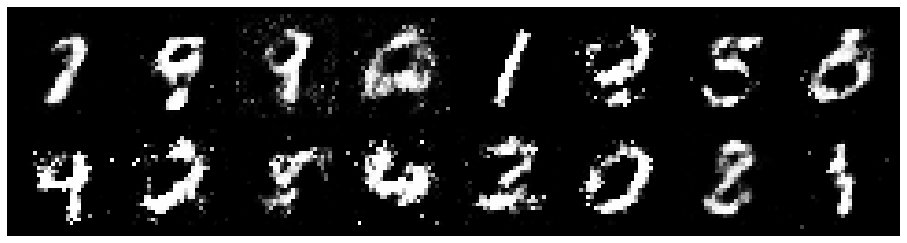

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.1000, Generator Loss: 1.3434
D(x): 0.6431, D(G(z)): 0.3719
gen_epochs:1 ,dis_epochs:1


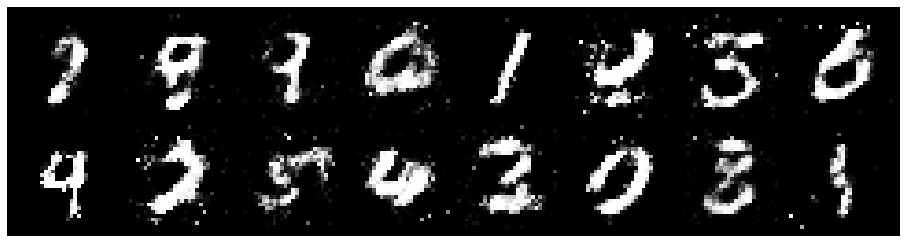

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 1.1665, Generator Loss: 1.5632
D(x): 0.6183, D(G(z)): 0.3500
gen_epochs:1 ,dis_epochs:1


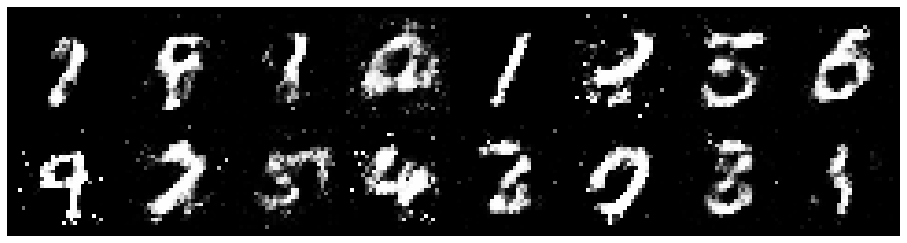

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 0.9805, Generator Loss: 1.1018
D(x): 0.7119, D(G(z)): 0.3724
gen_epochs:1 ,dis_epochs:1


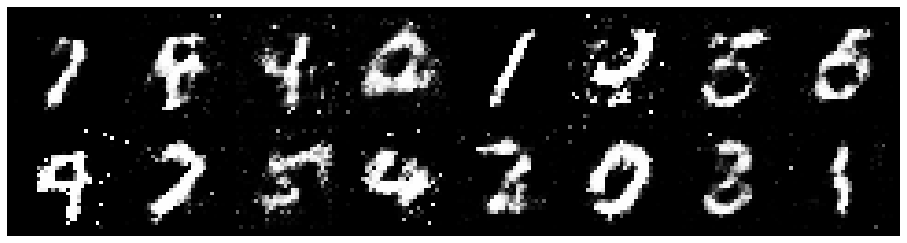

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 0.9503, Generator Loss: 1.3916
D(x): 0.7031, D(G(z)): 0.3546
gen_epochs:1 ,dis_epochs:1


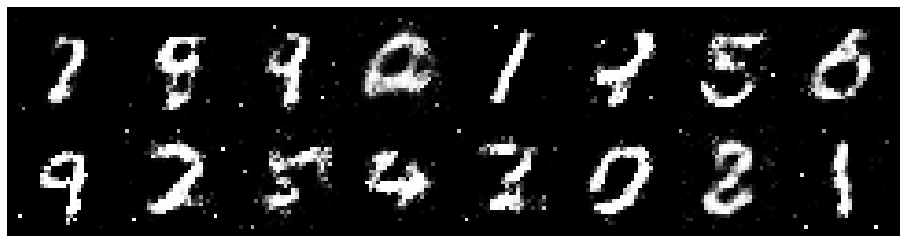

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.9142, Generator Loss: 1.4789
D(x): 0.6583, D(G(z)): 0.3099
gen_epochs:1 ,dis_epochs:1


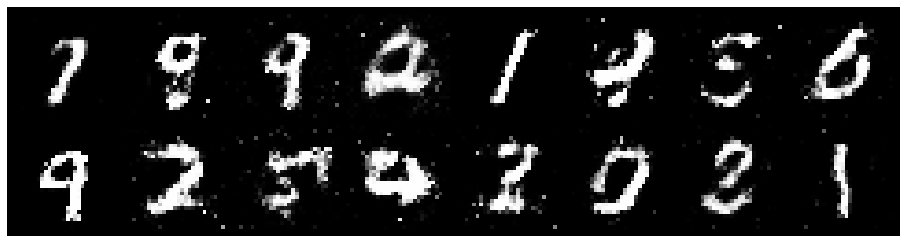

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 1.0051, Generator Loss: 1.3440
D(x): 0.6721, D(G(z)): 0.3385
gen_epochs:1 ,dis_epochs:1


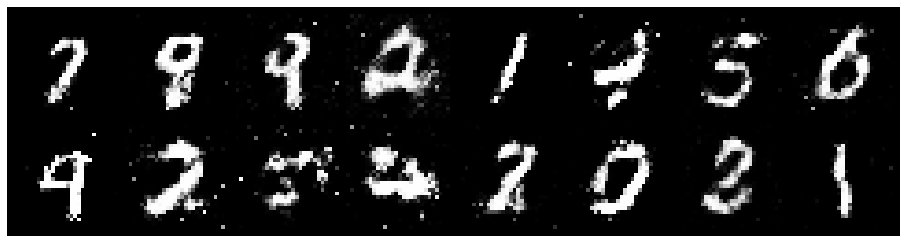

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.0830, Generator Loss: 1.1896
D(x): 0.6343, D(G(z)): 0.3637
gen_epochs:1 ,dis_epochs:1


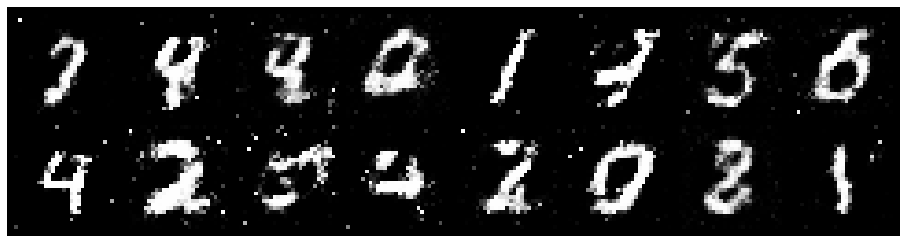

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.0540, Generator Loss: 1.2672
D(x): 0.6166, D(G(z)): 0.3203
gen_epochs:1 ,dis_epochs:1


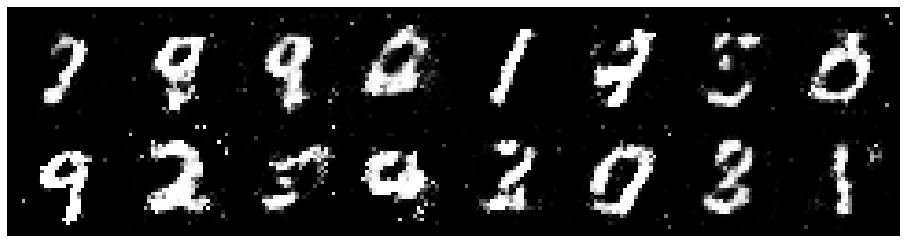

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 0.9948, Generator Loss: 1.4052
D(x): 0.7130, D(G(z)): 0.3796
gen_epochs:1 ,dis_epochs:1


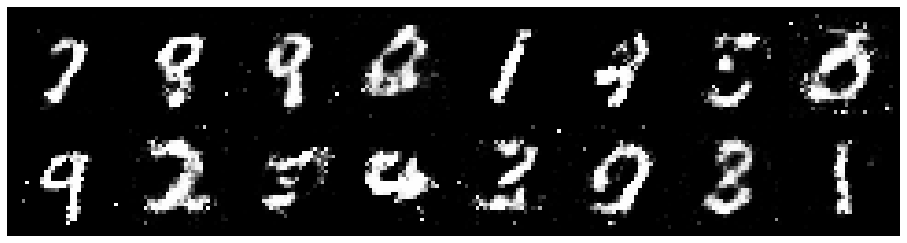

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 0.8707, Generator Loss: 1.6627
D(x): 0.6880, D(G(z)): 0.2871
gen_epochs:1 ,dis_epochs:1


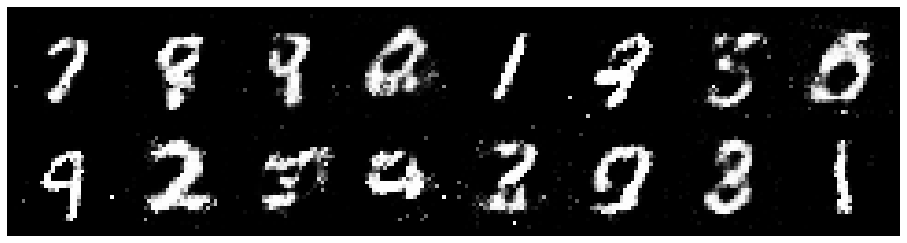

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 1.0066, Generator Loss: 1.5586
D(x): 0.6362, D(G(z)): 0.2950
gen_epochs:1 ,dis_epochs:1


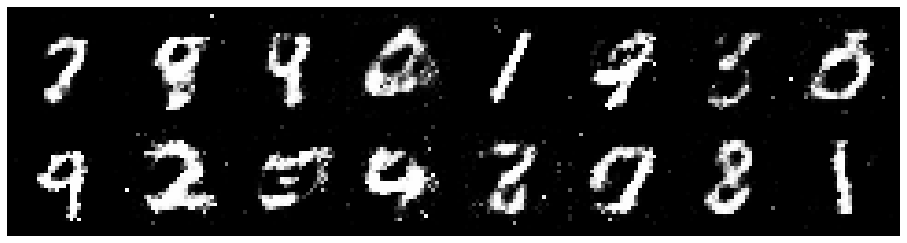

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 1.1115, Generator Loss: 1.2427
D(x): 0.6456, D(G(z)): 0.3645
gen_epochs:1 ,dis_epochs:1


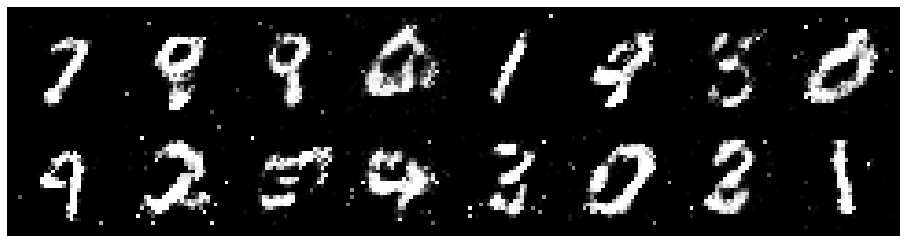

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 1.1894, Generator Loss: 1.0781
D(x): 0.6423, D(G(z)): 0.4509
gen_epochs:1 ,dis_epochs:1


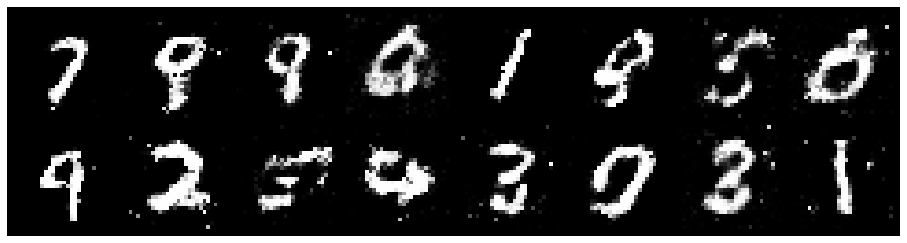

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 1.1267, Generator Loss: 0.9765
D(x): 0.6838, D(G(z)): 0.4190
gen_epochs:1 ,dis_epochs:1


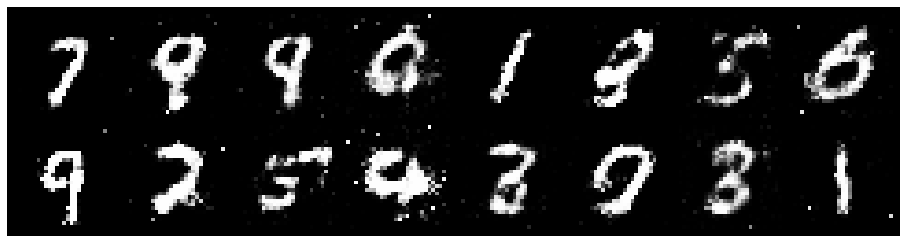

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 1.2192, Generator Loss: 1.2773
D(x): 0.6314, D(G(z)): 0.3578
gen_epochs:1 ,dis_epochs:1


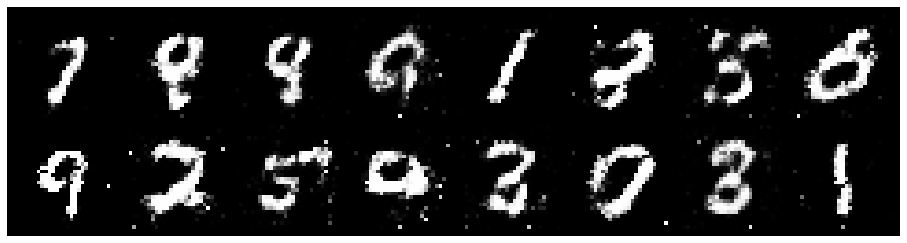

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 0.9476, Generator Loss: 1.2017
D(x): 0.6401, D(G(z)): 0.3222
gen_epochs:1 ,dis_epochs:1


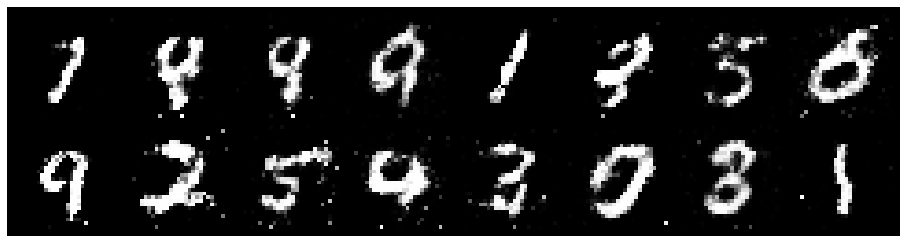

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.0074, Generator Loss: 1.5360
D(x): 0.6469, D(G(z)): 0.3387
gen_epochs:1 ,dis_epochs:1


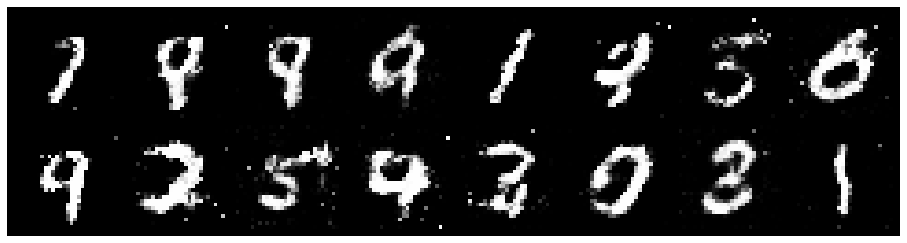

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 0.9331, Generator Loss: 1.3275
D(x): 0.7010, D(G(z)): 0.3430
gen_epochs:1 ,dis_epochs:1


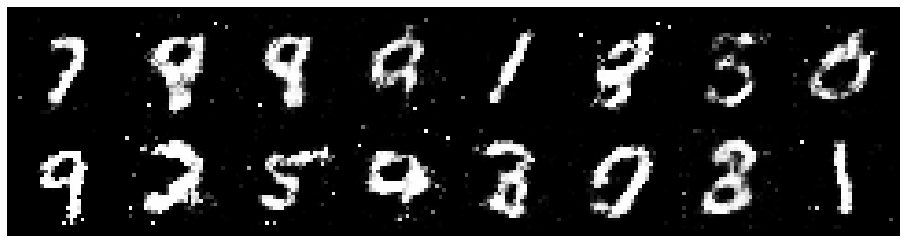

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 1.0573, Generator Loss: 1.4780
D(x): 0.6180, D(G(z)): 0.2966
gen_epochs:1 ,dis_epochs:1


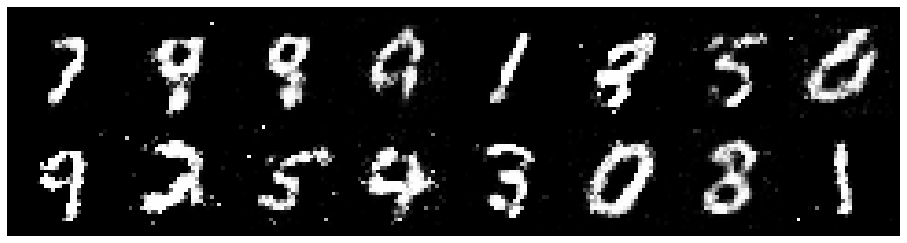

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.1384, Generator Loss: 1.1864
D(x): 0.6260, D(G(z)): 0.3837
gen_epochs:1 ,dis_epochs:1


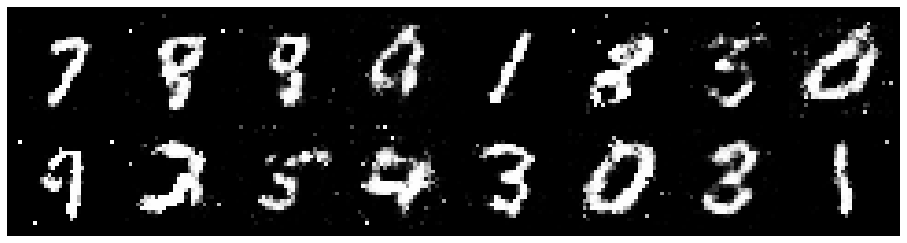

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 1.0506, Generator Loss: 1.4327
D(x): 0.6046, D(G(z)): 0.3187
gen_epochs:1 ,dis_epochs:1


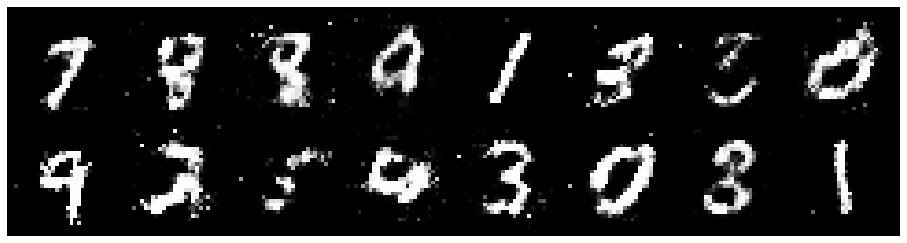

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.0653, Generator Loss: 1.4053
D(x): 0.6986, D(G(z)): 0.3728
gen_epochs:1 ,dis_epochs:1


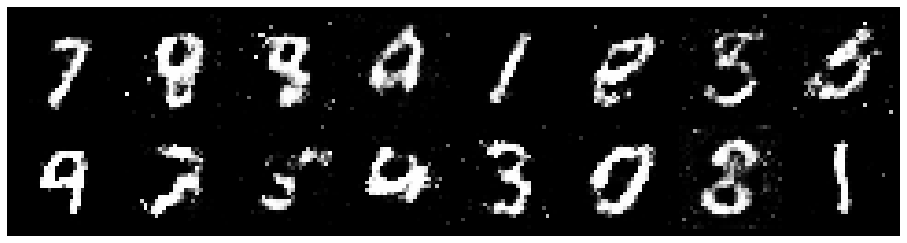

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.0062, Generator Loss: 1.4837
D(x): 0.6325, D(G(z)): 0.3070
gen_epochs:1 ,dis_epochs:1


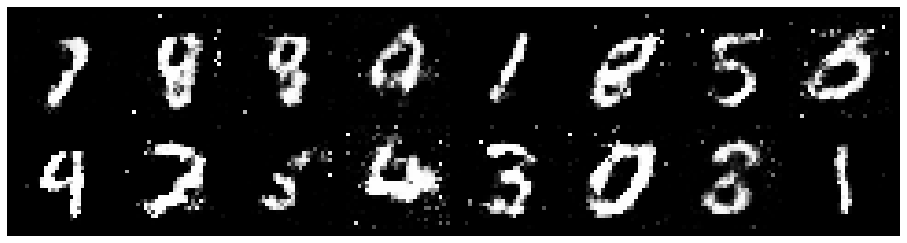

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 1.0472, Generator Loss: 1.3512
D(x): 0.6689, D(G(z)): 0.3801
gen_epochs:1 ,dis_epochs:1


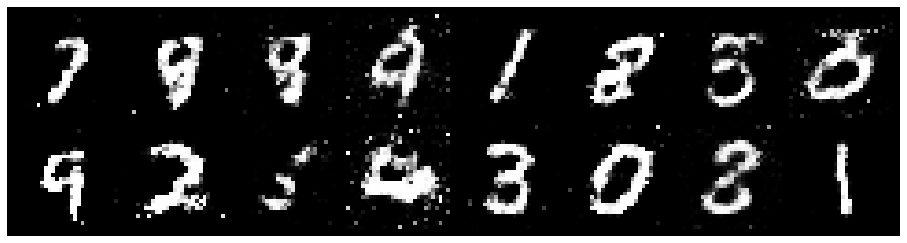

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.0965, Generator Loss: 1.3739
D(x): 0.5983, D(G(z)): 0.3434
gen_epochs:1 ,dis_epochs:1


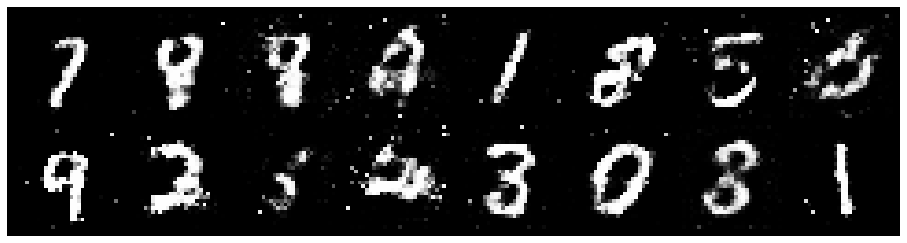

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 1.0891, Generator Loss: 1.4916
D(x): 0.5989, D(G(z)): 0.2966
gen_epochs:1 ,dis_epochs:1


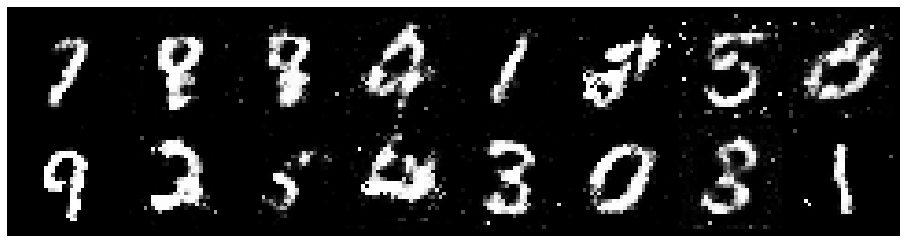

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 0.9777, Generator Loss: 1.3809
D(x): 0.6588, D(G(z)): 0.3289
gen_epochs:1 ,dis_epochs:1


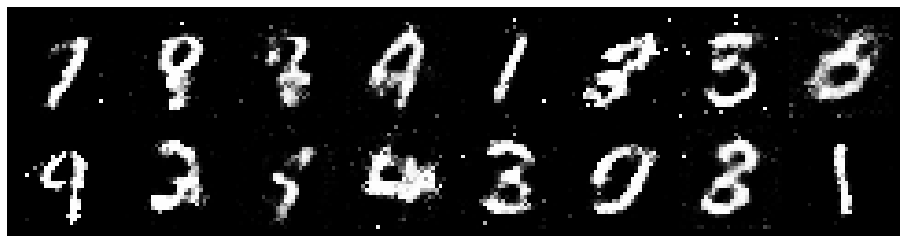

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.0553, Generator Loss: 1.4728
D(x): 0.6036, D(G(z)): 0.3180
gen_epochs:1 ,dis_epochs:1


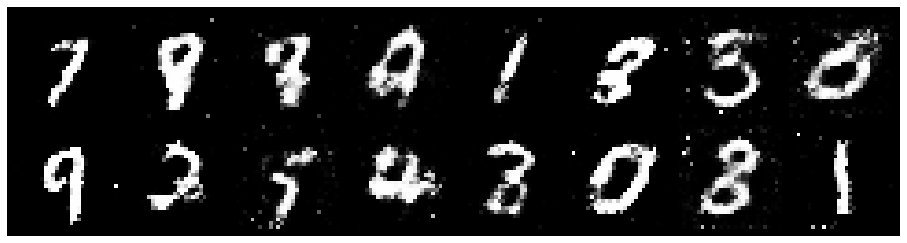

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 1.1385, Generator Loss: 1.4283
D(x): 0.6747, D(G(z)): 0.3901
gen_epochs:1 ,dis_epochs:1


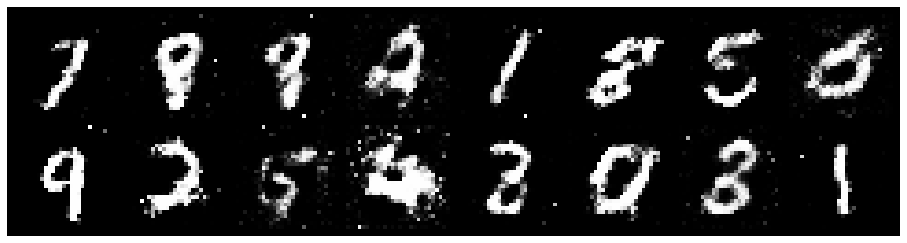

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.1044, Generator Loss: 1.8690
D(x): 0.6119, D(G(z)): 0.3119
gen_epochs:1 ,dis_epochs:1


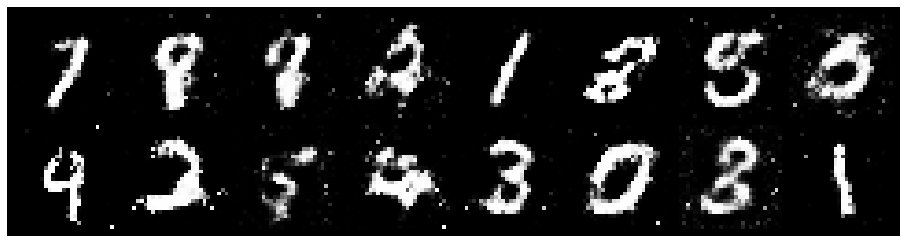

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 1.0529, Generator Loss: 1.2395
D(x): 0.6568, D(G(z)): 0.3738
gen_epochs:1 ,dis_epochs:1


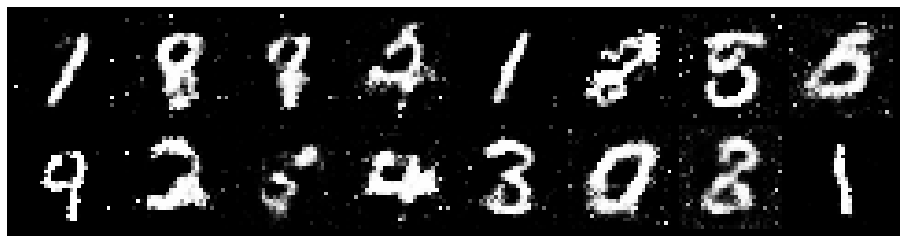

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 0.9755, Generator Loss: 1.2170
D(x): 0.6526, D(G(z)): 0.3231
gen_epochs:1 ,dis_epochs:1


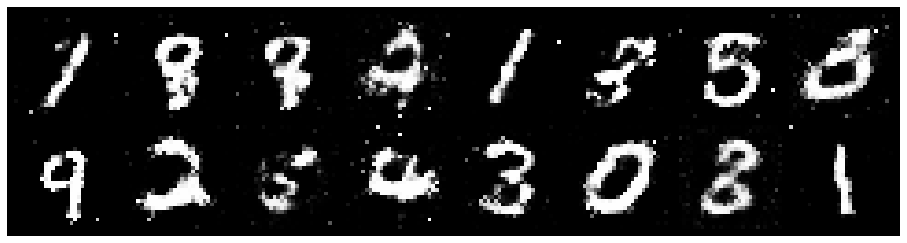

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0176, Generator Loss: 0.9800
D(x): 0.7049, D(G(z)): 0.4167
gen_epochs:1 ,dis_epochs:1


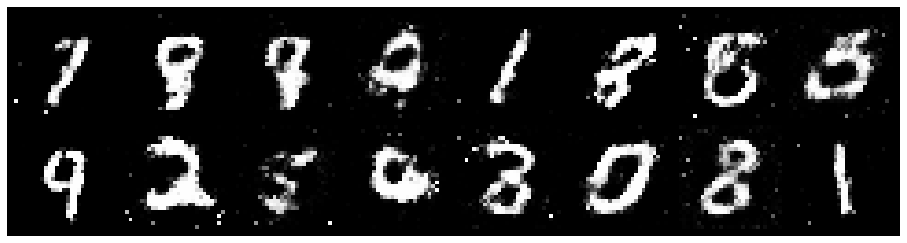

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.1518, Generator Loss: 1.0155
D(x): 0.6029, D(G(z)): 0.3838
gen_epochs:1 ,dis_epochs:1


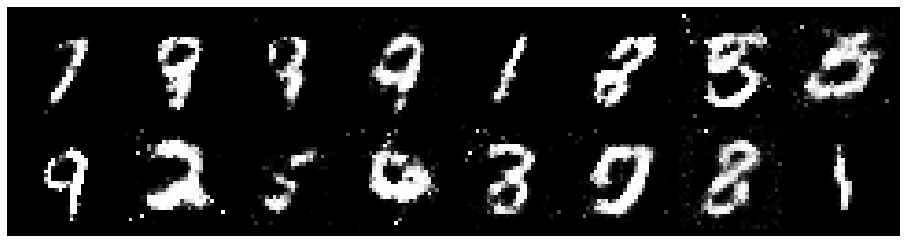

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.1080, Generator Loss: 1.0616
D(x): 0.6395, D(G(z)): 0.3890
gen_epochs:1 ,dis_epochs:1


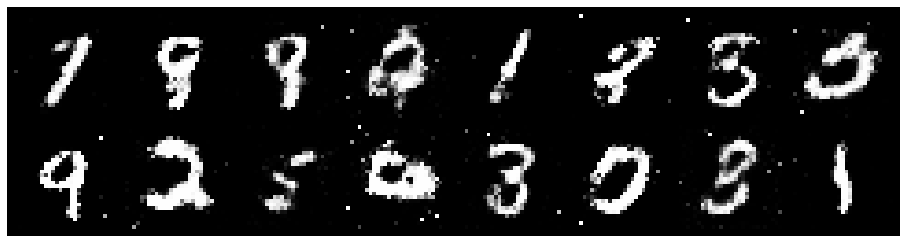

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 1.1255, Generator Loss: 1.2296
D(x): 0.6159, D(G(z)): 0.3577
gen_epochs:1 ,dis_epochs:1


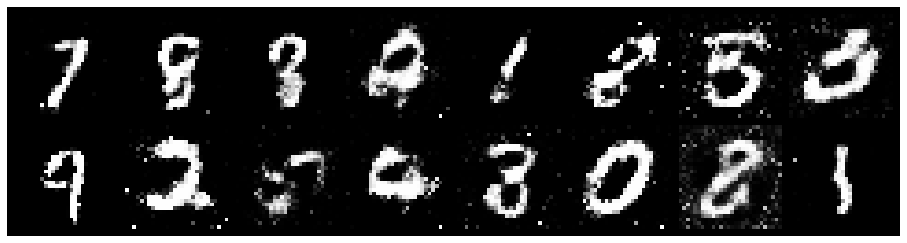

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.2455, Generator Loss: 1.2585
D(x): 0.6399, D(G(z)): 0.3929
gen_epochs:1 ,dis_epochs:1


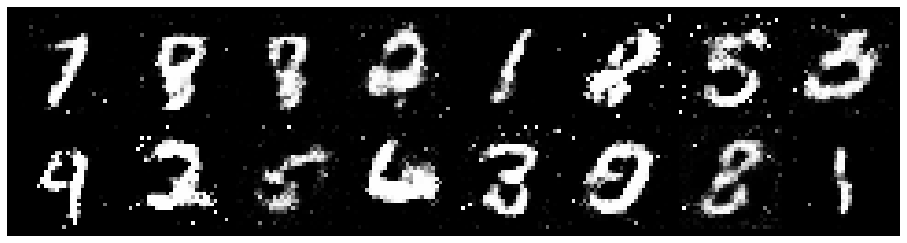

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.0740, Generator Loss: 1.0243
D(x): 0.6697, D(G(z)): 0.3677
gen_epochs:1 ,dis_epochs:1


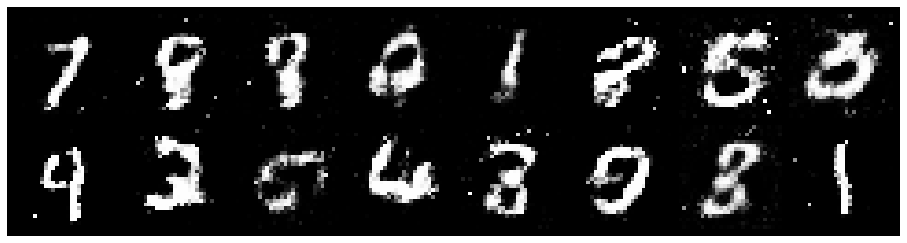

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 0.8901, Generator Loss: 1.3195
D(x): 0.6960, D(G(z)): 0.2976
gen_epochs:1 ,dis_epochs:1


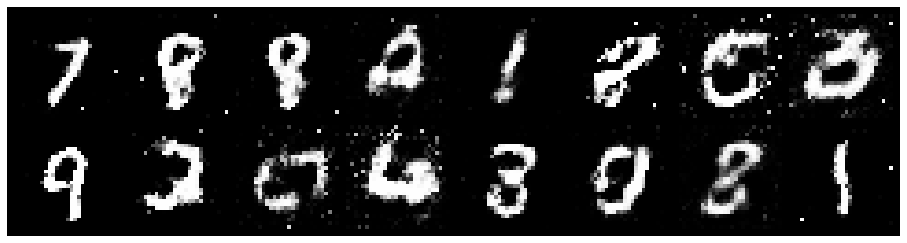

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 0.9963, Generator Loss: 1.4686
D(x): 0.6786, D(G(z)): 0.3258
gen_epochs:1 ,dis_epochs:1


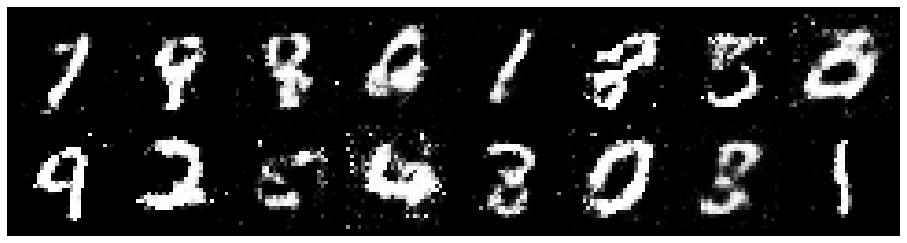

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.0812, Generator Loss: 1.4725
D(x): 0.6133, D(G(z)): 0.3368
gen_epochs:1 ,dis_epochs:1


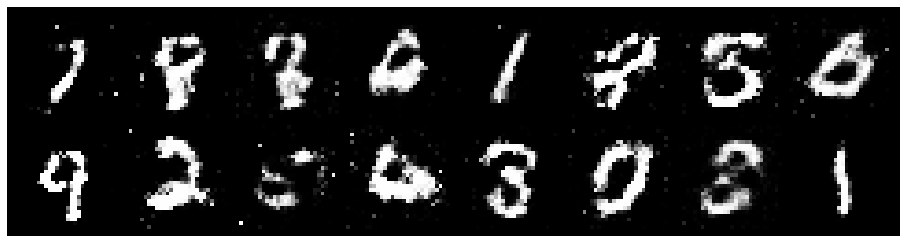

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.1723, Generator Loss: 1.1721
D(x): 0.6435, D(G(z)): 0.4288
gen_epochs:1 ,dis_epochs:1


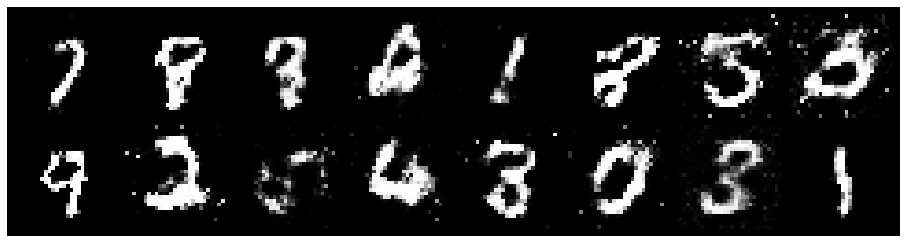

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.0954, Generator Loss: 0.9719
D(x): 0.6487, D(G(z)): 0.3942
gen_epochs:1 ,dis_epochs:1


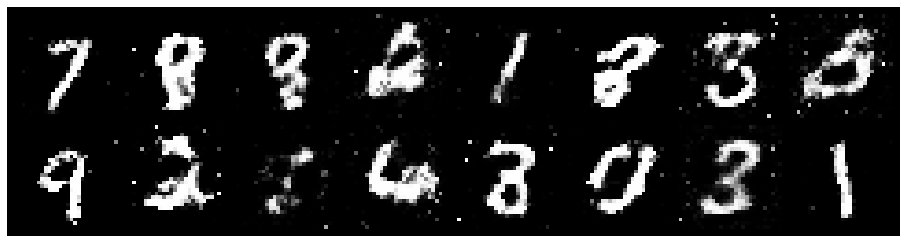

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.0274, Generator Loss: 0.9590
D(x): 0.6166, D(G(z)): 0.3577
gen_epochs:1 ,dis_epochs:1


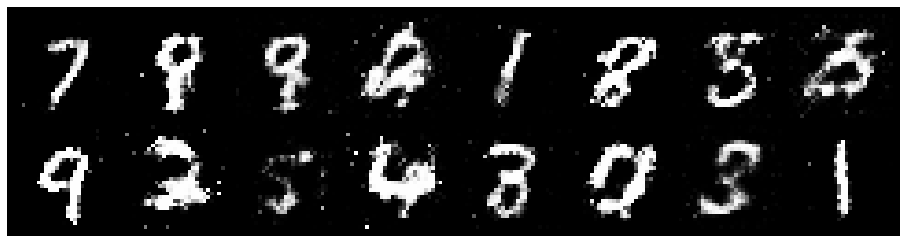

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.0497, Generator Loss: 1.3700
D(x): 0.6399, D(G(z)): 0.3128
gen_epochs:1 ,dis_epochs:1


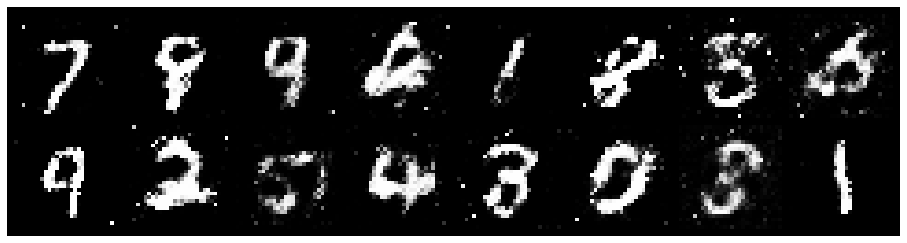

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.0010, Generator Loss: 1.2771
D(x): 0.6467, D(G(z)): 0.3326
gen_epochs:1 ,dis_epochs:1


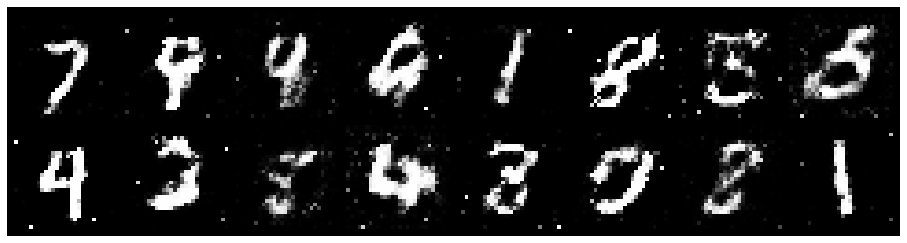

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.1280, Generator Loss: 1.0621
D(x): 0.5978, D(G(z)): 0.3892
gen_epochs:1 ,dis_epochs:1


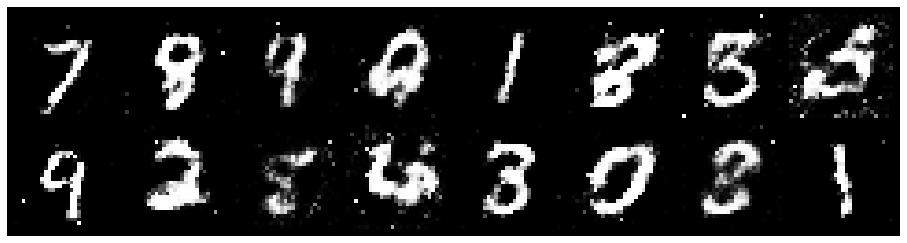

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.1164, Generator Loss: 1.0295
D(x): 0.6864, D(G(z)): 0.4570
gen_epochs:1 ,dis_epochs:1


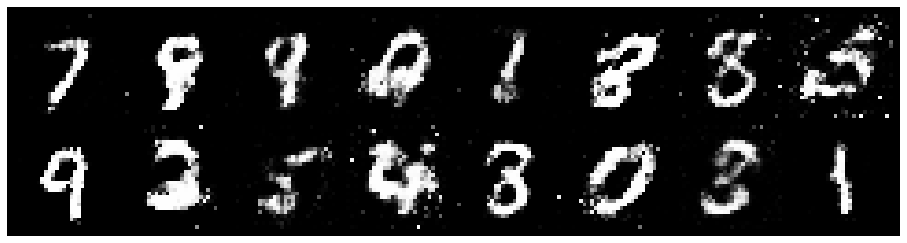

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.0385, Generator Loss: 1.3176
D(x): 0.6512, D(G(z)): 0.3576
gen_epochs:1 ,dis_epochs:1


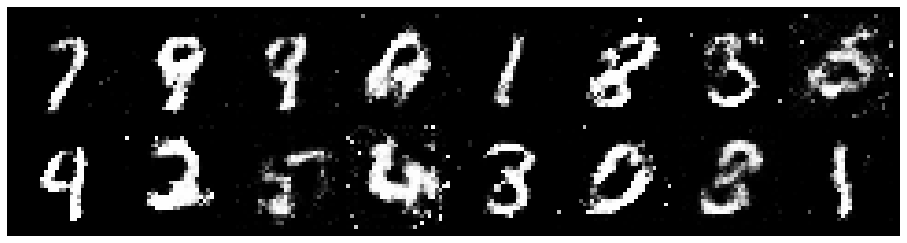

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.0476, Generator Loss: 1.4580
D(x): 0.5972, D(G(z)): 0.3279
gen_epochs:1 ,dis_epochs:1


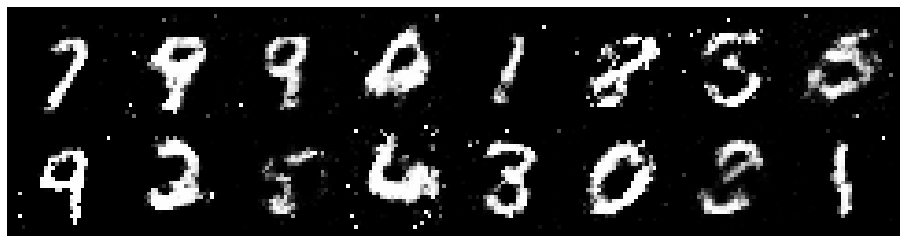

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.0019, Generator Loss: 0.9941
D(x): 0.6328, D(G(z)): 0.3610
gen_epochs:1 ,dis_epochs:1


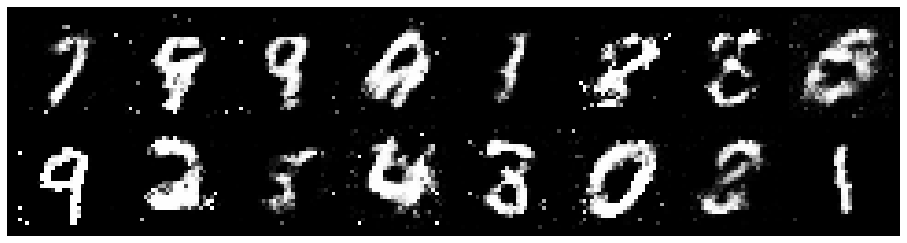

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 0.9656, Generator Loss: 1.3615
D(x): 0.6464, D(G(z)): 0.2982
gen_epochs:1 ,dis_epochs:1


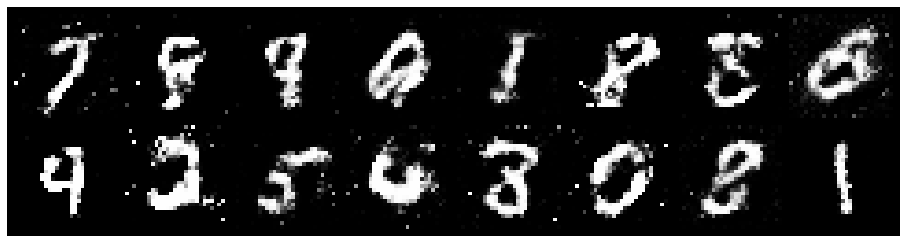

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.1117, Generator Loss: 0.8830
D(x): 0.6426, D(G(z)): 0.4099
gen_epochs:1 ,dis_epochs:1


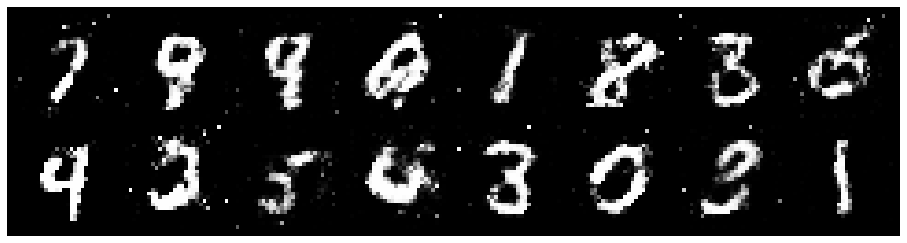

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 0.9151, Generator Loss: 1.0122
D(x): 0.6865, D(G(z)): 0.3522
gen_epochs:1 ,dis_epochs:1


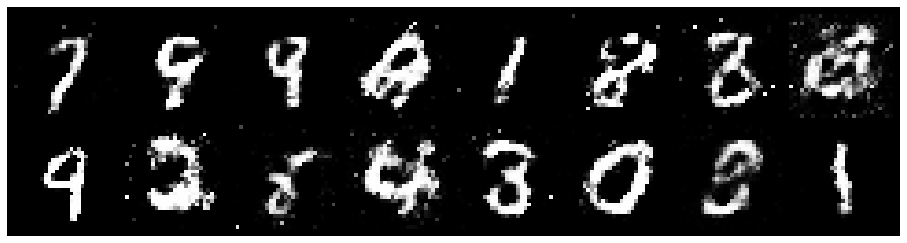

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.0502, Generator Loss: 1.1232
D(x): 0.6622, D(G(z)): 0.4020
gen_epochs:1 ,dis_epochs:1


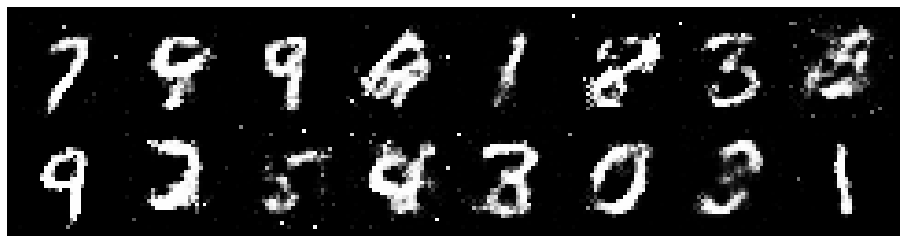

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.0690, Generator Loss: 1.1053
D(x): 0.6426, D(G(z)): 0.3938
gen_epochs:1 ,dis_epochs:1


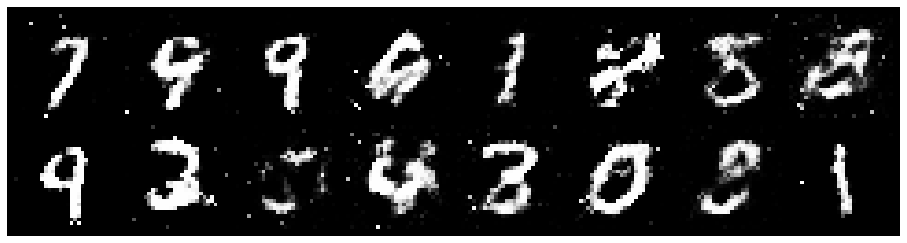

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.0478, Generator Loss: 1.3573
D(x): 0.6279, D(G(z)): 0.3647
gen_epochs:1 ,dis_epochs:1


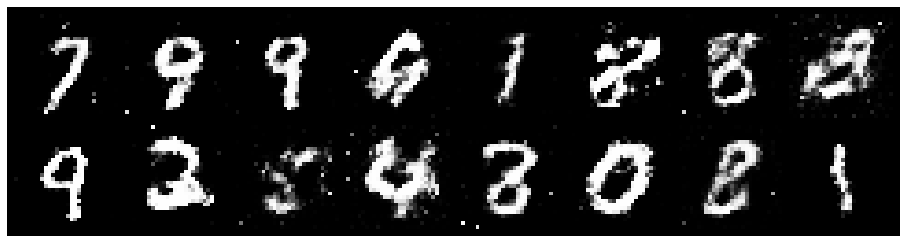

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.1609, Generator Loss: 1.0757
D(x): 0.6671, D(G(z)): 0.4398
gen_epochs:1 ,dis_epochs:1


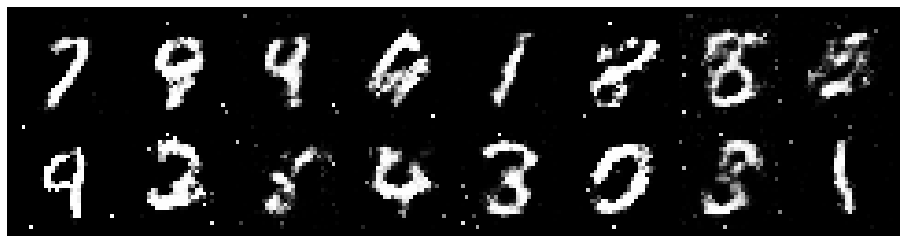

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.0731, Generator Loss: 1.0083
D(x): 0.6288, D(G(z)): 0.3739
gen_epochs:1 ,dis_epochs:1


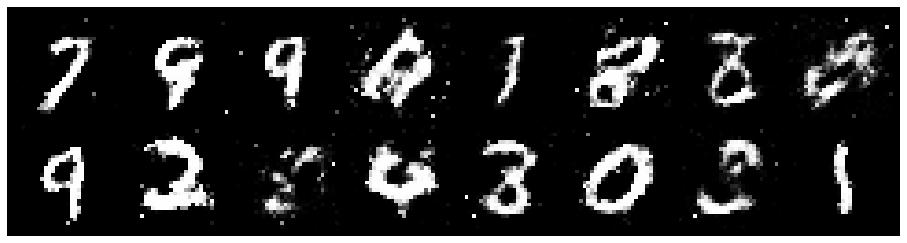

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.1228, Generator Loss: 0.9634
D(x): 0.6146, D(G(z)): 0.4144
gen_epochs:1 ,dis_epochs:1


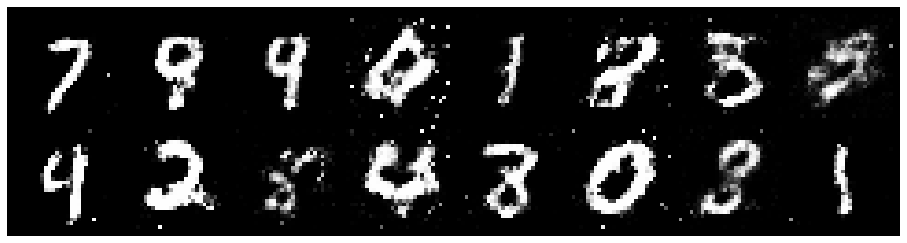

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.2615, Generator Loss: 0.8435
D(x): 0.5935, D(G(z)): 0.4720
gen_epochs:1 ,dis_epochs:1


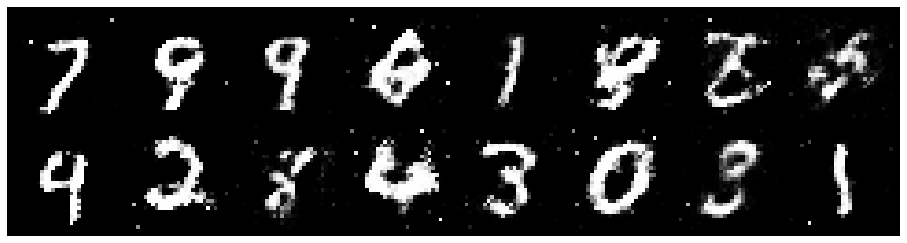

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.2565, Generator Loss: 1.2497
D(x): 0.5744, D(G(z)): 0.4056
gen_epochs:1 ,dis_epochs:1


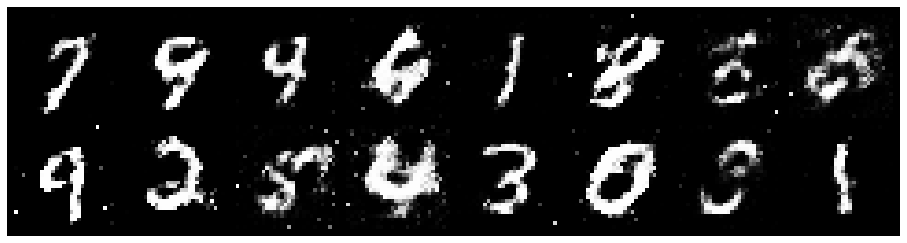

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.1828, Generator Loss: 0.8933
D(x): 0.6772, D(G(z)): 0.4518
gen_epochs:1 ,dis_epochs:1


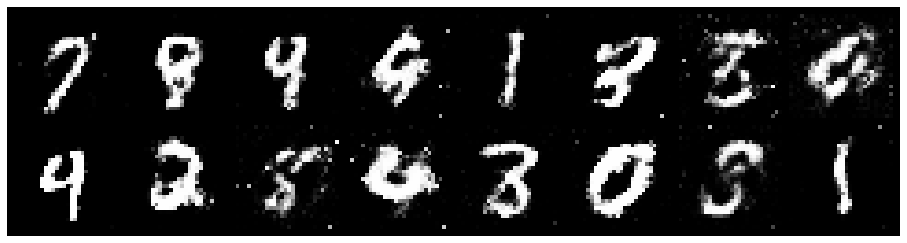

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.1302, Generator Loss: 1.1164
D(x): 0.6541, D(G(z)): 0.4132
gen_epochs:1 ,dis_epochs:1


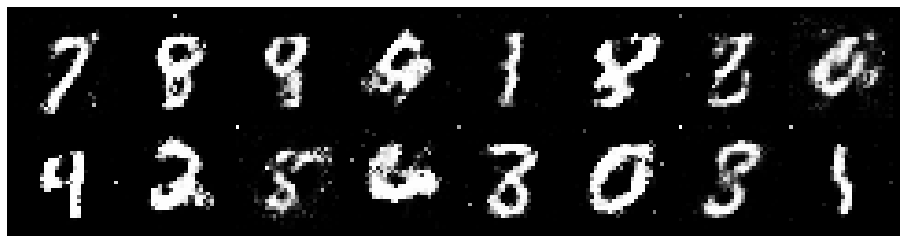

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.2728, Generator Loss: 1.1081
D(x): 0.5349, D(G(z)): 0.4069
gen_epochs:1 ,dis_epochs:1


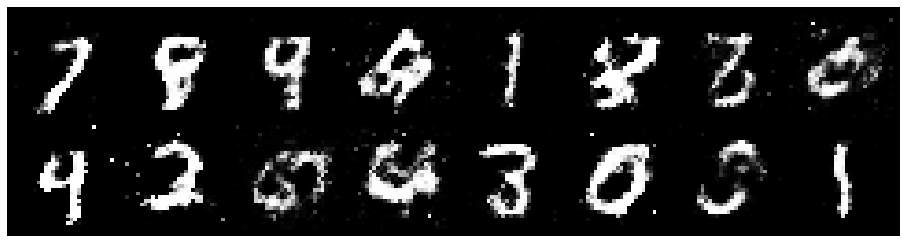

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.0787, Generator Loss: 1.1199
D(x): 0.6698, D(G(z)): 0.4004
gen_epochs:1 ,dis_epochs:1


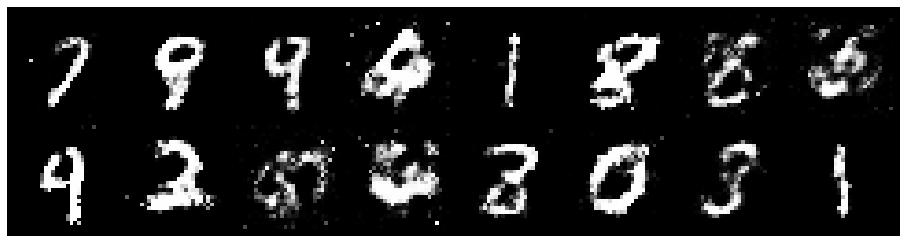

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.0955, Generator Loss: 1.1283
D(x): 0.6186, D(G(z)): 0.3847
gen_epochs:1 ,dis_epochs:1


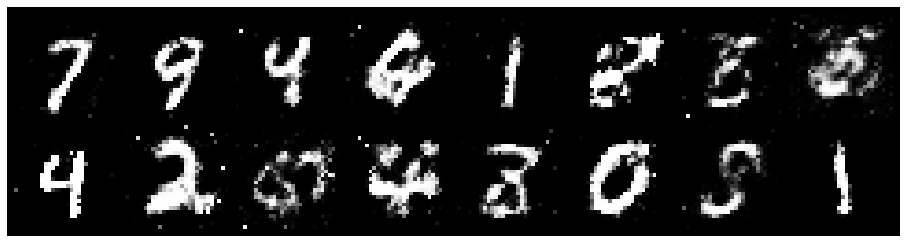

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.1719, Generator Loss: 0.9021
D(x): 0.6112, D(G(z)): 0.4285
gen_epochs:1 ,dis_epochs:1


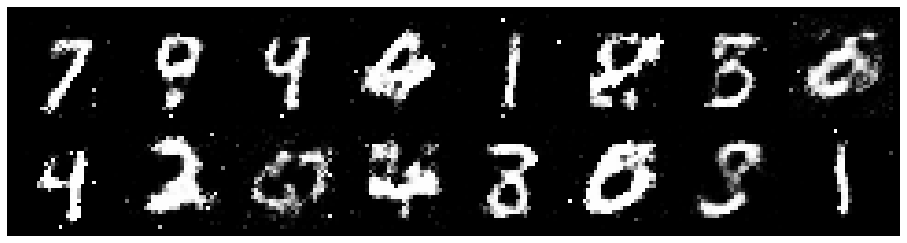

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.1499, Generator Loss: 1.0569
D(x): 0.5779, D(G(z)): 0.3812
gen_epochs:1 ,dis_epochs:1


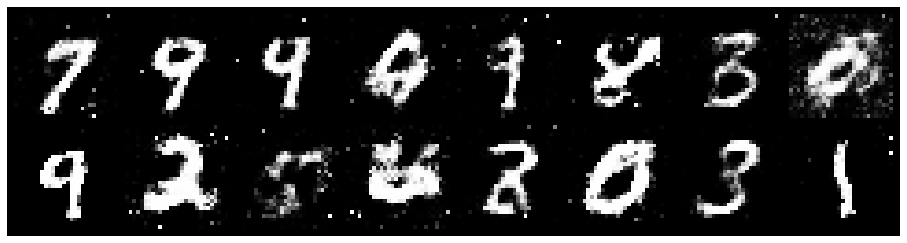

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.1328, Generator Loss: 1.1362
D(x): 0.6720, D(G(z)): 0.4148
gen_epochs:1 ,dis_epochs:1


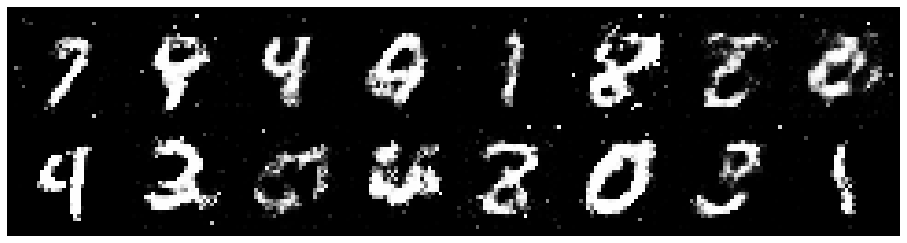

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 0.9875, Generator Loss: 1.2234
D(x): 0.6237, D(G(z)): 0.3246
gen_epochs:1 ,dis_epochs:1


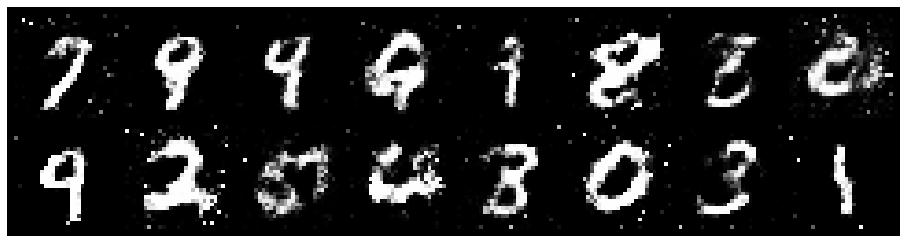

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.0436, Generator Loss: 1.0476
D(x): 0.6218, D(G(z)): 0.3620
gen_epochs:1 ,dis_epochs:1


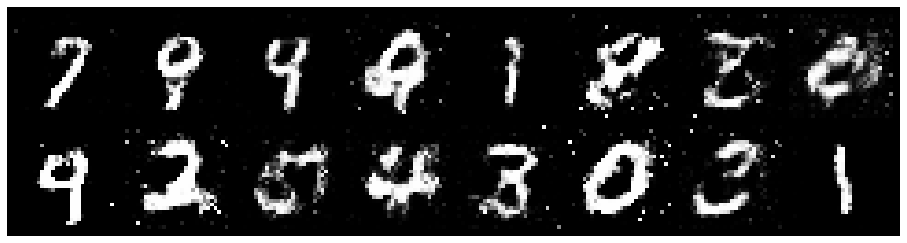

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.0463, Generator Loss: 1.0312
D(x): 0.6475, D(G(z)): 0.3727
gen_epochs:1 ,dis_epochs:1


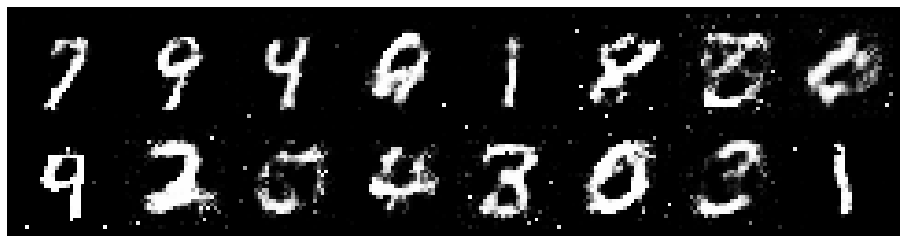

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.1349, Generator Loss: 1.0697
D(x): 0.6605, D(G(z)): 0.4062
gen_epochs:1 ,dis_epochs:1


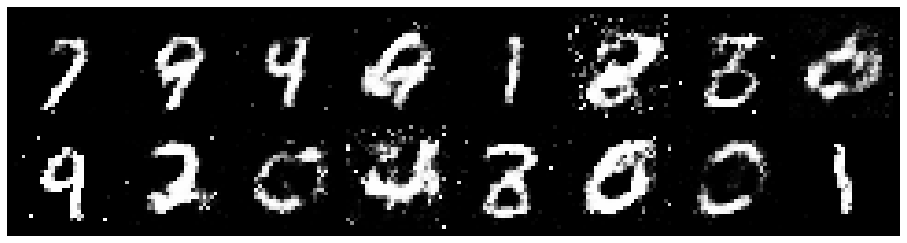

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.2894, Generator Loss: 0.9847
D(x): 0.6243, D(G(z)): 0.4245
gen_epochs:1 ,dis_epochs:1


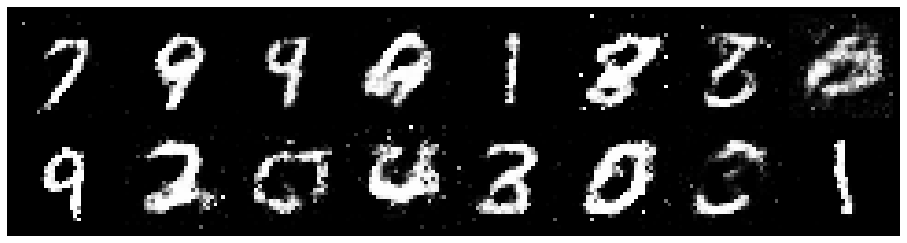

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.1369, Generator Loss: 1.0823
D(x): 0.6146, D(G(z)): 0.3916
gen_epochs:1 ,dis_epochs:1


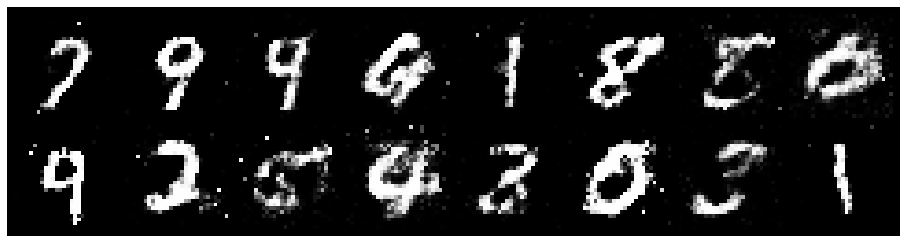

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.2963, Generator Loss: 0.9434
D(x): 0.5973, D(G(z)): 0.4461
gen_epochs:1 ,dis_epochs:1


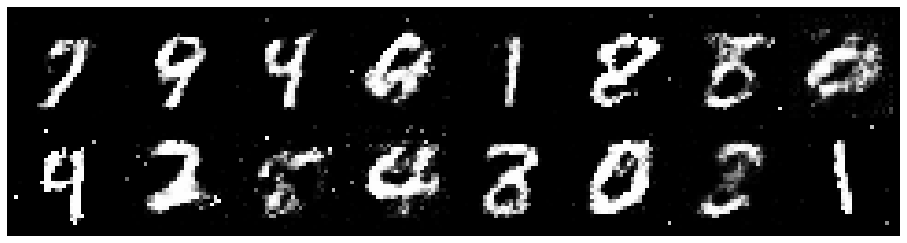

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.1465, Generator Loss: 1.1089
D(x): 0.6342, D(G(z)): 0.4094
gen_epochs:1 ,dis_epochs:1


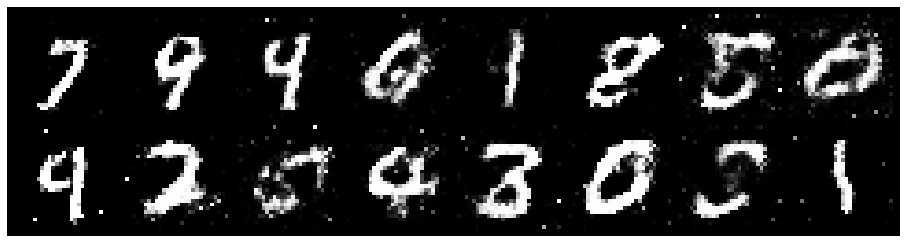

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.2571, Generator Loss: 1.1083
D(x): 0.5473, D(G(z)): 0.4016
gen_epochs:1 ,dis_epochs:1


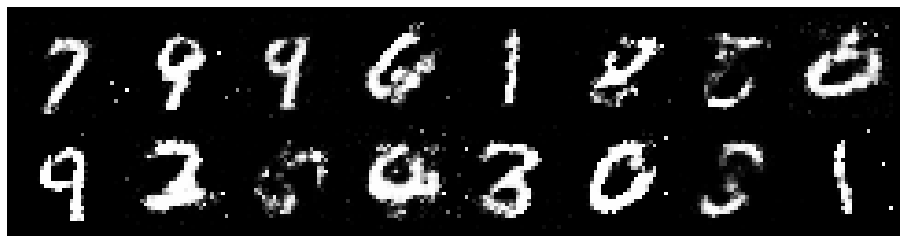

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.2617, Generator Loss: 1.0937
D(x): 0.5766, D(G(z)): 0.3940
gen_epochs:1 ,dis_epochs:1


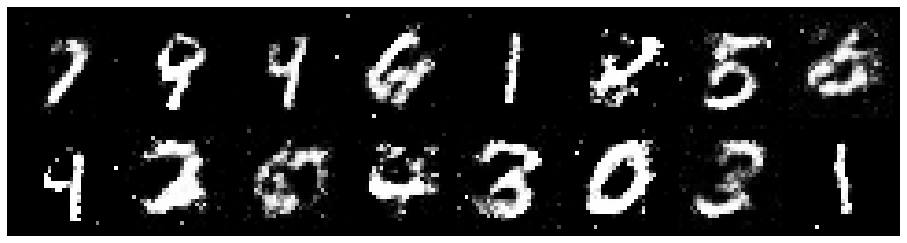

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.3056, Generator Loss: 1.1395
D(x): 0.5441, D(G(z)): 0.4104
gen_epochs:1 ,dis_epochs:1


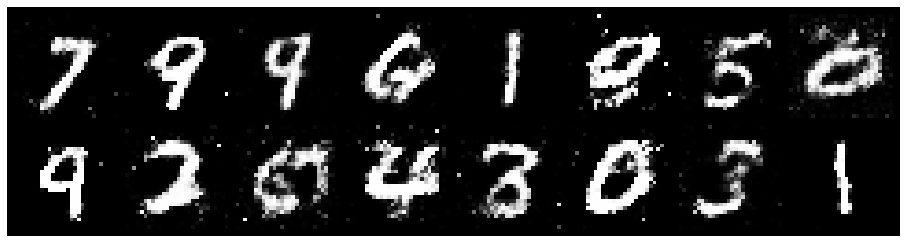

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.2425, Generator Loss: 1.0259
D(x): 0.6039, D(G(z)): 0.4418
gen_epochs:1 ,dis_epochs:1


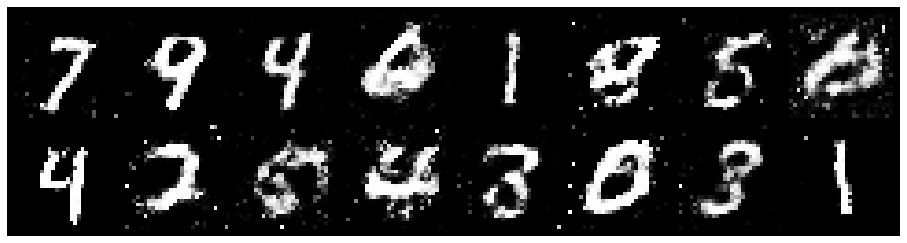

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.1944, Generator Loss: 1.0348
D(x): 0.5649, D(G(z)): 0.4049
gen_epochs:1 ,dis_epochs:1


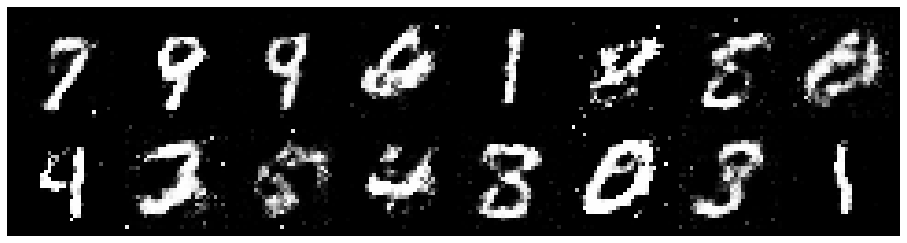

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.2379, Generator Loss: 0.9044
D(x): 0.5981, D(G(z)): 0.4179
gen_epochs:1 ,dis_epochs:1


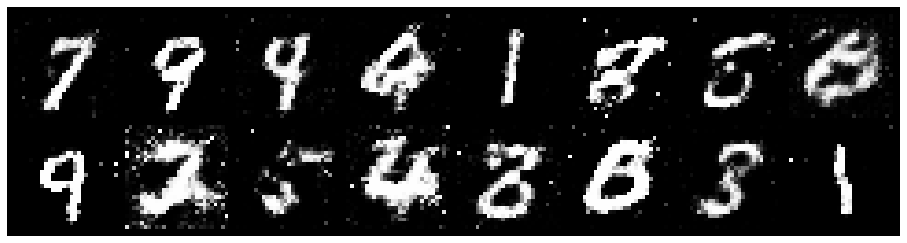

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.2145, Generator Loss: 1.2224
D(x): 0.5614, D(G(z)): 0.3761
gen_epochs:1 ,dis_epochs:1


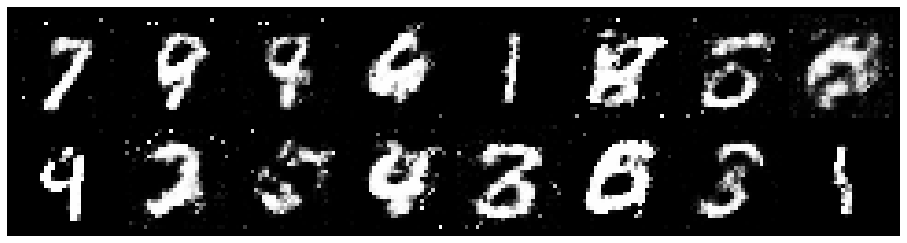

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.2022, Generator Loss: 1.1281
D(x): 0.6134, D(G(z)): 0.4054
gen_epochs:1 ,dis_epochs:1


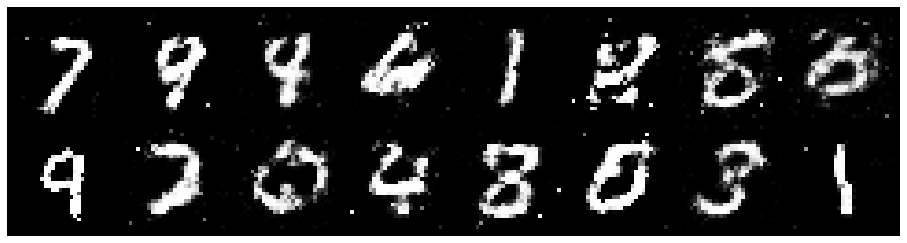

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.1688, Generator Loss: 1.0336
D(x): 0.6331, D(G(z)): 0.4231
gen_epochs:1 ,dis_epochs:1


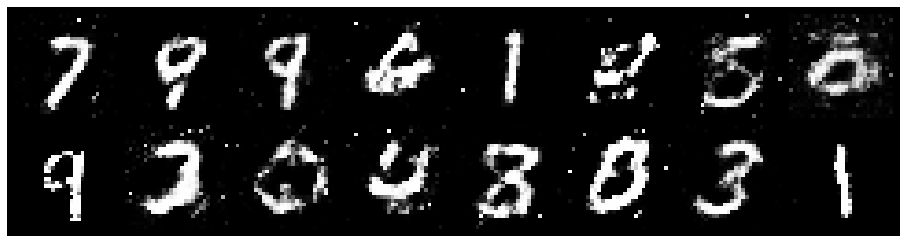

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.1534, Generator Loss: 1.0453
D(x): 0.6107, D(G(z)): 0.3957
gen_epochs:1 ,dis_epochs:1


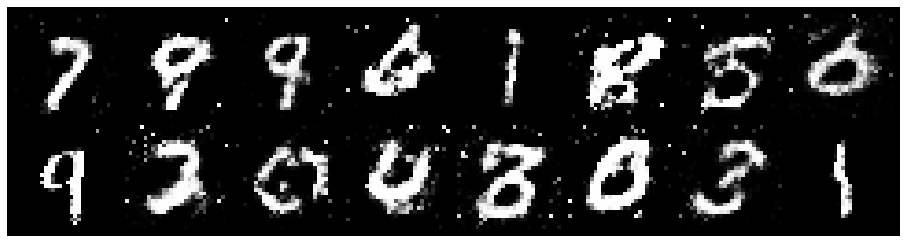

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.1336, Generator Loss: 0.9939
D(x): 0.6367, D(G(z)): 0.4215
gen_epochs:1 ,dis_epochs:1


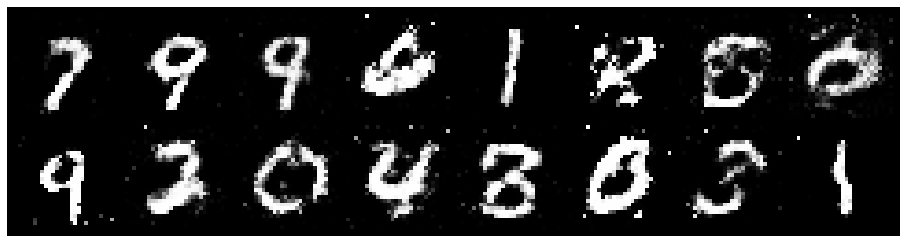

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.1812, Generator Loss: 1.0668
D(x): 0.5974, D(G(z)): 0.3982
gen_epochs:1 ,dis_epochs:1


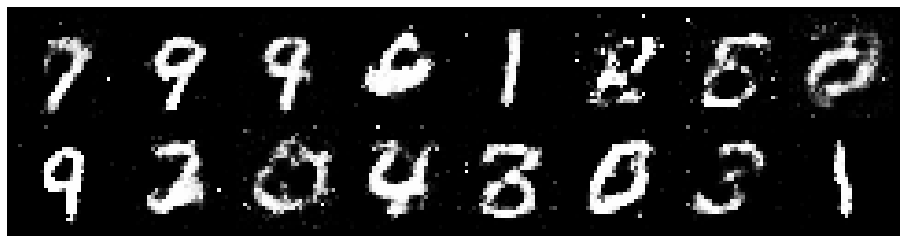

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.1613, Generator Loss: 1.1043
D(x): 0.5958, D(G(z)): 0.4039
gen_epochs:1 ,dis_epochs:1


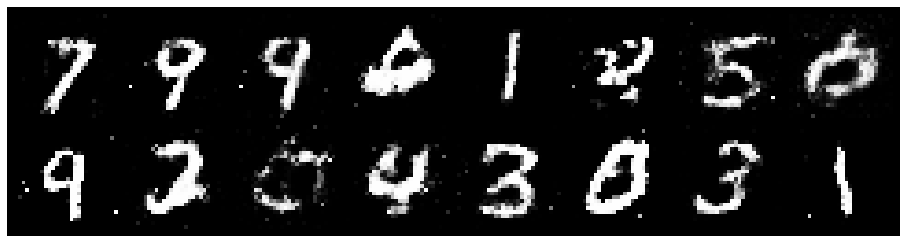

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.1503, Generator Loss: 1.0072
D(x): 0.6599, D(G(z)): 0.4427
gen_epochs:1 ,dis_epochs:1


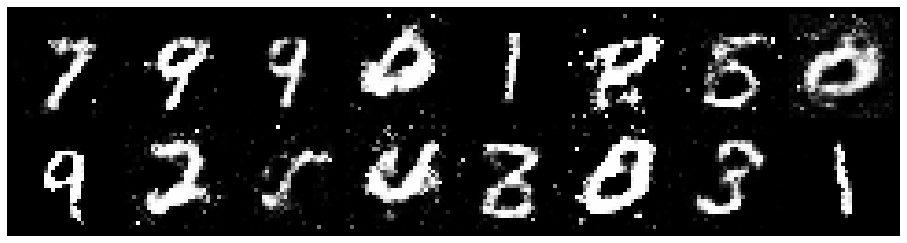

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.1098, Generator Loss: 0.9943
D(x): 0.6368, D(G(z)): 0.4185
gen_epochs:1 ,dis_epochs:1


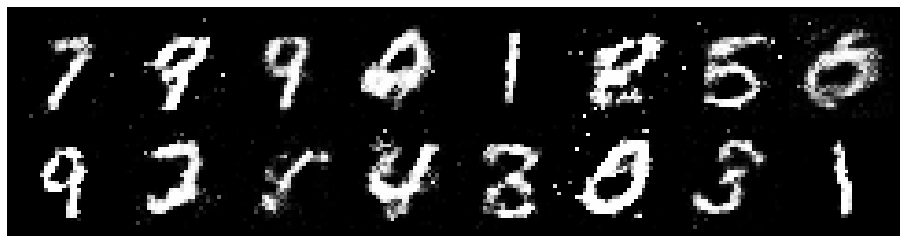

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.0812, Generator Loss: 1.1144
D(x): 0.6331, D(G(z)): 0.3926
gen_epochs:1 ,dis_epochs:1


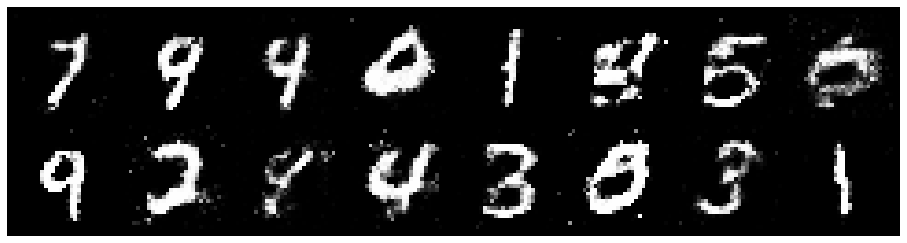

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.1603, Generator Loss: 0.9917
D(x): 0.6112, D(G(z)): 0.4128
gen_epochs:1 ,dis_epochs:1


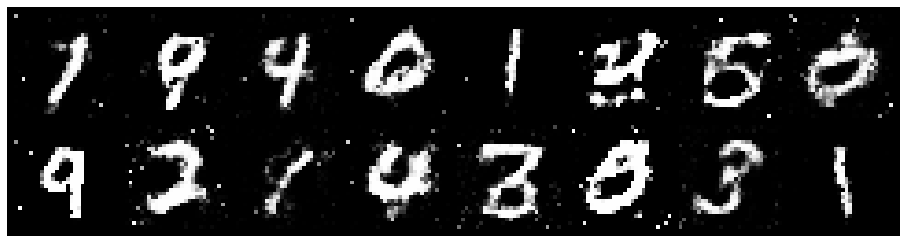

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.2404, Generator Loss: 0.9152
D(x): 0.6819, D(G(z)): 0.4969
gen_epochs:1 ,dis_epochs:1


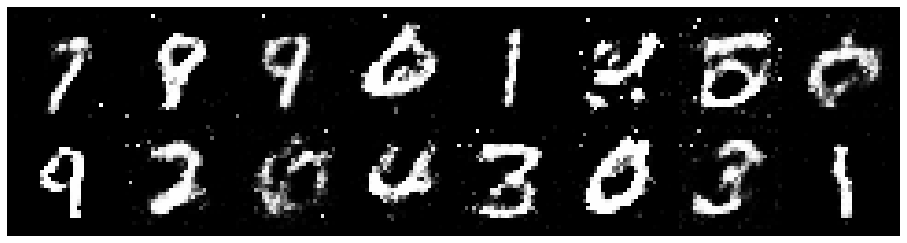

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.3172, Generator Loss: 0.9898
D(x): 0.5975, D(G(z)): 0.4698
gen_epochs:1 ,dis_epochs:1


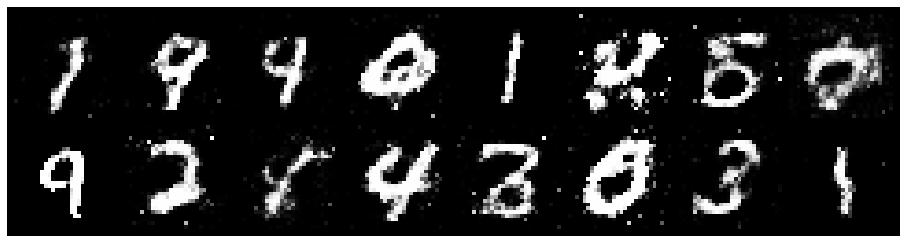

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.2998, Generator Loss: 1.0525
D(x): 0.5185, D(G(z)): 0.3854
gen_epochs:1 ,dis_epochs:1


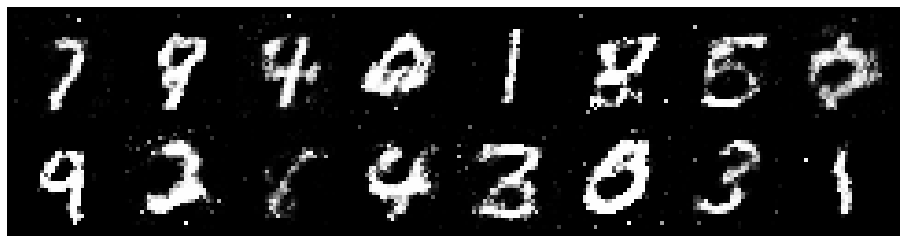

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.2621, Generator Loss: 1.1939
D(x): 0.4984, D(G(z)): 0.3526
gen_epochs:1 ,dis_epochs:1


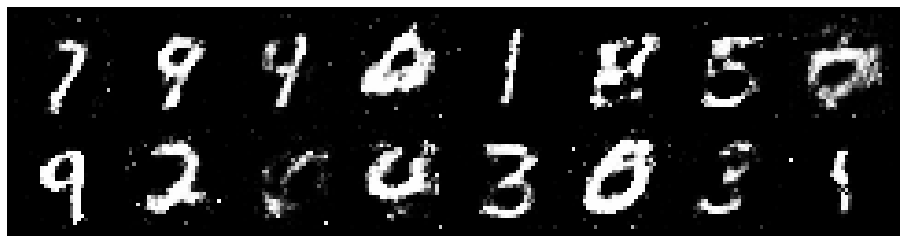

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.2697, Generator Loss: 1.0552
D(x): 0.5394, D(G(z)): 0.4152
gen_epochs:1 ,dis_epochs:1


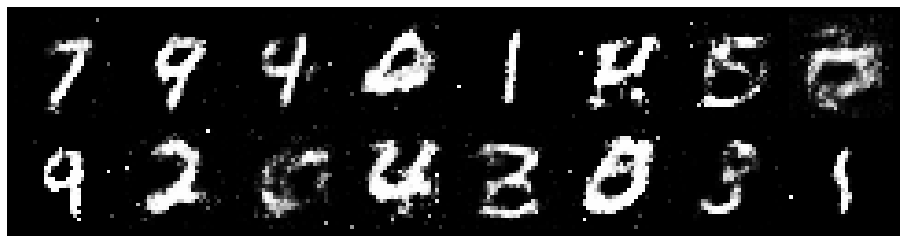

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.3329, Generator Loss: 0.9697
D(x): 0.5938, D(G(z)): 0.4595
gen_epochs:1 ,dis_epochs:1


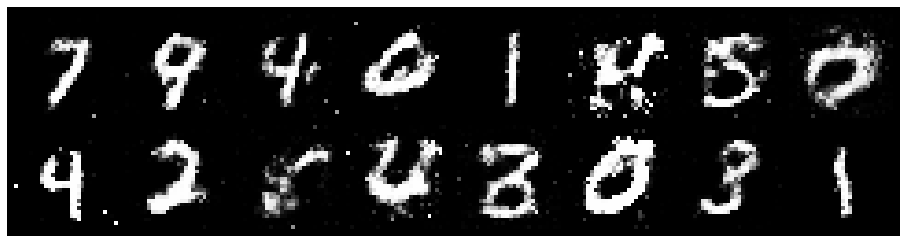

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.2333, Generator Loss: 1.0734
D(x): 0.5640, D(G(z)): 0.3950
gen_epochs:1 ,dis_epochs:1


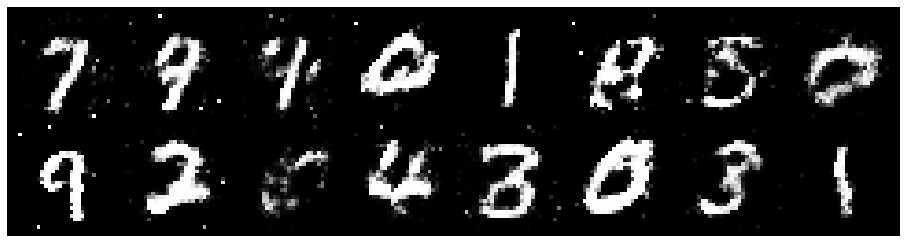

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.1395, Generator Loss: 0.9805
D(x): 0.6284, D(G(z)): 0.4073
gen_epochs:1 ,dis_epochs:1


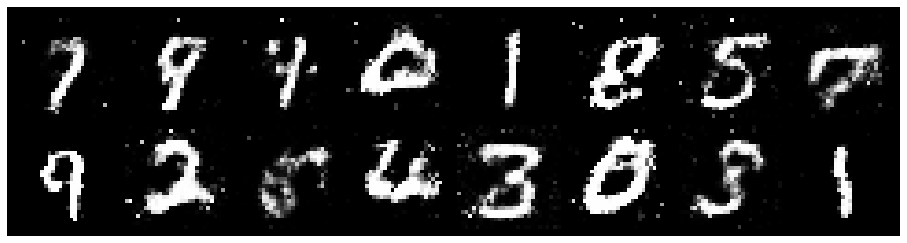

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.0650, Generator Loss: 1.1746
D(x): 0.6261, D(G(z)): 0.3636
gen_epochs:1 ,dis_epochs:1


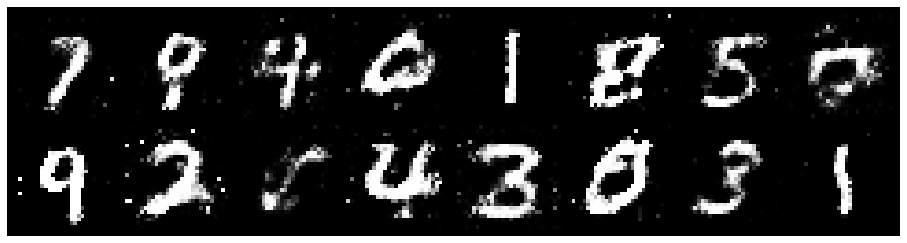

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.0482, Generator Loss: 1.0233
D(x): 0.6450, D(G(z)): 0.3879
gen_epochs:1 ,dis_epochs:1


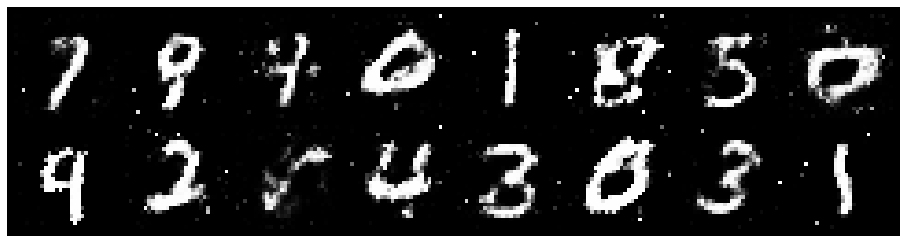

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.3728, Generator Loss: 1.2388
D(x): 0.5481, D(G(z)): 0.3988
gen_epochs:1 ,dis_epochs:1


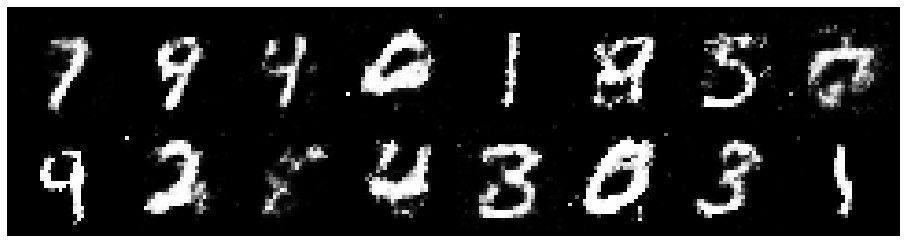

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.1445, Generator Loss: 1.1044
D(x): 0.6280, D(G(z)): 0.3919
gen_epochs:1 ,dis_epochs:1


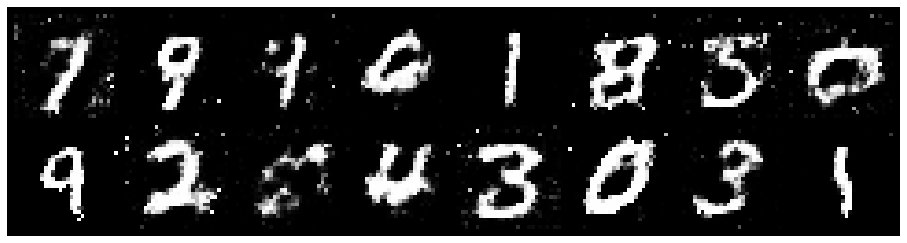

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.3348, Generator Loss: 1.1165
D(x): 0.5736, D(G(z)): 0.4408
gen_epochs:1 ,dis_epochs:1


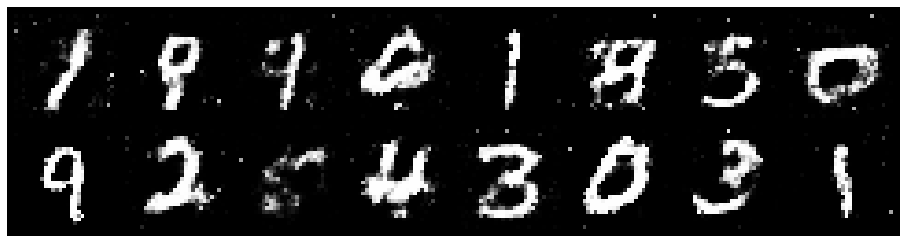

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.2304, Generator Loss: 0.9487
D(x): 0.5899, D(G(z)): 0.4283
gen_epochs:1 ,dis_epochs:1


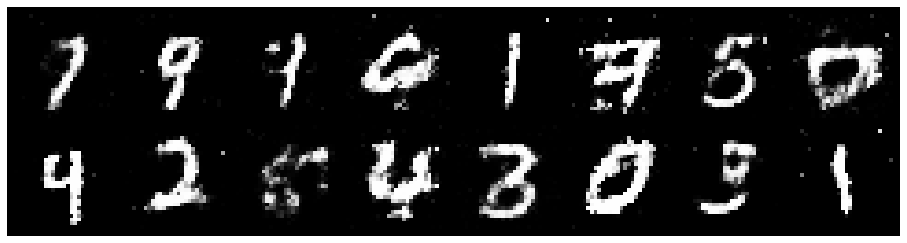

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.3686, Generator Loss: 0.8935
D(x): 0.5519, D(G(z)): 0.4472
gen_epochs:1 ,dis_epochs:1


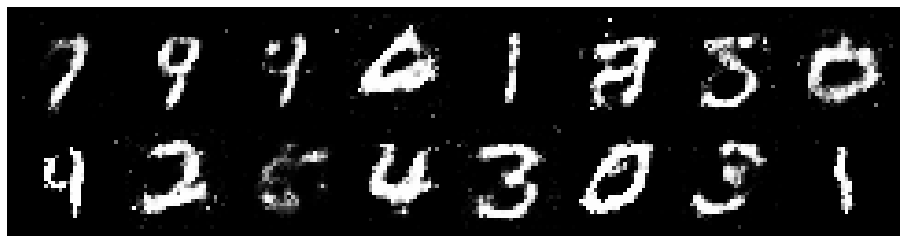

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.3262, Generator Loss: 1.0754
D(x): 0.5894, D(G(z)): 0.4174
gen_epochs:1 ,dis_epochs:1


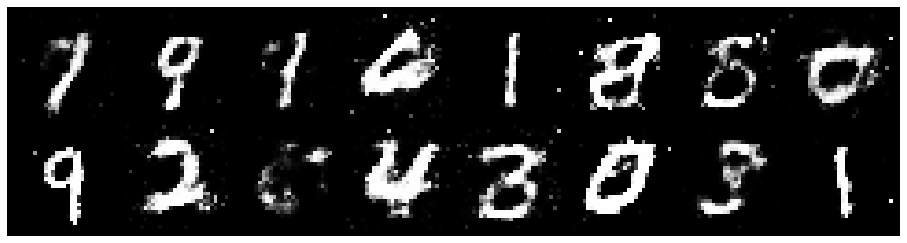

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.1852, Generator Loss: 1.3497
D(x): 0.6177, D(G(z)): 0.4042
gen_epochs:1 ,dis_epochs:1


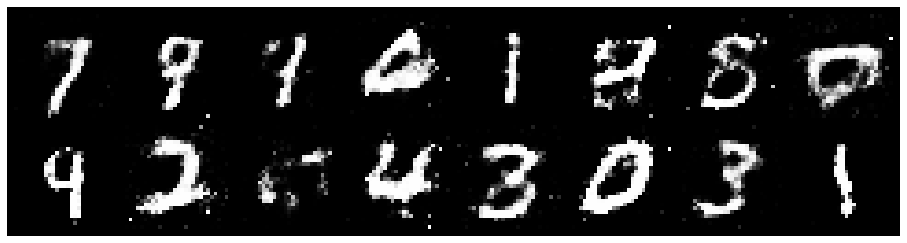

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.1935, Generator Loss: 1.1304
D(x): 0.6126, D(G(z)): 0.4260
gen_epochs:1 ,dis_epochs:1


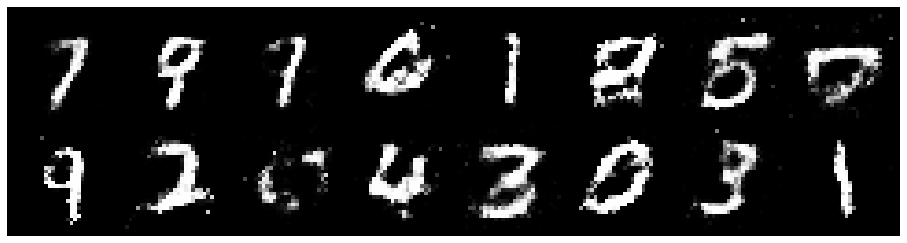

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.0052, Generator Loss: 1.0582
D(x): 0.6658, D(G(z)): 0.3922
gen_epochs:1 ,dis_epochs:1


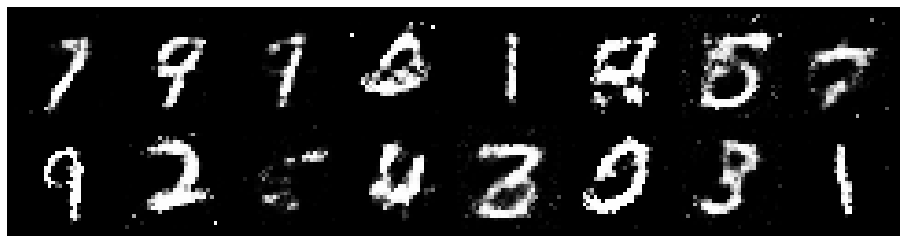

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.1561, Generator Loss: 1.0848
D(x): 0.6117, D(G(z)): 0.4141
gen_epochs:1 ,dis_epochs:1


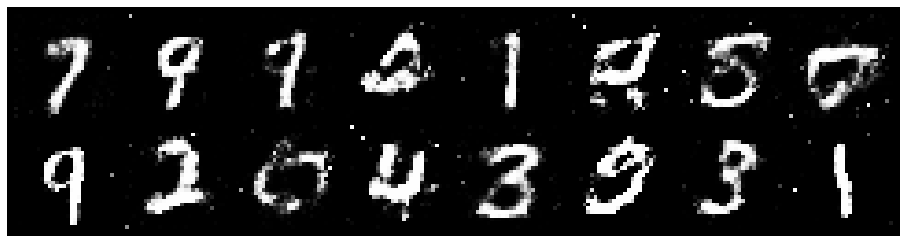

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.2174, Generator Loss: 1.0141
D(x): 0.6233, D(G(z)): 0.4374
gen_epochs:1 ,dis_epochs:1


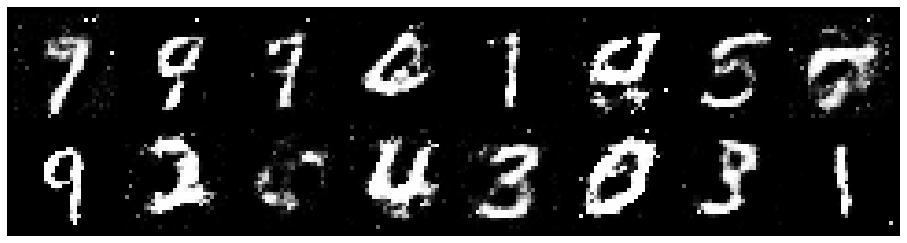

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.1783, Generator Loss: 1.0876
D(x): 0.6057, D(G(z)): 0.4191
gen_epochs:1 ,dis_epochs:1


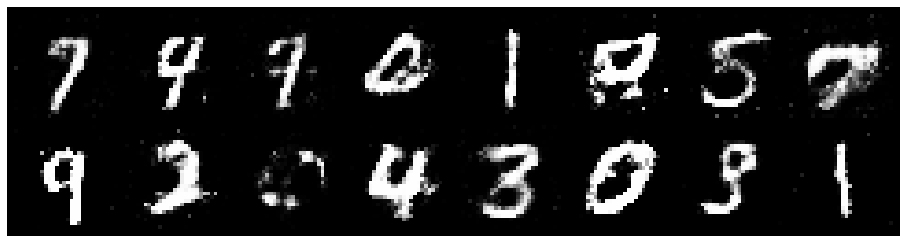

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.2384, Generator Loss: 0.9806
D(x): 0.6137, D(G(z)): 0.4589
gen_epochs:1 ,dis_epochs:1


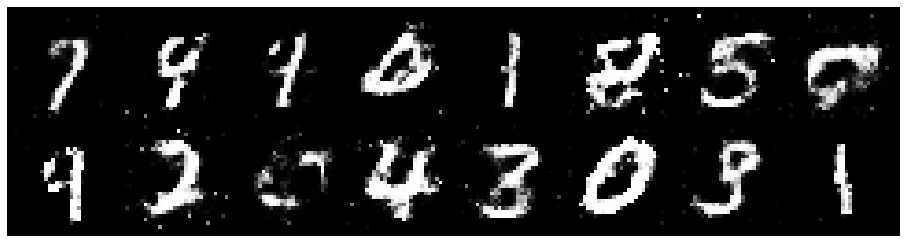

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.2441, Generator Loss: 0.9626
D(x): 0.5905, D(G(z)): 0.4154
gen_epochs:1 ,dis_epochs:1


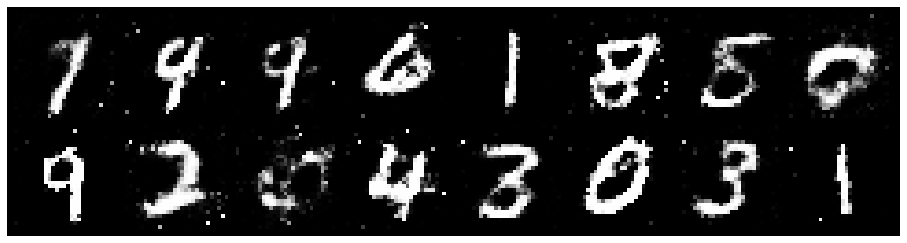

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.1724, Generator Loss: 1.2118
D(x): 0.5824, D(G(z)): 0.3824
gen_epochs:1 ,dis_epochs:1


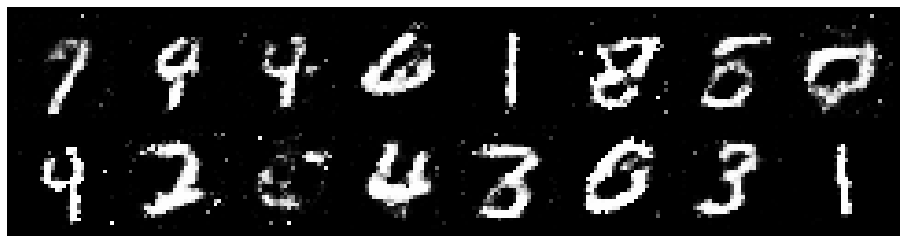

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.1846, Generator Loss: 1.0565
D(x): 0.6256, D(G(z)): 0.4329
gen_epochs:1 ,dis_epochs:1


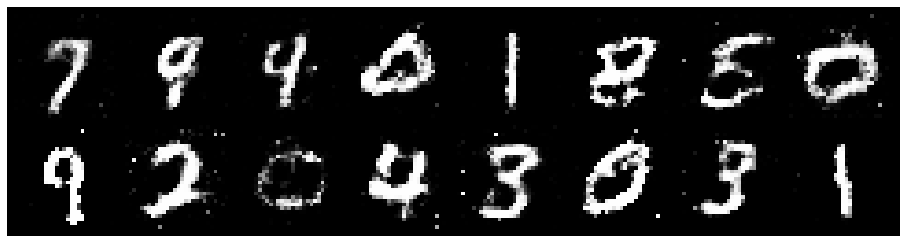

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.1905, Generator Loss: 1.0120
D(x): 0.6008, D(G(z)): 0.4232
gen_epochs:1 ,dis_epochs:1


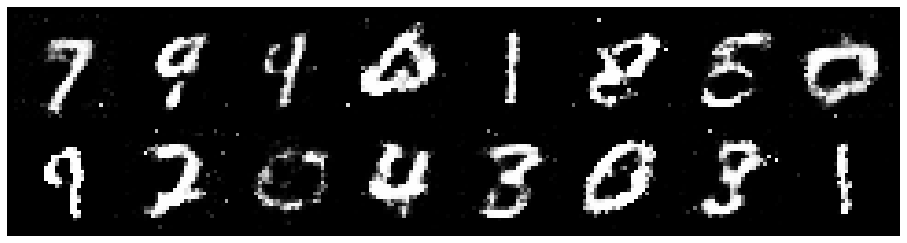

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.3290, Generator Loss: 1.0665
D(x): 0.5902, D(G(z)): 0.4419
gen_epochs:1 ,dis_epochs:1


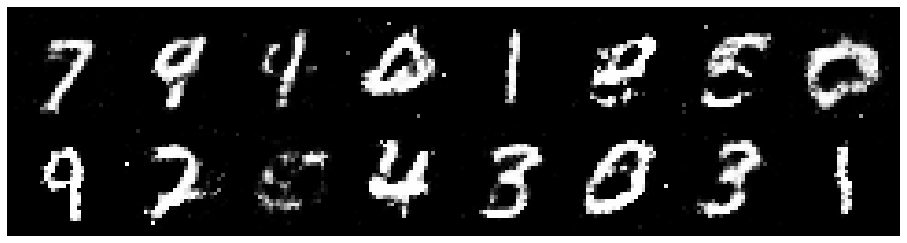

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.2799, Generator Loss: 0.9368
D(x): 0.5511, D(G(z)): 0.4121
gen_epochs:1 ,dis_epochs:1


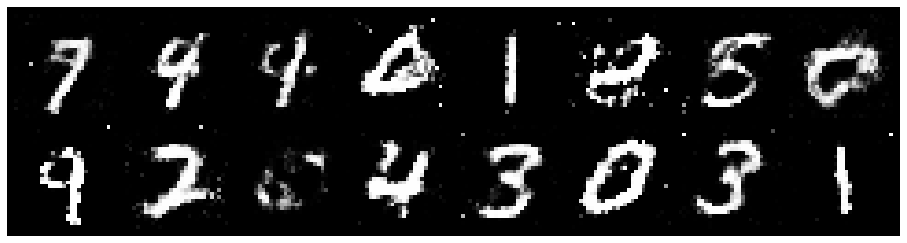

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.2731, Generator Loss: 1.0147
D(x): 0.5795, D(G(z)): 0.4276
gen_epochs:1 ,dis_epochs:1


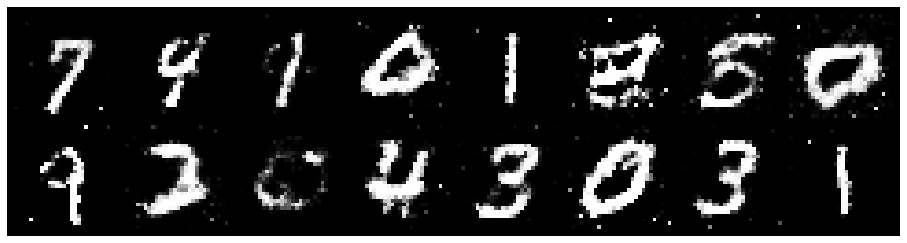

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.3521, Generator Loss: 0.9180
D(x): 0.5896, D(G(z)): 0.4795
gen_epochs:1 ,dis_epochs:1


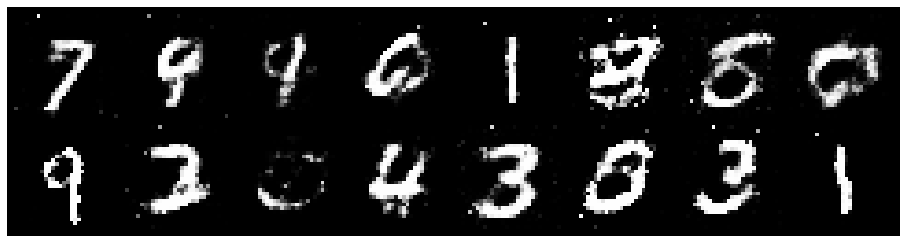

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.2233, Generator Loss: 1.1981
D(x): 0.5378, D(G(z)): 0.3719
gen_epochs:1 ,dis_epochs:1


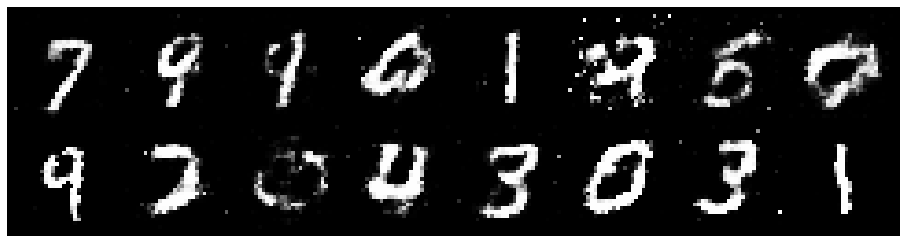

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.2114, Generator Loss: 1.0021
D(x): 0.5251, D(G(z)): 0.3516
gen_epochs:1 ,dis_epochs:1


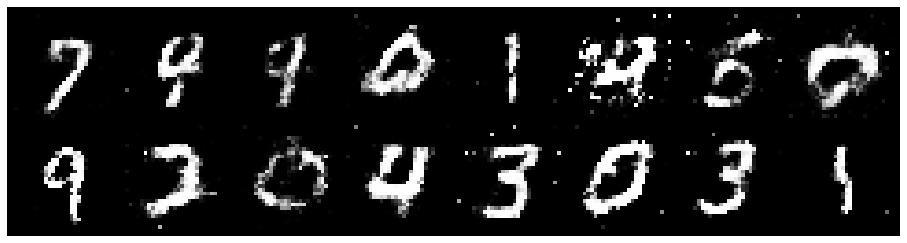

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.2750, Generator Loss: 0.8920
D(x): 0.5503, D(G(z)): 0.4494
gen_epochs:1 ,dis_epochs:1


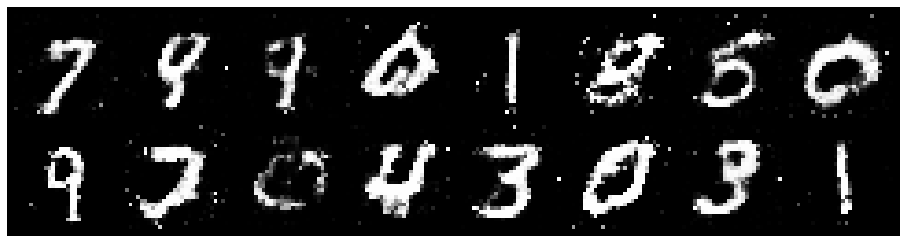

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.2753, Generator Loss: 0.9251
D(x): 0.6021, D(G(z)): 0.4653
gen_epochs:1 ,dis_epochs:1


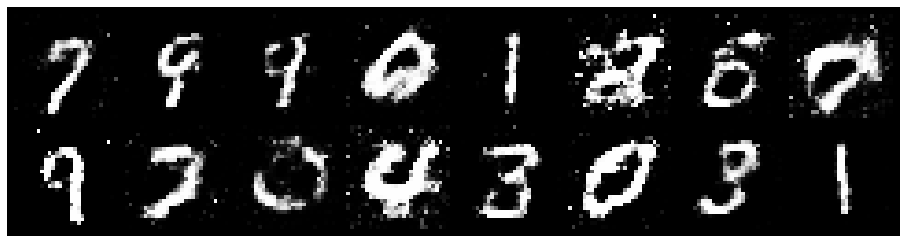

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.2631, Generator Loss: 1.0486
D(x): 0.6233, D(G(z)): 0.4411
gen_epochs:1 ,dis_epochs:1


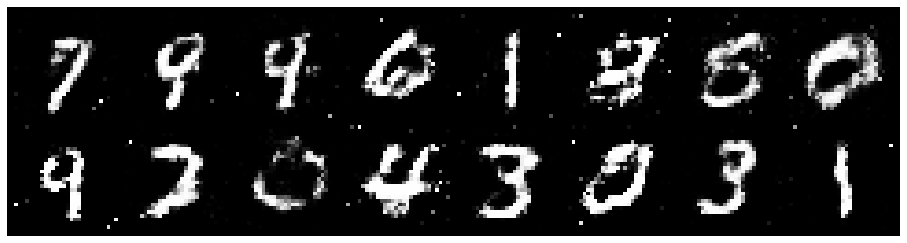

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.1589, Generator Loss: 1.1414
D(x): 0.6155, D(G(z)): 0.4047
gen_epochs:1 ,dis_epochs:1


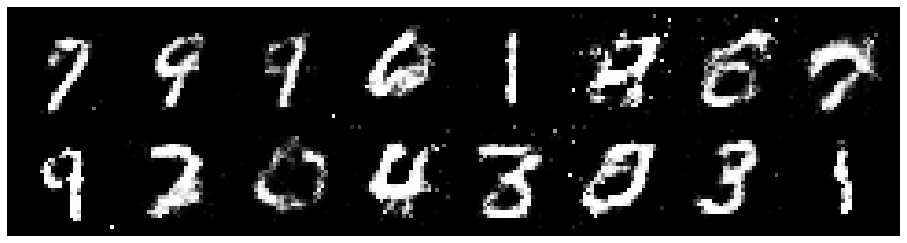

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.0969, Generator Loss: 1.1765
D(x): 0.6613, D(G(z)): 0.4043
gen_epochs:1 ,dis_epochs:1


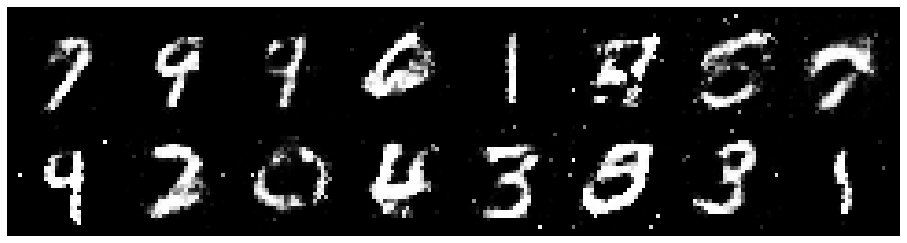

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.1639, Generator Loss: 1.0373
D(x): 0.6844, D(G(z)): 0.4352
gen_epochs:1 ,dis_epochs:1


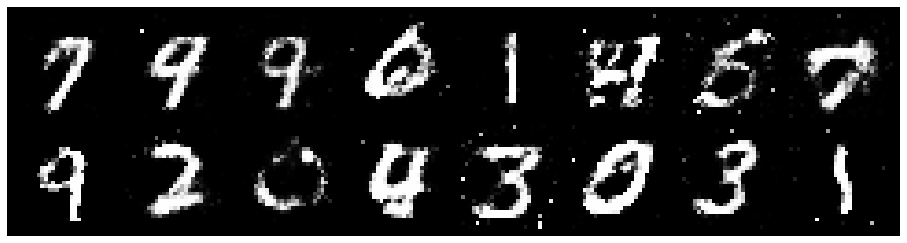

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.1734, Generator Loss: 1.2199
D(x): 0.6004, D(G(z)): 0.3906
gen_epochs:1 ,dis_epochs:1


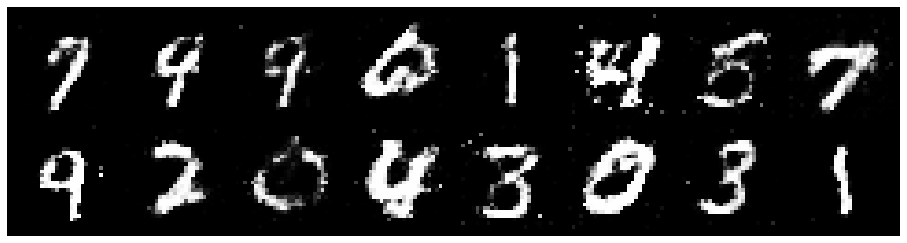

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.0662, Generator Loss: 1.1644
D(x): 0.5935, D(G(z)): 0.3376
gen_epochs:1 ,dis_epochs:1


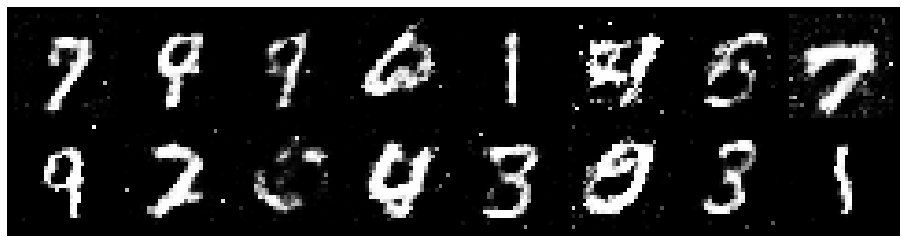

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.2171, Generator Loss: 0.9151
D(x): 0.5979, D(G(z)): 0.4351
gen_epochs:1 ,dis_epochs:1


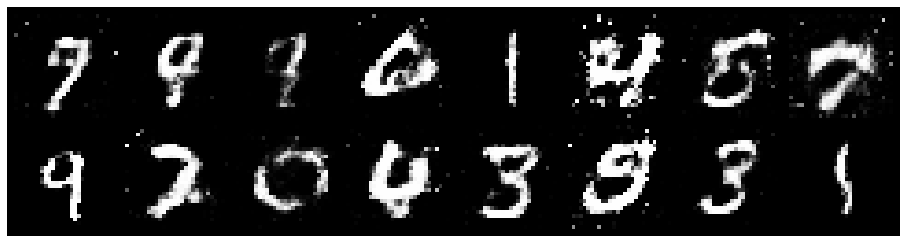

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.2162, Generator Loss: 1.1628
D(x): 0.5792, D(G(z)): 0.4054
gen_epochs:1 ,dis_epochs:1


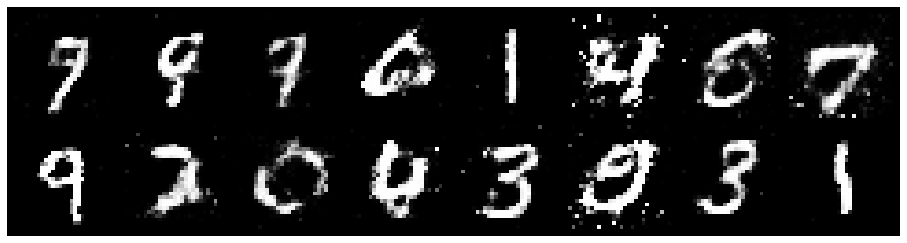

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.2466, Generator Loss: 1.0901
D(x): 0.5551, D(G(z)): 0.4088
gen_epochs:1 ,dis_epochs:1


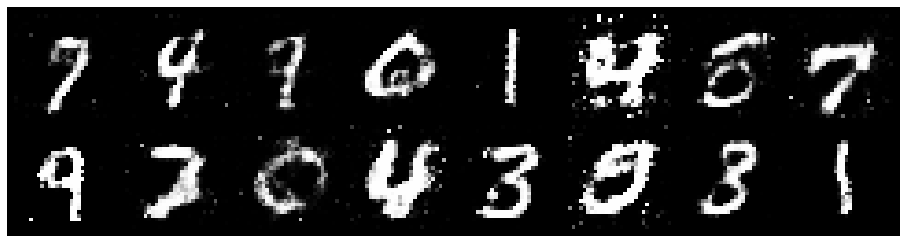

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.2367, Generator Loss: 1.0209
D(x): 0.5621, D(G(z)): 0.3929
gen_epochs:1 ,dis_epochs:1


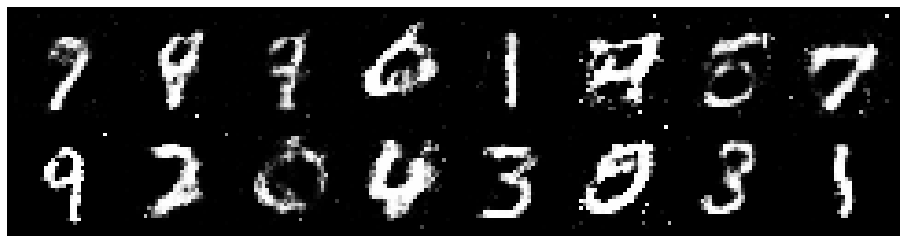

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.1432, Generator Loss: 0.9495
D(x): 0.6335, D(G(z)): 0.4261
gen_epochs:1 ,dis_epochs:1


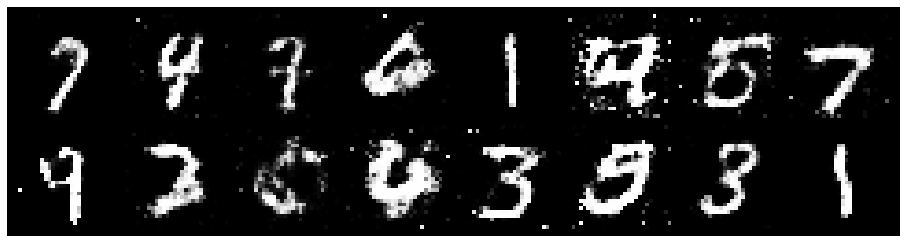

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.0168, Generator Loss: 1.2758
D(x): 0.6704, D(G(z)): 0.3748
gen_epochs:1 ,dis_epochs:1


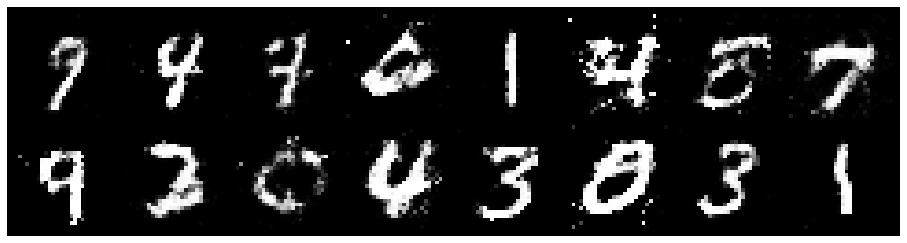

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.2190, Generator Loss: 1.1112
D(x): 0.6014, D(G(z)): 0.4312
gen_epochs:1 ,dis_epochs:1


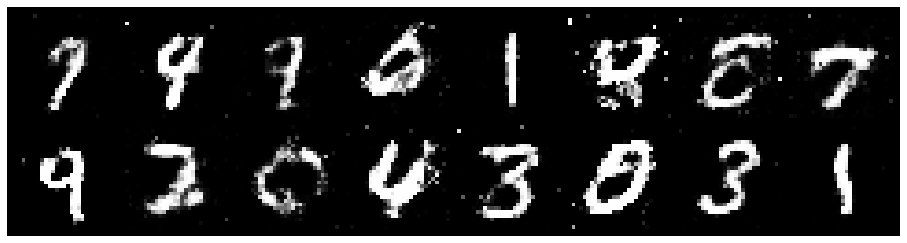

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.0885, Generator Loss: 1.2348
D(x): 0.6385, D(G(z)): 0.3819
gen_epochs:1 ,dis_epochs:1


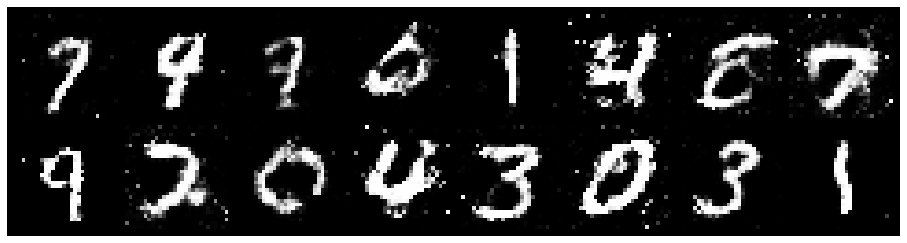

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.2438, Generator Loss: 1.3519
D(x): 0.5751, D(G(z)): 0.3613
gen_epochs:1 ,dis_epochs:1


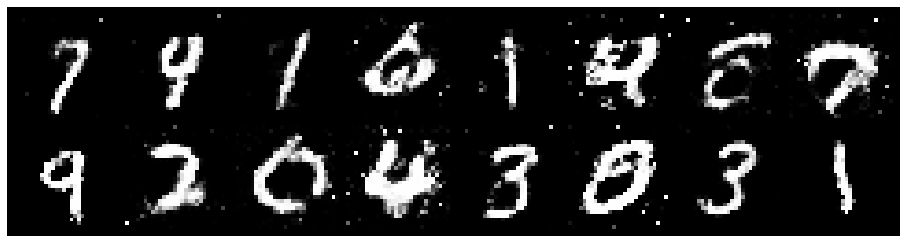

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.1965, Generator Loss: 1.0337
D(x): 0.6039, D(G(z)): 0.4198
gen_epochs:1 ,dis_epochs:1


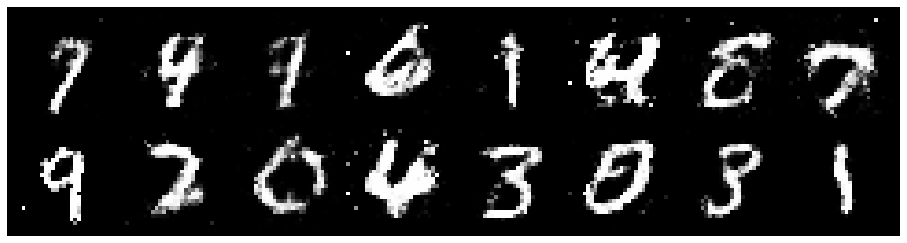

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.1701, Generator Loss: 1.1881
D(x): 0.6128, D(G(z)): 0.4159
gen_epochs:1 ,dis_epochs:1


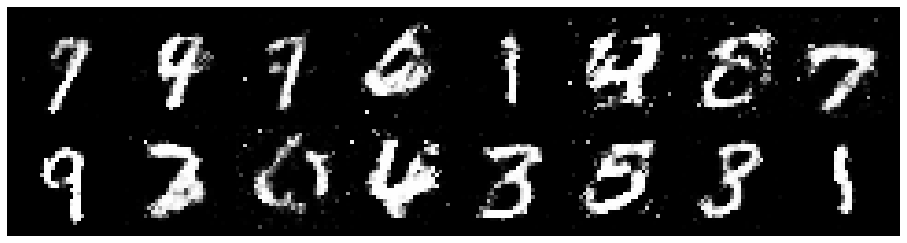

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.1768, Generator Loss: 1.0023
D(x): 0.6403, D(G(z)): 0.4455
gen_epochs:1 ,dis_epochs:1


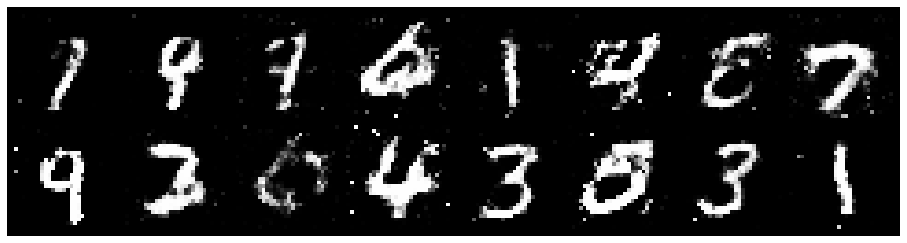

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.3101, Generator Loss: 1.2349
D(x): 0.5666, D(G(z)): 0.4009
gen_epochs:1 ,dis_epochs:1


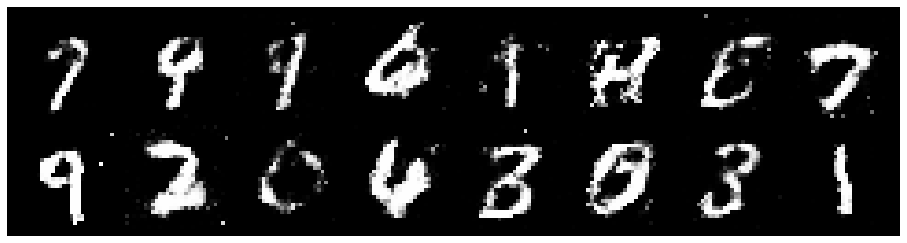

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.0998, Generator Loss: 1.3429
D(x): 0.6126, D(G(z)): 0.3612
gen_epochs:1 ,dis_epochs:1


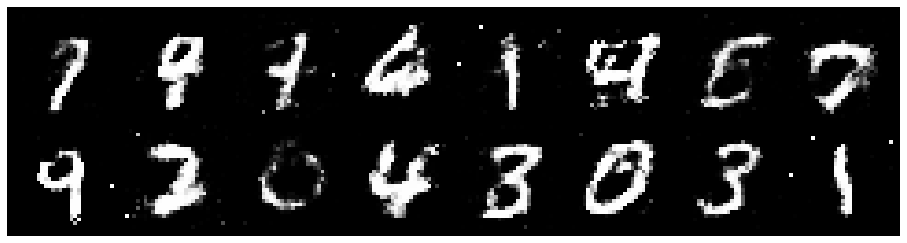

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.0778, Generator Loss: 0.9955
D(x): 0.6312, D(G(z)): 0.3881
gen_epochs:1 ,dis_epochs:1


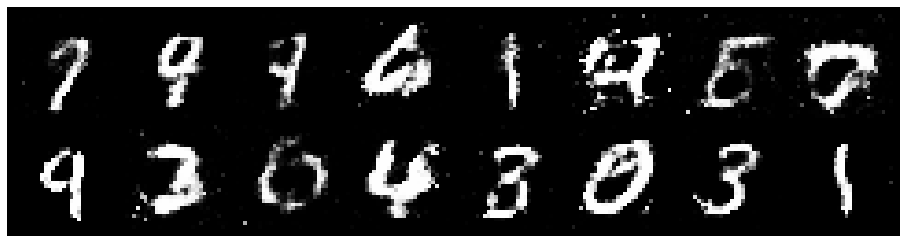

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.1486, Generator Loss: 0.9739
D(x): 0.5860, D(G(z)): 0.3915
gen_epochs:1 ,dis_epochs:1


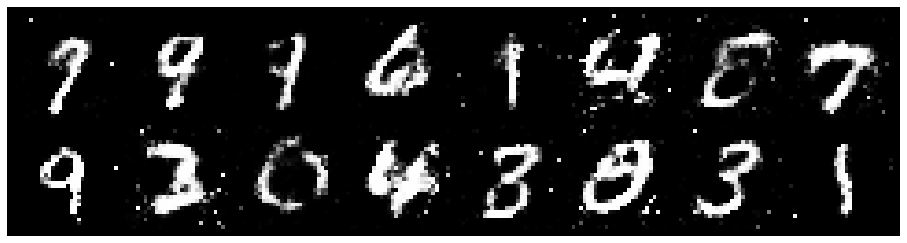

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.0359, Generator Loss: 1.2161
D(x): 0.6277, D(G(z)): 0.3585
gen_epochs:1 ,dis_epochs:1


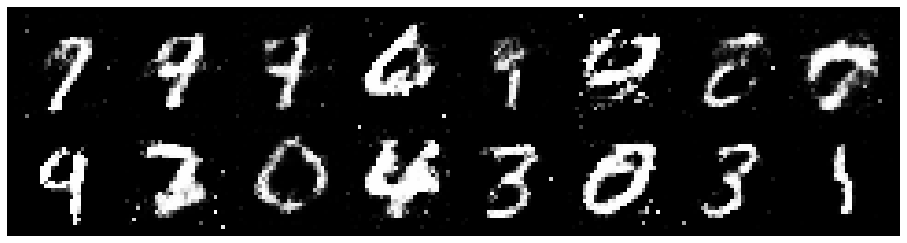

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.1599, Generator Loss: 0.9641
D(x): 0.6529, D(G(z)): 0.4278
gen_epochs:1 ,dis_epochs:1


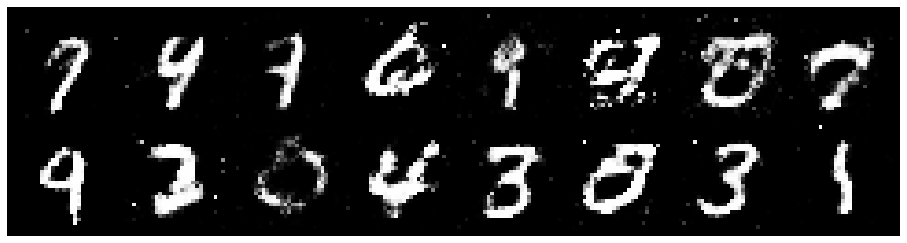

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.2412, Generator Loss: 1.0039
D(x): 0.5861, D(G(z)): 0.4267
gen_epochs:1 ,dis_epochs:1


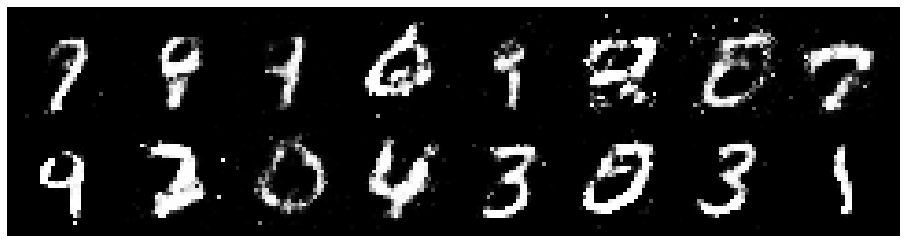

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.2122, Generator Loss: 0.9945
D(x): 0.5461, D(G(z)): 0.3752
gen_epochs:1 ,dis_epochs:1


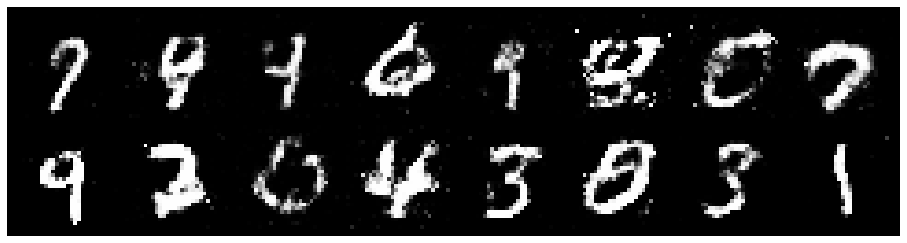

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.0905, Generator Loss: 1.1236
D(x): 0.6296, D(G(z)): 0.3969
gen_epochs:1 ,dis_epochs:1


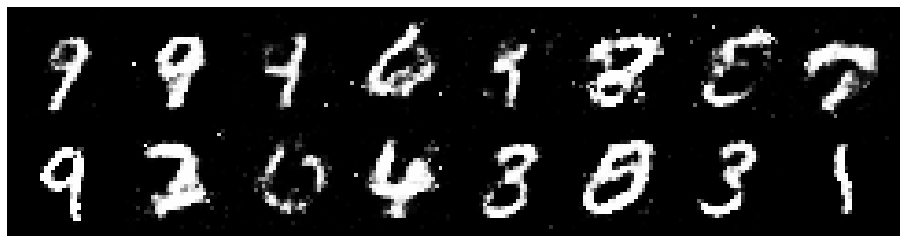

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.1280, Generator Loss: 1.2341
D(x): 0.6070, D(G(z)): 0.4000
gen_epochs:1 ,dis_epochs:1


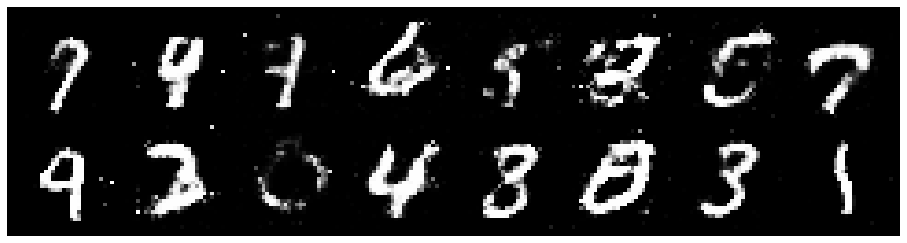

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.1025, Generator Loss: 0.9018
D(x): 0.6351, D(G(z)): 0.4174
gen_epochs:1 ,dis_epochs:1


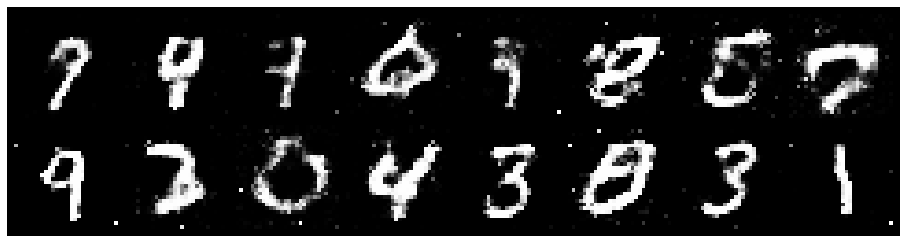

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.1430, Generator Loss: 1.0529
D(x): 0.6032, D(G(z)): 0.4062
gen_epochs:1 ,dis_epochs:1


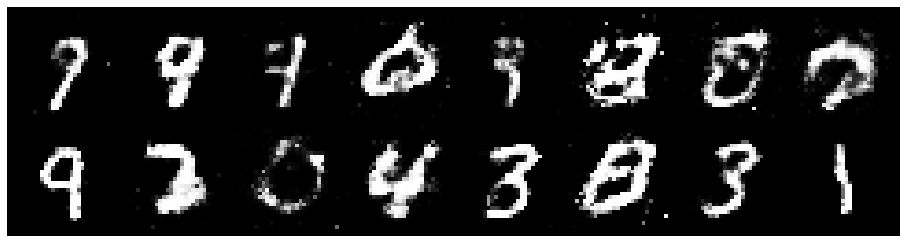

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.2257, Generator Loss: 1.0759
D(x): 0.5588, D(G(z)): 0.4051
gen_epochs:1 ,dis_epochs:1


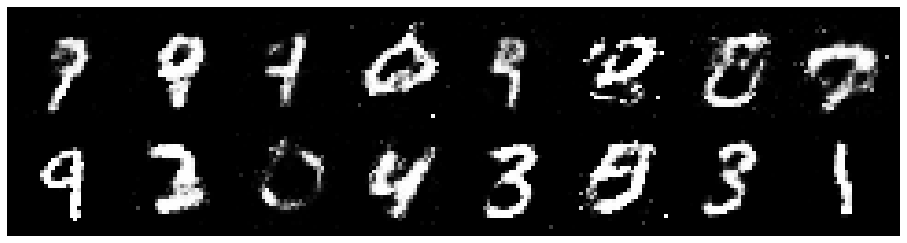

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.1341, Generator Loss: 0.9800
D(x): 0.5828, D(G(z)): 0.3820
gen_epochs:1 ,dis_epochs:1


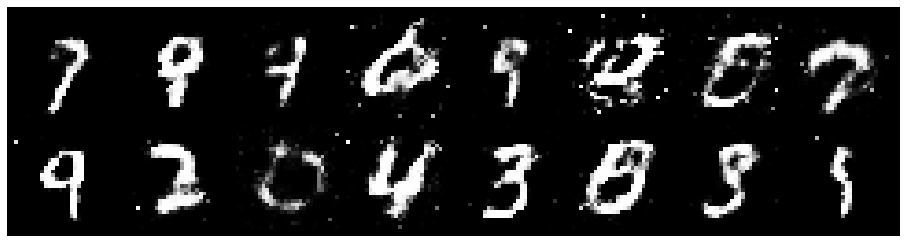

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.2462, Generator Loss: 1.0255
D(x): 0.5712, D(G(z)): 0.4252
gen_epochs:1 ,dis_epochs:1


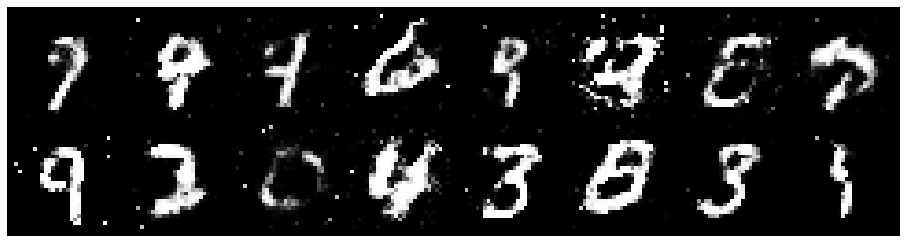

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.1527, Generator Loss: 1.0891
D(x): 0.5923, D(G(z)): 0.3898
gen_epochs:1 ,dis_epochs:1


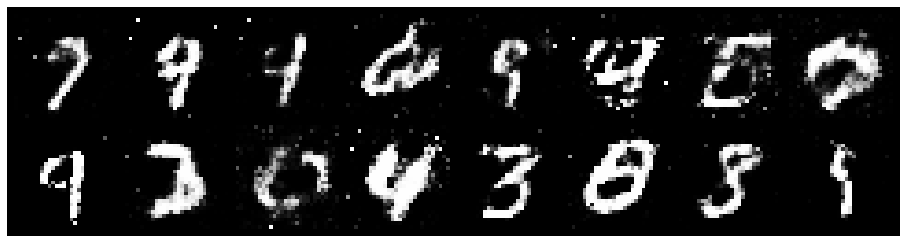

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1896, Generator Loss: 1.0276
D(x): 0.6227, D(G(z)): 0.4301
gen_epochs:1 ,dis_epochs:1


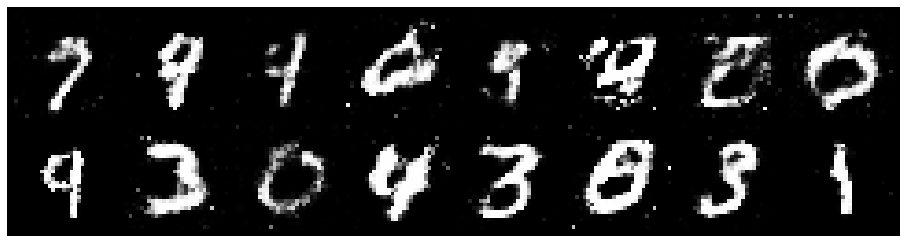

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.3453, Generator Loss: 0.9399
D(x): 0.6273, D(G(z)): 0.4891
gen_epochs:1 ,dis_epochs:1


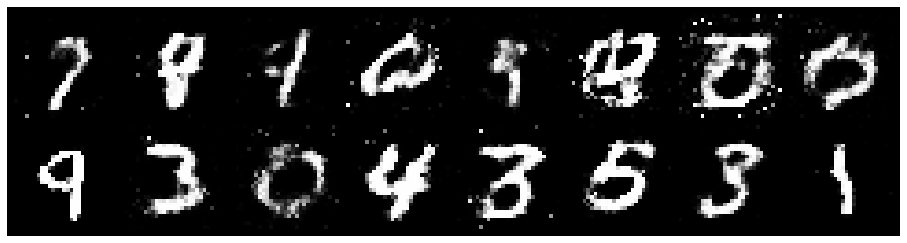

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.1477, Generator Loss: 1.1743
D(x): 0.5855, D(G(z)): 0.3750
gen_epochs:1 ,dis_epochs:1


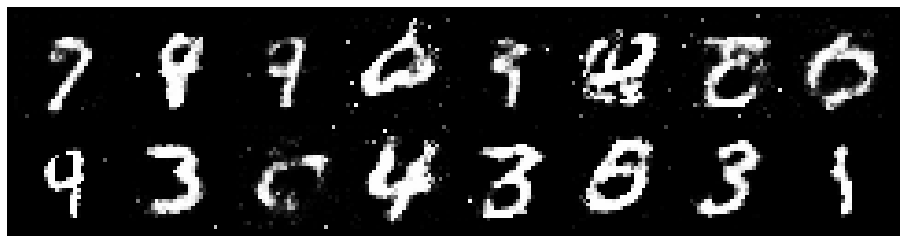

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.0115, Generator Loss: 1.0446
D(x): 0.6071, D(G(z)): 0.3405
gen_epochs:1 ,dis_epochs:1


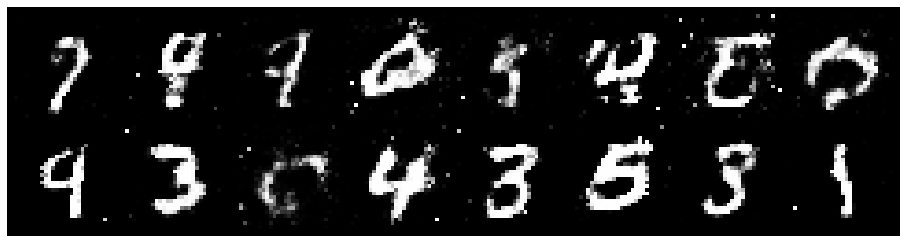

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.2393, Generator Loss: 1.0922
D(x): 0.5849, D(G(z)): 0.4249
gen_epochs:1 ,dis_epochs:1


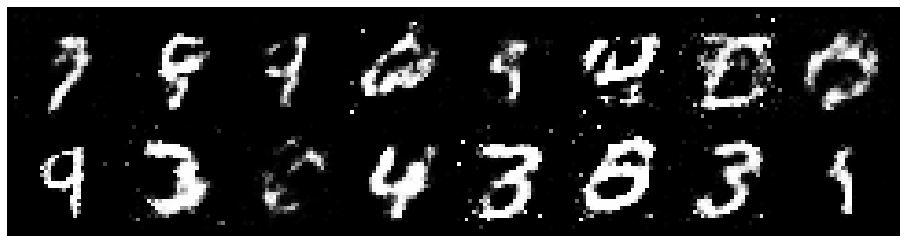

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.1414, Generator Loss: 0.9264
D(x): 0.6319, D(G(z)): 0.4319
gen_epochs:1 ,dis_epochs:1


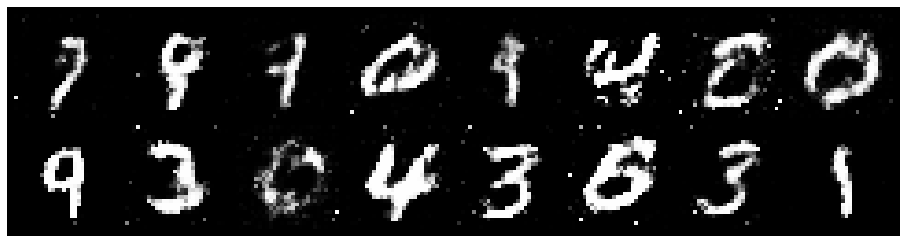

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.1669, Generator Loss: 0.8818
D(x): 0.5930, D(G(z)): 0.4131
gen_epochs:1 ,dis_epochs:1


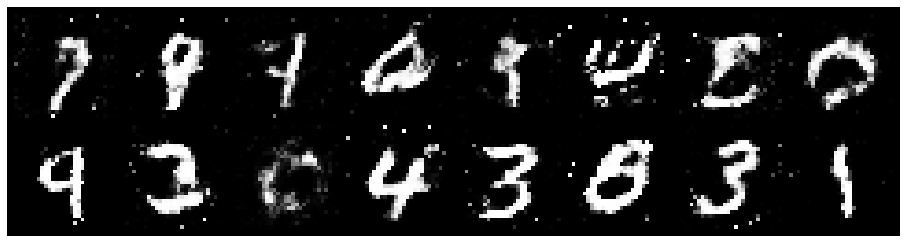

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.2086, Generator Loss: 0.9840
D(x): 0.5990, D(G(z)): 0.4044
gen_epochs:1 ,dis_epochs:1


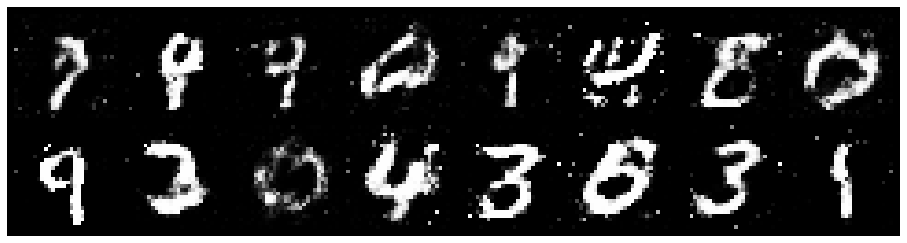

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.2573, Generator Loss: 1.0397
D(x): 0.5654, D(G(z)): 0.4277
gen_epochs:1 ,dis_epochs:1


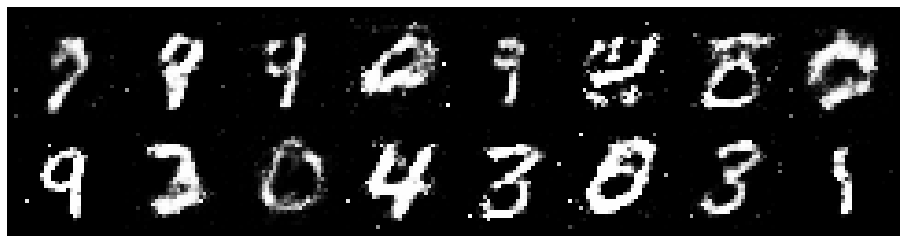

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.2998, Generator Loss: 0.9812
D(x): 0.5625, D(G(z)): 0.4485
gen_epochs:1 ,dis_epochs:1


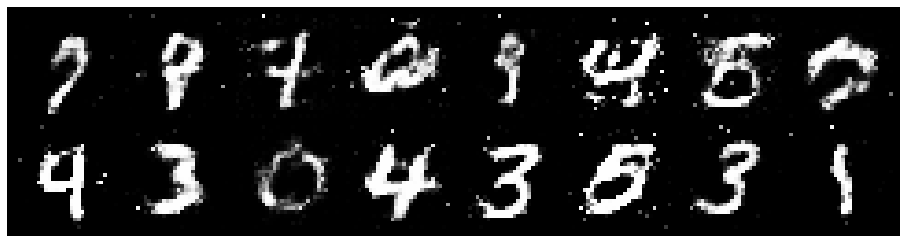

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.2460, Generator Loss: 0.9338
D(x): 0.5657, D(G(z)): 0.4224
gen_epochs:1 ,dis_epochs:1


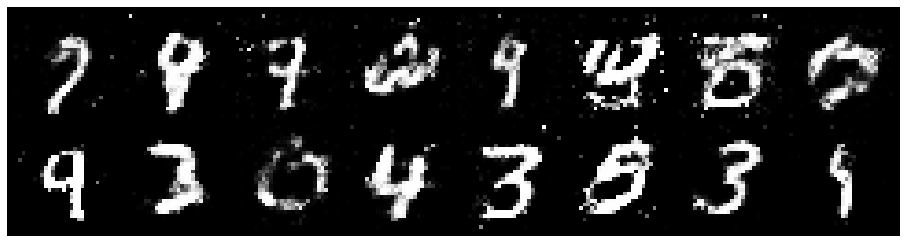

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.1734, Generator Loss: 1.0626
D(x): 0.5869, D(G(z)): 0.3991
gen_epochs:1 ,dis_epochs:1


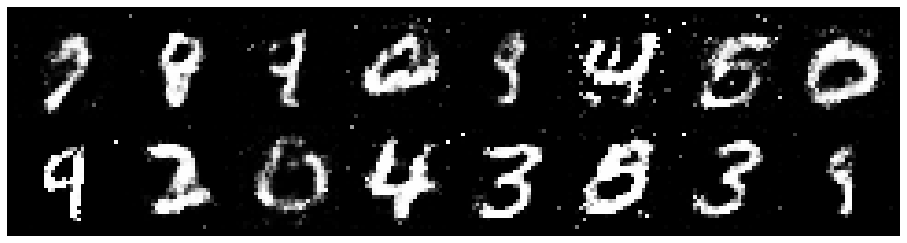

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.2317, Generator Loss: 1.2367
D(x): 0.6160, D(G(z)): 0.4253
gen_epochs:1 ,dis_epochs:1


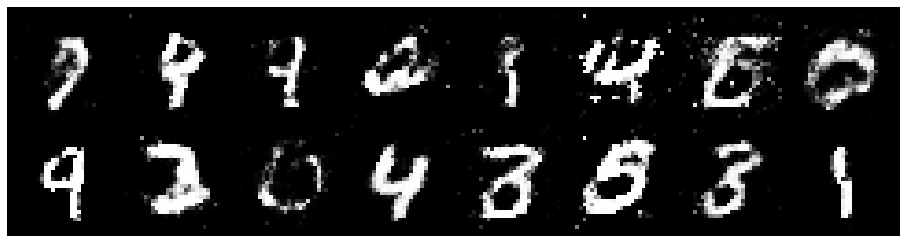

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.1743, Generator Loss: 0.9250
D(x): 0.5932, D(G(z)): 0.4447
gen_epochs:1 ,dis_epochs:1


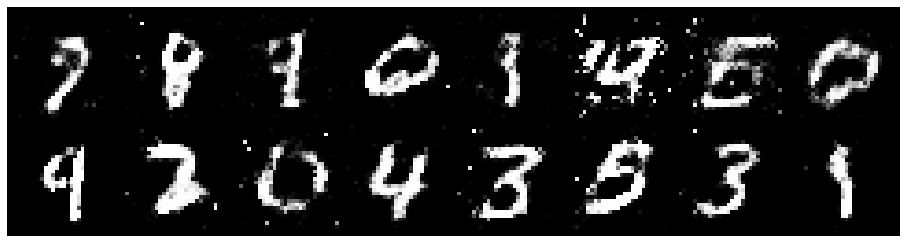

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.1664, Generator Loss: 0.8724
D(x): 0.5889, D(G(z)): 0.4113
gen_epochs:1 ,dis_epochs:1


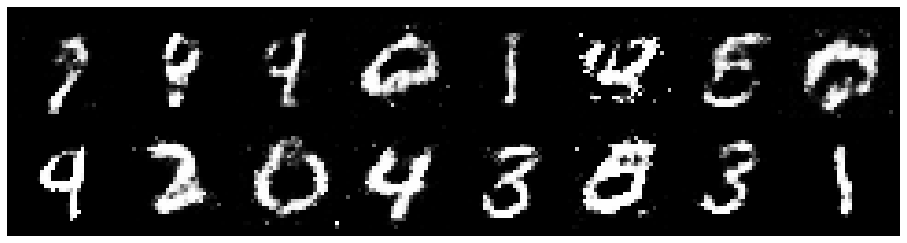

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.3056, Generator Loss: 0.8445
D(x): 0.5620, D(G(z)): 0.4471
gen_epochs:1 ,dis_epochs:1


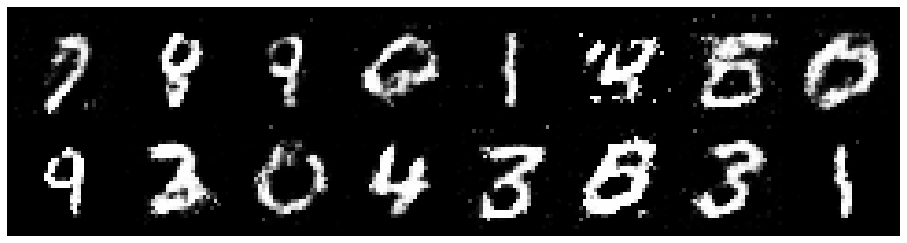

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.2247, Generator Loss: 1.0015
D(x): 0.5692, D(G(z)): 0.4260
gen_epochs:1 ,dis_epochs:1


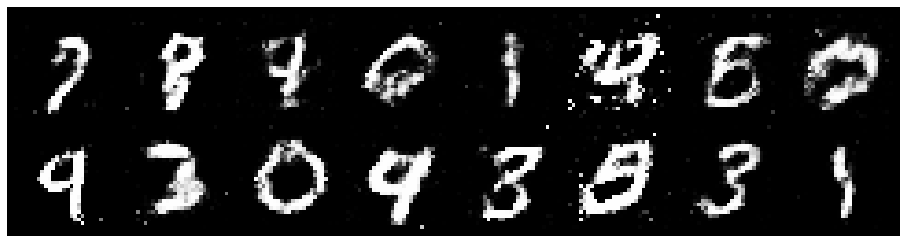

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2325, Generator Loss: 1.0281
D(x): 0.5748, D(G(z)): 0.4210
gen_epochs:1 ,dis_epochs:1


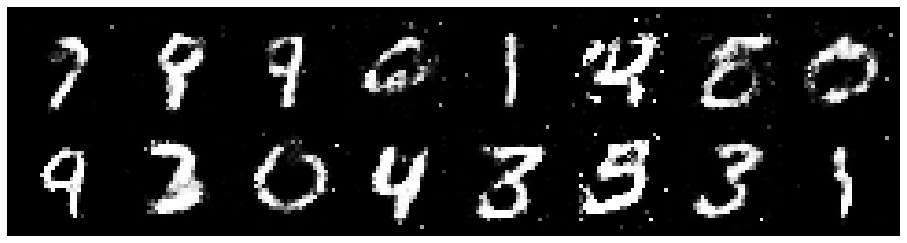

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.2149, Generator Loss: 1.0046
D(x): 0.6127, D(G(z)): 0.4443
gen_epochs:1 ,dis_epochs:1


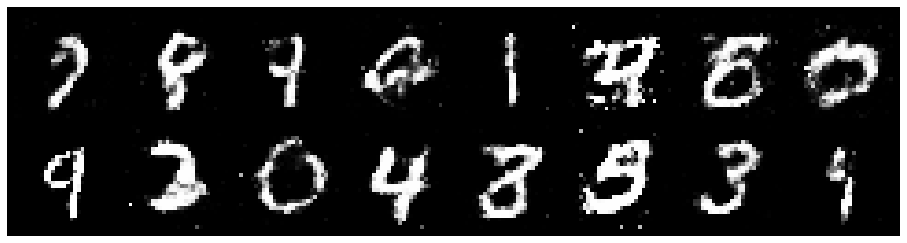

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.1150, Generator Loss: 0.8553
D(x): 0.6236, D(G(z)): 0.4246
gen_epochs:1 ,dis_epochs:1


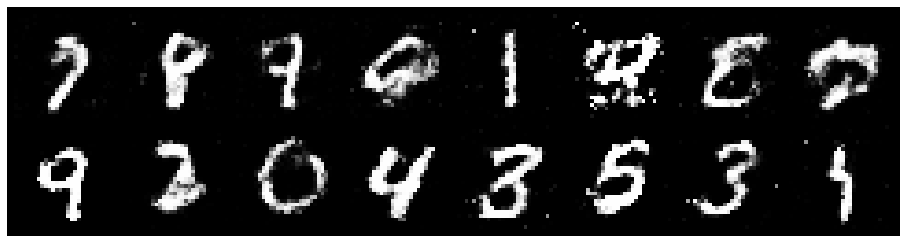

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.1352, Generator Loss: 0.9914
D(x): 0.5762, D(G(z)): 0.3927
gen_epochs:1 ,dis_epochs:1


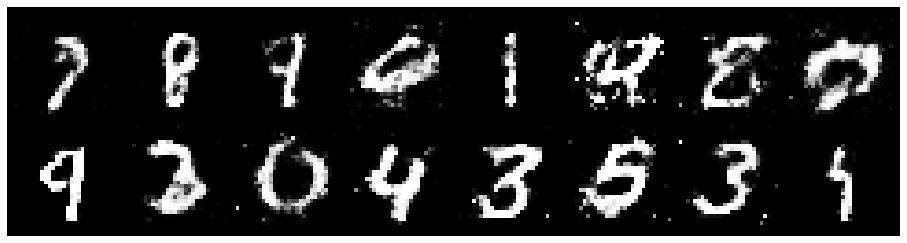

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.1540, Generator Loss: 0.9322
D(x): 0.6147, D(G(z)): 0.4441
gen_epochs:1 ,dis_epochs:1


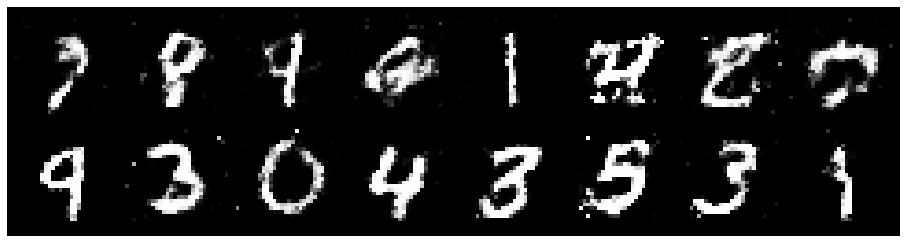

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.4211, Generator Loss: 0.8806
D(x): 0.5156, D(G(z)): 0.4202
gen_epochs:1 ,dis_epochs:1


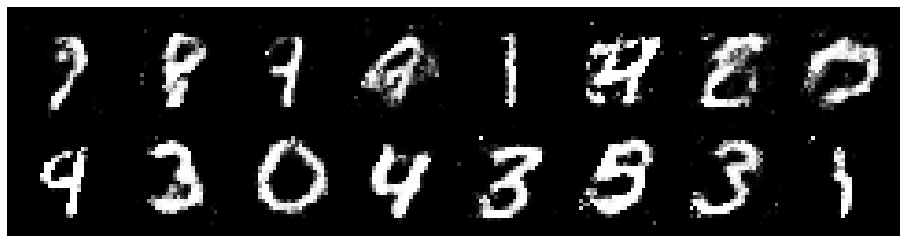

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.2091, Generator Loss: 0.9665
D(x): 0.5915, D(G(z)): 0.4357
gen_epochs:1 ,dis_epochs:1


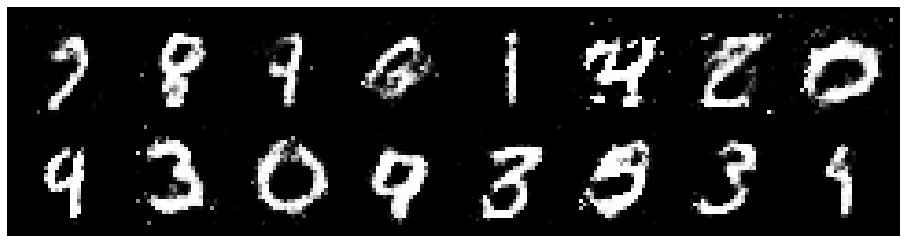

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.3378, Generator Loss: 0.9682
D(x): 0.5360, D(G(z)): 0.4507
gen_epochs:1 ,dis_epochs:1


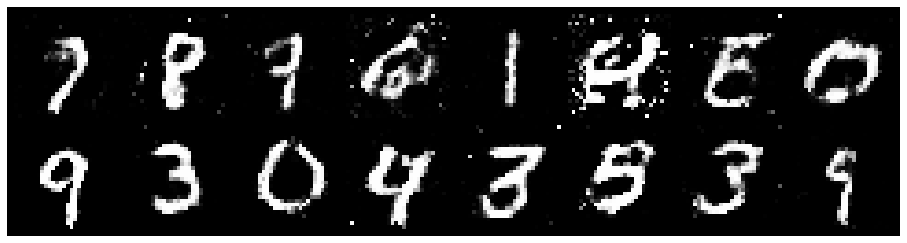

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.0997, Generator Loss: 1.0559
D(x): 0.6311, D(G(z)): 0.4061
gen_epochs:1 ,dis_epochs:1


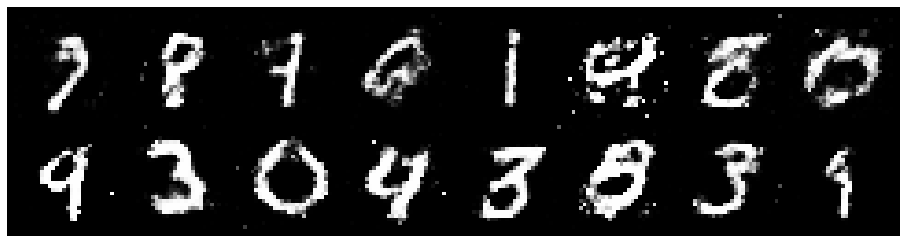

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.1503, Generator Loss: 1.0107
D(x): 0.6156, D(G(z)): 0.4264
gen_epochs:1 ,dis_epochs:1


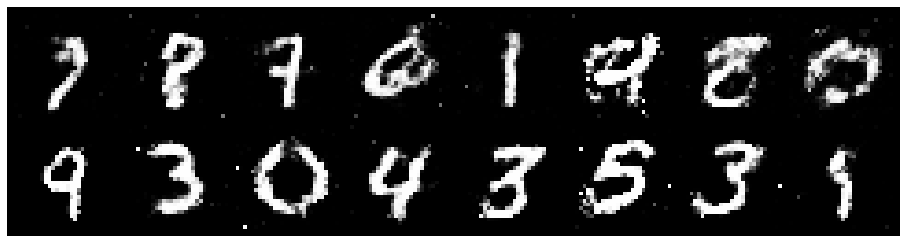

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.1370, Generator Loss: 1.0865
D(x): 0.5702, D(G(z)): 0.3707
gen_epochs:1 ,dis_epochs:1


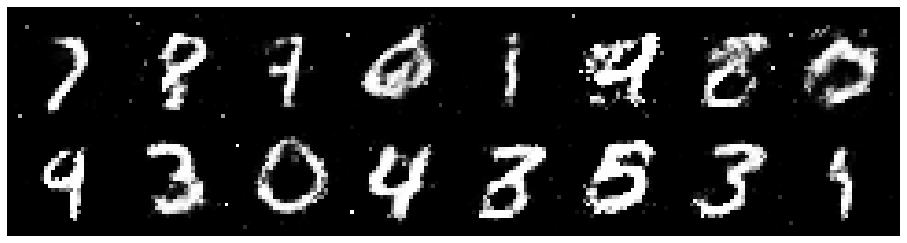

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.2541, Generator Loss: 0.9915
D(x): 0.6056, D(G(z)): 0.4210
gen_epochs:1 ,dis_epochs:1


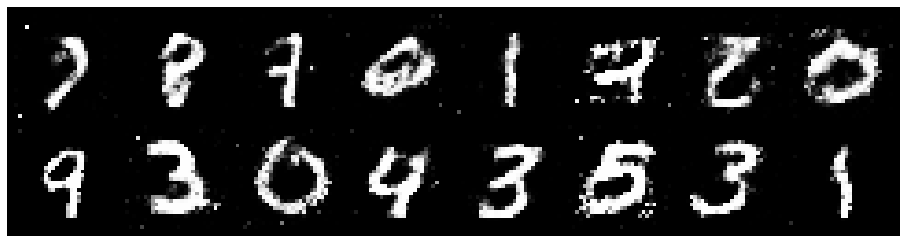

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.1672, Generator Loss: 0.8662
D(x): 0.6114, D(G(z)): 0.4396
gen_epochs:1 ,dis_epochs:1


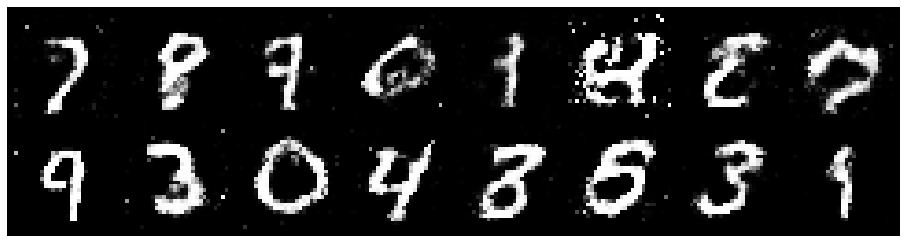

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.3402, Generator Loss: 0.9134
D(x): 0.5663, D(G(z)): 0.4613
gen_epochs:1 ,dis_epochs:1


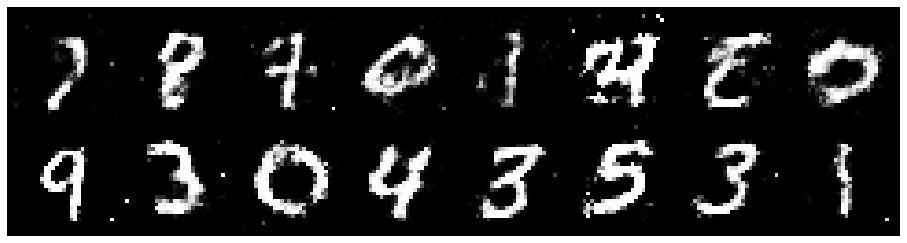

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.1897, Generator Loss: 0.9228
D(x): 0.5996, D(G(z)): 0.3983
gen_epochs:1 ,dis_epochs:1


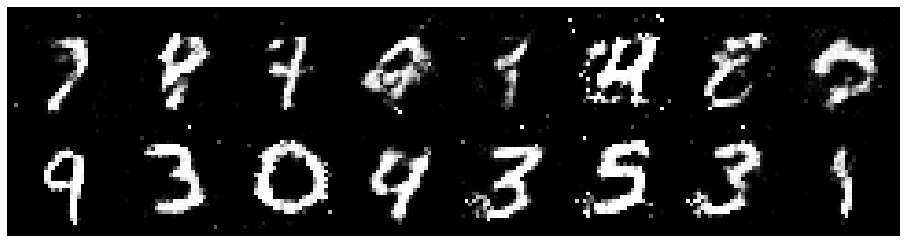

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.2088, Generator Loss: 1.1824
D(x): 0.6057, D(G(z)): 0.4390
gen_epochs:1 ,dis_epochs:1


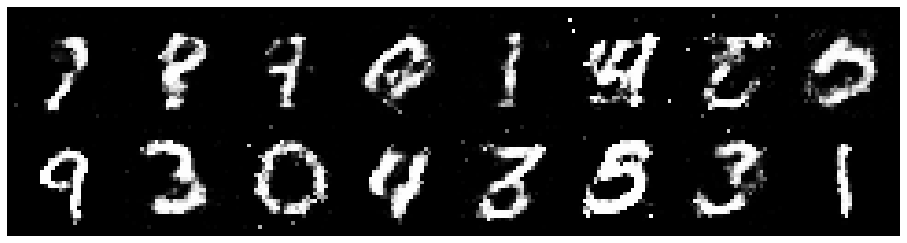

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.1400, Generator Loss: 0.9785
D(x): 0.5981, D(G(z)): 0.4216
gen_epochs:1 ,dis_epochs:1


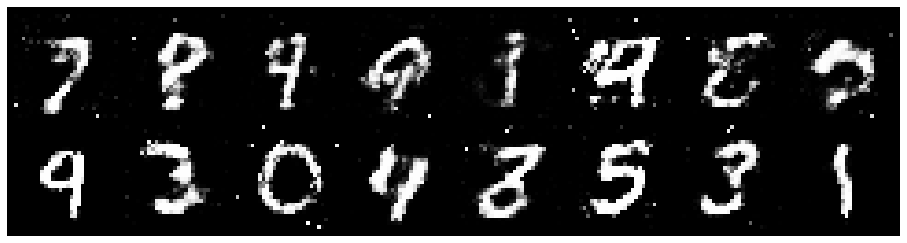

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.2919, Generator Loss: 1.1451
D(x): 0.5155, D(G(z)): 0.4041
gen_epochs:1 ,dis_epochs:1


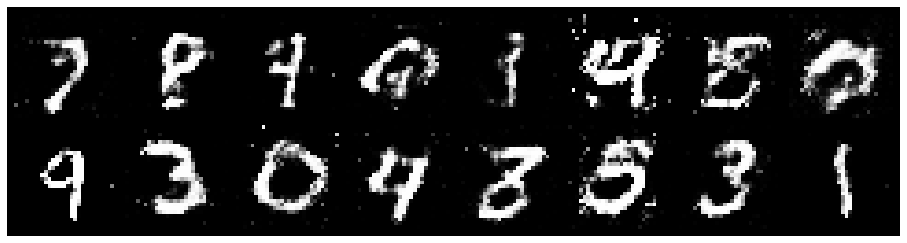

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.2858, Generator Loss: 0.9114
D(x): 0.5465, D(G(z)): 0.4093
gen_epochs:1 ,dis_epochs:1


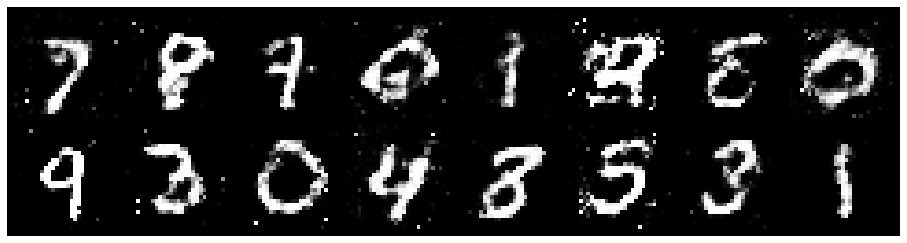

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.1651, Generator Loss: 1.0001
D(x): 0.5851, D(G(z)): 0.4088
gen_epochs:1 ,dis_epochs:1


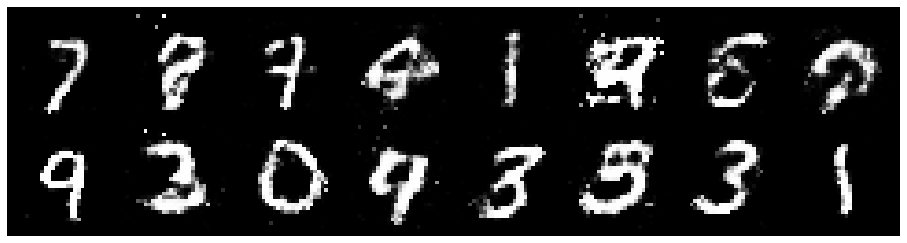

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.1023, Generator Loss: 1.0183
D(x): 0.6291, D(G(z)): 0.4048
gen_epochs:1 ,dis_epochs:1


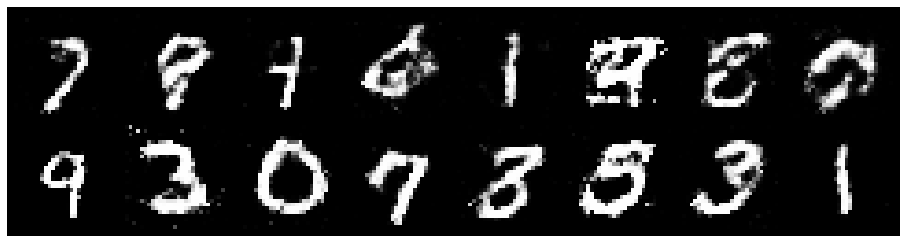

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.1719, Generator Loss: 1.0487
D(x): 0.6013, D(G(z)): 0.4048
gen_epochs:1 ,dis_epochs:1


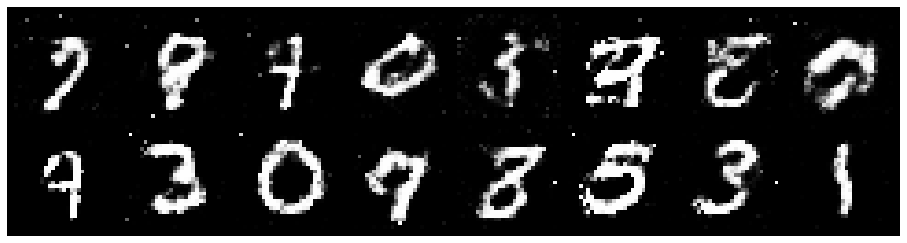

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.1711, Generator Loss: 0.8984
D(x): 0.6166, D(G(z)): 0.4263
gen_epochs:1 ,dis_epochs:1


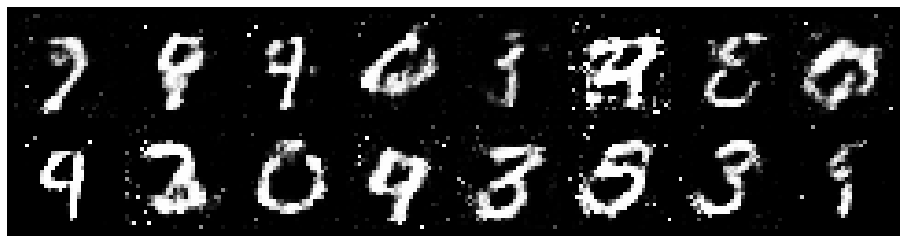

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.2494, Generator Loss: 1.0452
D(x): 0.5698, D(G(z)): 0.4193
gen_epochs:1 ,dis_epochs:1


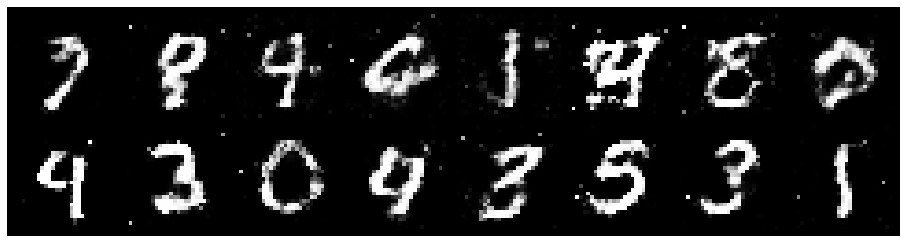

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.3017, Generator Loss: 0.7956
D(x): 0.6091, D(G(z)): 0.5040
gen_epochs:1 ,dis_epochs:1


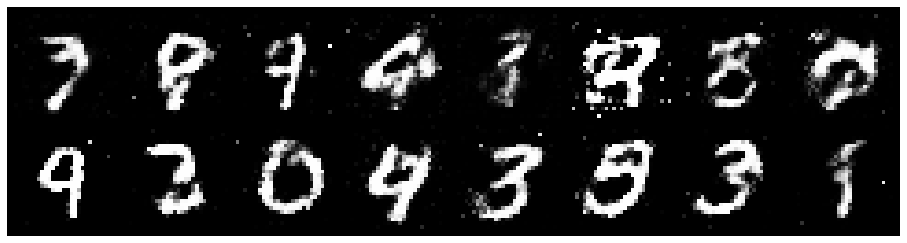

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.2779, Generator Loss: 0.9310
D(x): 0.5828, D(G(z)): 0.4491
gen_epochs:1 ,dis_epochs:1


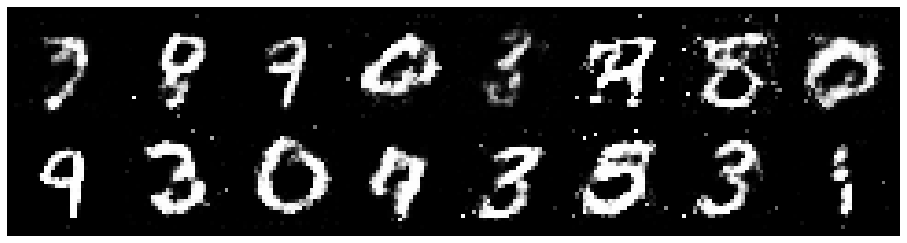

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.1779, Generator Loss: 0.9115
D(x): 0.6354, D(G(z)): 0.4499
gen_epochs:1 ,dis_epochs:1


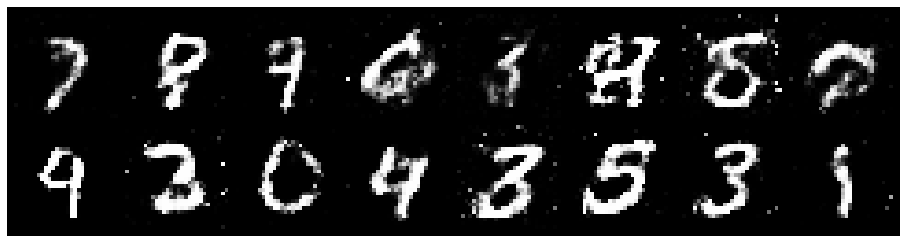

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.1337, Generator Loss: 0.9752
D(x): 0.6527, D(G(z)): 0.4264
gen_epochs:1 ,dis_epochs:1


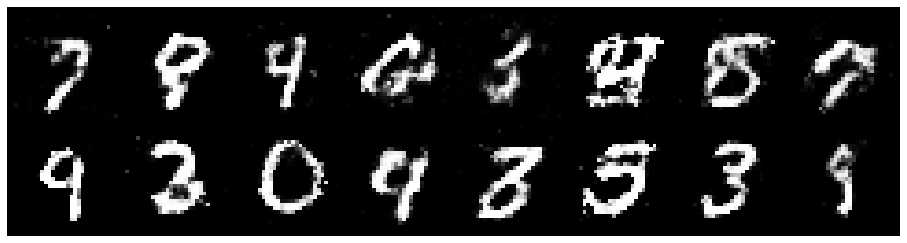

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.2531, Generator Loss: 0.9710
D(x): 0.5980, D(G(z)): 0.4303
gen_epochs:1 ,dis_epochs:1


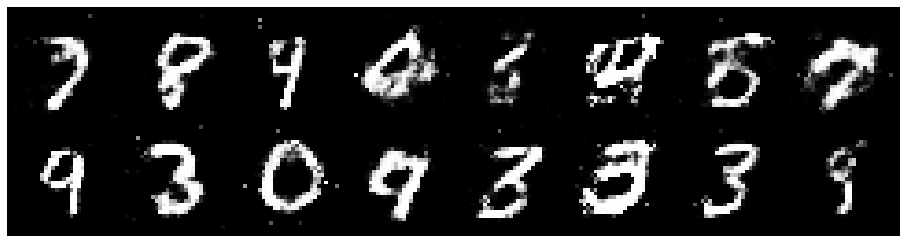

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.2434, Generator Loss: 0.9071
D(x): 0.5747, D(G(z)): 0.4326
gen_epochs:1 ,dis_epochs:1


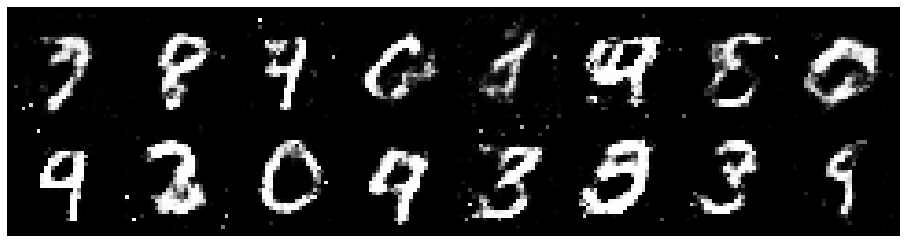

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.2882, Generator Loss: 1.0380
D(x): 0.5461, D(G(z)): 0.3907
gen_epochs:1 ,dis_epochs:1


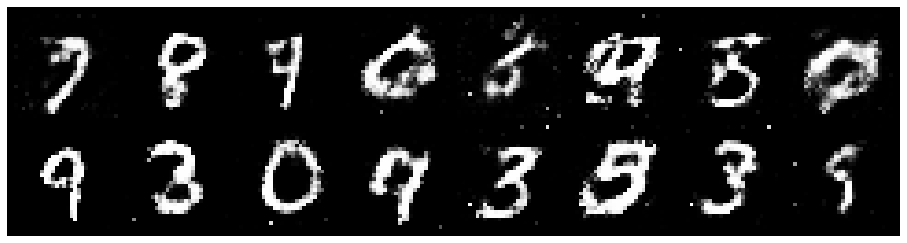

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.0200, Generator Loss: 1.1300
D(x): 0.6101, D(G(z)): 0.3515
gen_epochs:1 ,dis_epochs:1


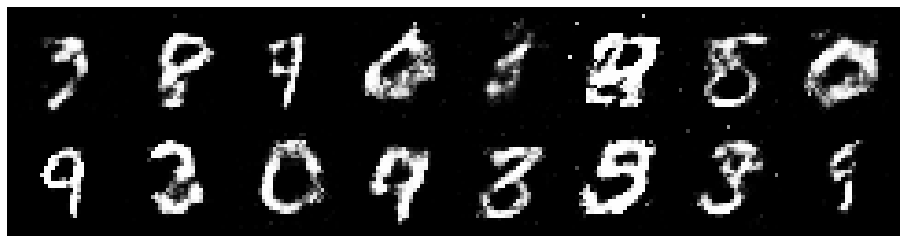

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.1670, Generator Loss: 0.9600
D(x): 0.5753, D(G(z)): 0.3806
gen_epochs:1 ,dis_epochs:1


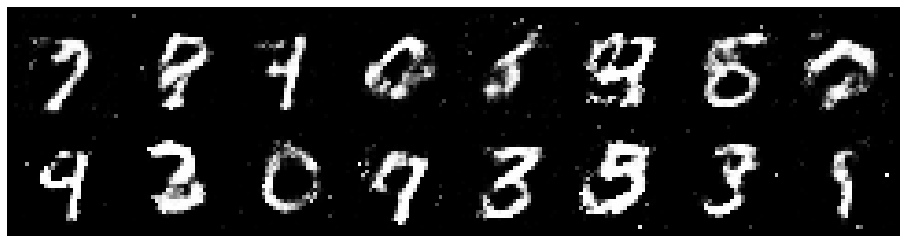

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.3115, Generator Loss: 1.0186
D(x): 0.5191, D(G(z)): 0.4090
gen_epochs:1 ,dis_epochs:1


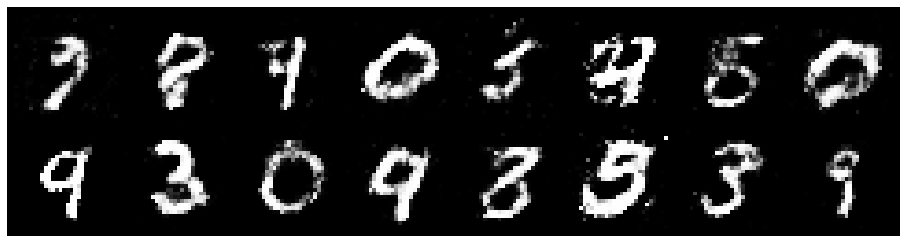

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.2166, Generator Loss: 0.8687
D(x): 0.5654, D(G(z)): 0.4134
gen_epochs:1 ,dis_epochs:1


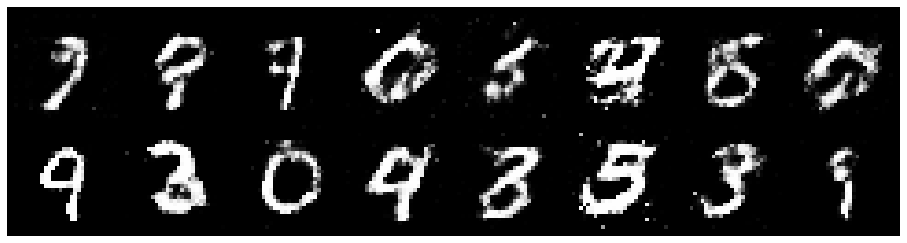

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.2107, Generator Loss: 0.9330
D(x): 0.5640, D(G(z)): 0.4277
gen_epochs:1 ,dis_epochs:1


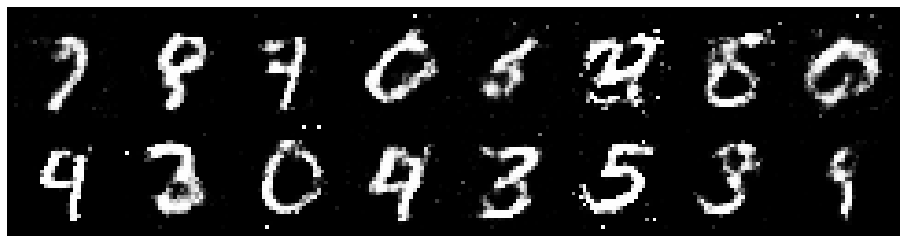

Epoch: [66/200], Batch Num: [100/600]
Discriminator Loss: 1.1965, Generator Loss: 1.1144
D(x): 0.6004, D(G(z)): 0.4100
gen_epochs:1 ,dis_epochs:1


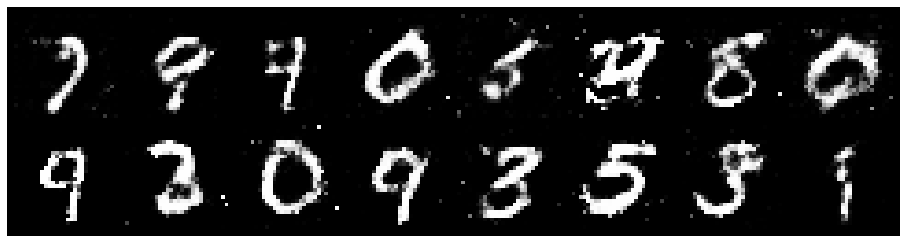

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.2534, Generator Loss: 0.9284
D(x): 0.5704, D(G(z)): 0.4474
gen_epochs:1 ,dis_epochs:1


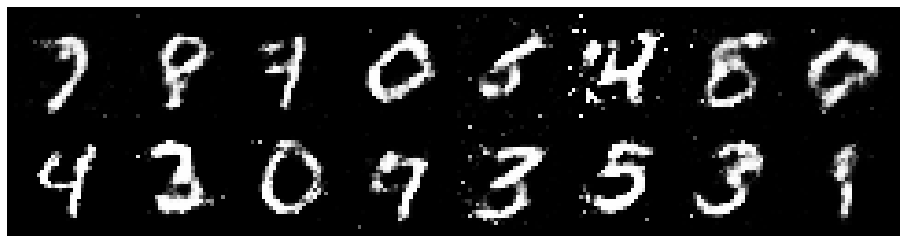

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.2525, Generator Loss: 0.9063
D(x): 0.5648, D(G(z)): 0.4355
gen_epochs:1 ,dis_epochs:1


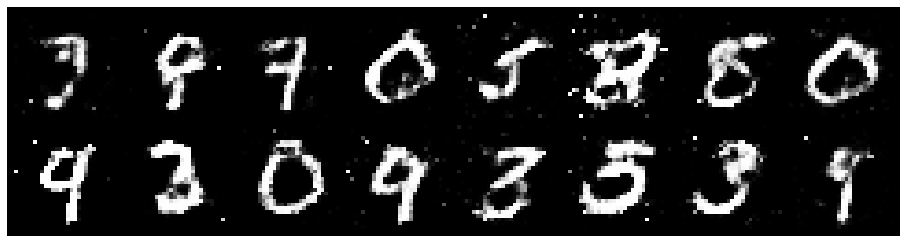

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.3509, Generator Loss: 0.7475
D(x): 0.5670, D(G(z)): 0.4935
gen_epochs:1 ,dis_epochs:1


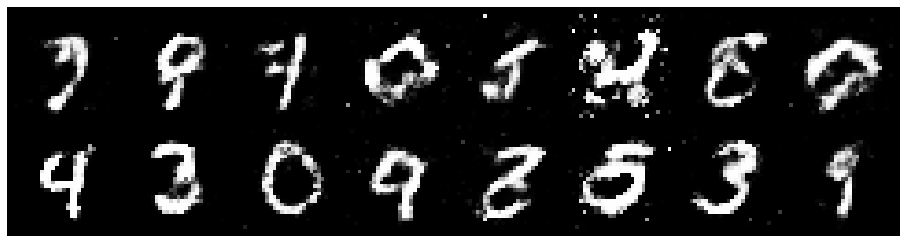

Epoch: [66/200], Batch Num: [500/600]
Discriminator Loss: 1.3530, Generator Loss: 0.9226
D(x): 0.5590, D(G(z)): 0.4687
gen_epochs:1 ,dis_epochs:1


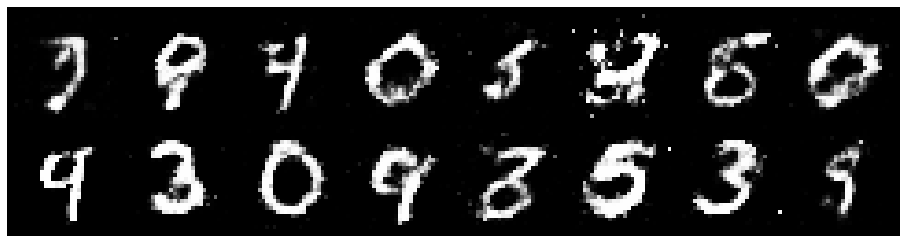

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.3183, Generator Loss: 0.8964
D(x): 0.5614, D(G(z)): 0.4684
gen_epochs:1 ,dis_epochs:1


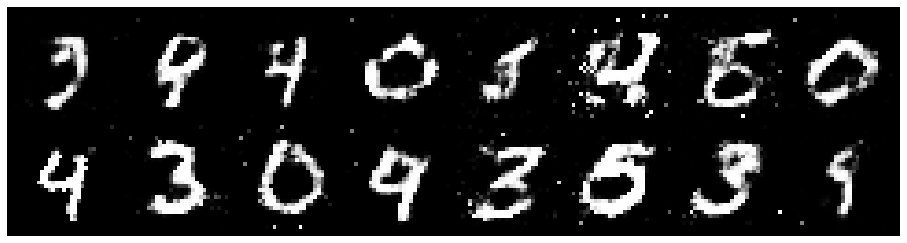

Epoch: [67/200], Batch Num: [100/600]
Discriminator Loss: 1.1859, Generator Loss: 0.9087
D(x): 0.6098, D(G(z)): 0.4250
gen_epochs:1 ,dis_epochs:1


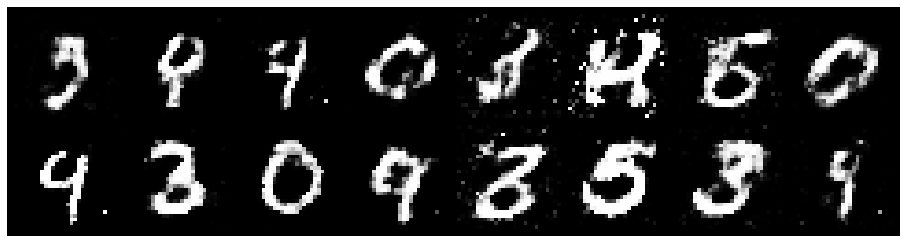

Epoch: [67/200], Batch Num: [200/600]
Discriminator Loss: 1.3065, Generator Loss: 1.0004
D(x): 0.5546, D(G(z)): 0.4320
gen_epochs:1 ,dis_epochs:1


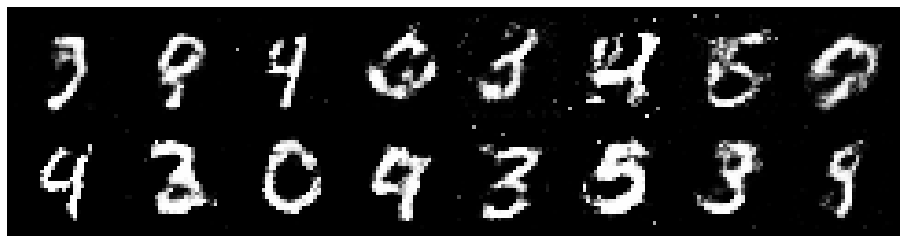

Epoch: [67/200], Batch Num: [300/600]
Discriminator Loss: 1.3581, Generator Loss: 1.1519
D(x): 0.5613, D(G(z)): 0.4449
gen_epochs:1 ,dis_epochs:1


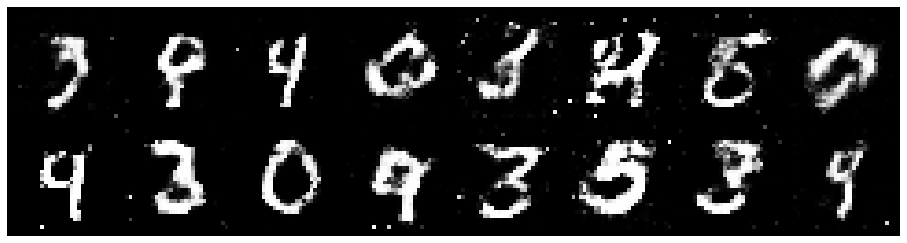

Epoch: [67/200], Batch Num: [400/600]
Discriminator Loss: 1.1855, Generator Loss: 0.9825
D(x): 0.6525, D(G(z)): 0.4663
gen_epochs:1 ,dis_epochs:1


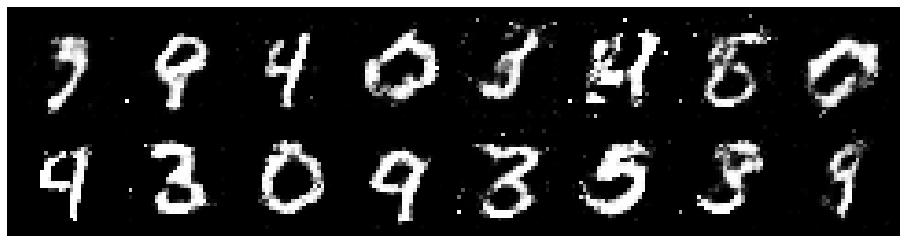

Epoch: [67/200], Batch Num: [500/600]
Discriminator Loss: 1.1329, Generator Loss: 1.0702
D(x): 0.5768, D(G(z)): 0.3747
gen_epochs:1 ,dis_epochs:1


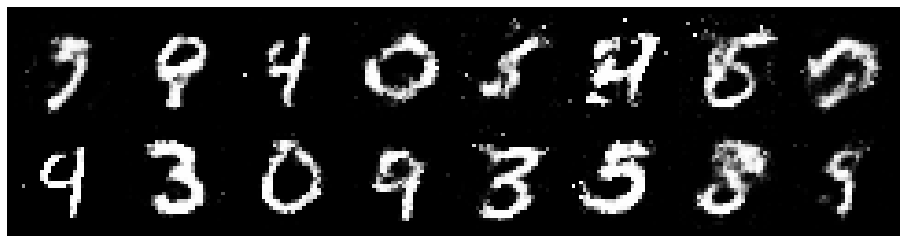

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.0931, Generator Loss: 1.0341
D(x): 0.5739, D(G(z)): 0.3611
gen_epochs:1 ,dis_epochs:1


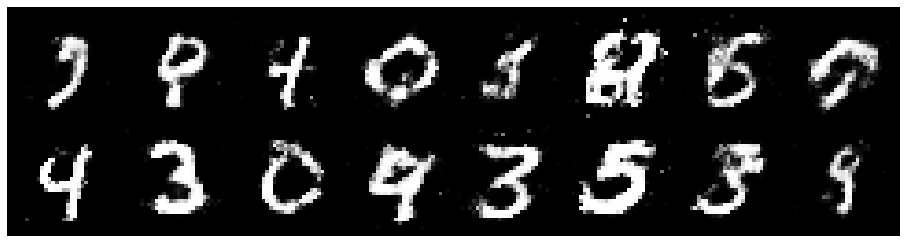

Epoch: [68/200], Batch Num: [100/600]
Discriminator Loss: 1.0499, Generator Loss: 1.0986
D(x): 0.6074, D(G(z)): 0.3657
gen_epochs:1 ,dis_epochs:1


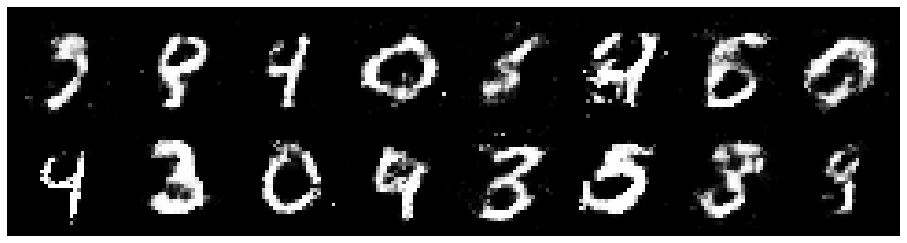

Epoch: [68/200], Batch Num: [200/600]
Discriminator Loss: 1.1829, Generator Loss: 0.9201
D(x): 0.6025, D(G(z)): 0.4126
gen_epochs:1 ,dis_epochs:1


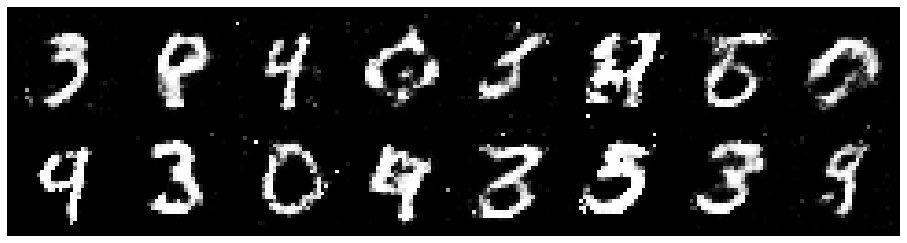

Epoch: [68/200], Batch Num: [300/600]
Discriminator Loss: 1.2291, Generator Loss: 0.9385
D(x): 0.6095, D(G(z)): 0.4582
gen_epochs:1 ,dis_epochs:1


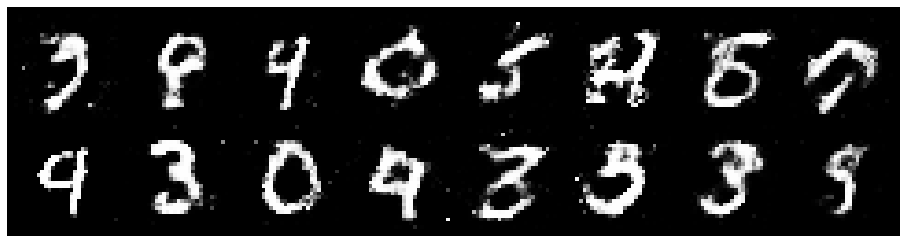

Epoch: [68/200], Batch Num: [400/600]
Discriminator Loss: 1.1642, Generator Loss: 1.0367
D(x): 0.5728, D(G(z)): 0.3902
gen_epochs:1 ,dis_epochs:1


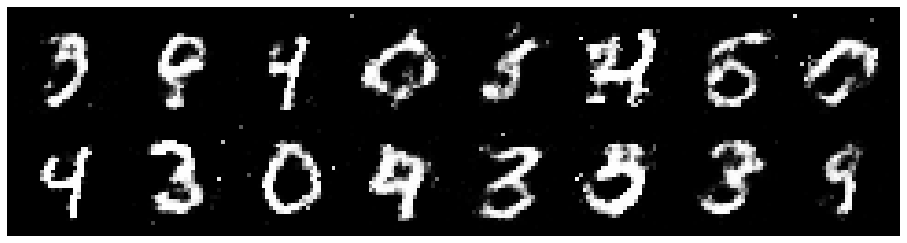

Epoch: [68/200], Batch Num: [500/600]
Discriminator Loss: 1.2810, Generator Loss: 1.0268
D(x): 0.5224, D(G(z)): 0.3893
gen_epochs:1 ,dis_epochs:1


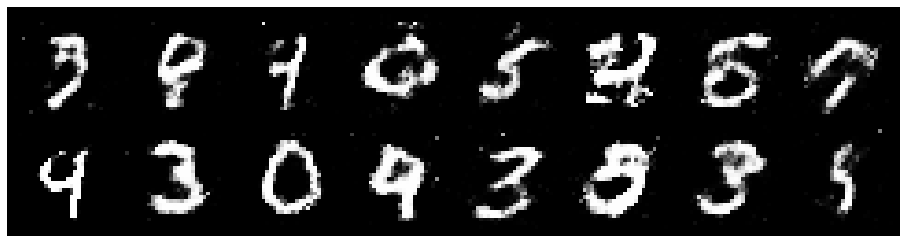

Epoch: [69/200], Batch Num: [0/600]
Discriminator Loss: 1.1286, Generator Loss: 1.0521
D(x): 0.6072, D(G(z)): 0.3920
gen_epochs:1 ,dis_epochs:1


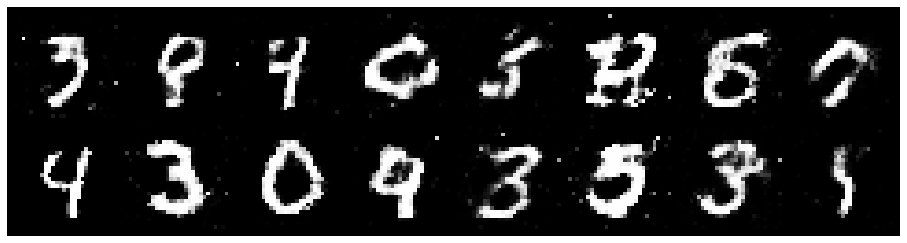

Epoch: [69/200], Batch Num: [100/600]
Discriminator Loss: 1.1137, Generator Loss: 1.1863
D(x): 0.5760, D(G(z)): 0.3486
gen_epochs:1 ,dis_epochs:1


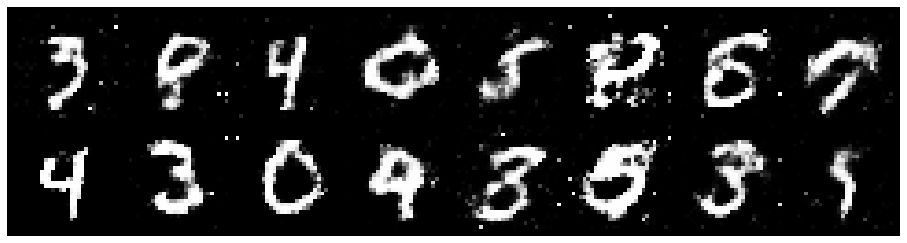

Epoch: [69/200], Batch Num: [200/600]
Discriminator Loss: 1.2566, Generator Loss: 0.9278
D(x): 0.5851, D(G(z)): 0.4394
gen_epochs:1 ,dis_epochs:1


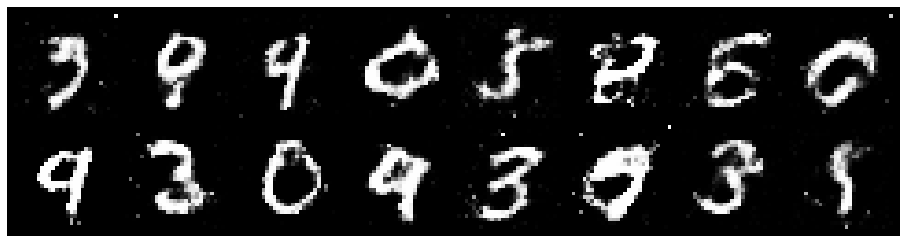

Epoch: [69/200], Batch Num: [300/600]
Discriminator Loss: 1.2893, Generator Loss: 0.9665
D(x): 0.5670, D(G(z)): 0.4378
gen_epochs:1 ,dis_epochs:1


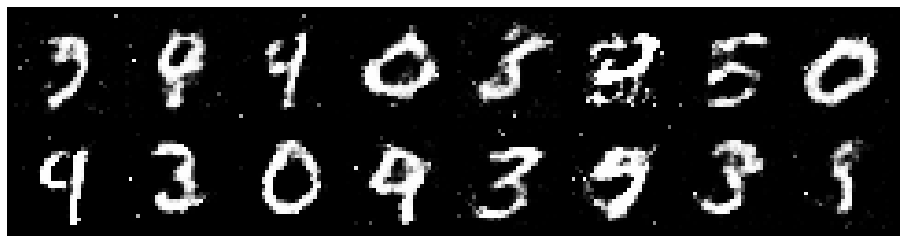

Epoch: [69/200], Batch Num: [400/600]
Discriminator Loss: 1.2378, Generator Loss: 1.0142
D(x): 0.5854, D(G(z)): 0.4413
gen_epochs:1 ,dis_epochs:1


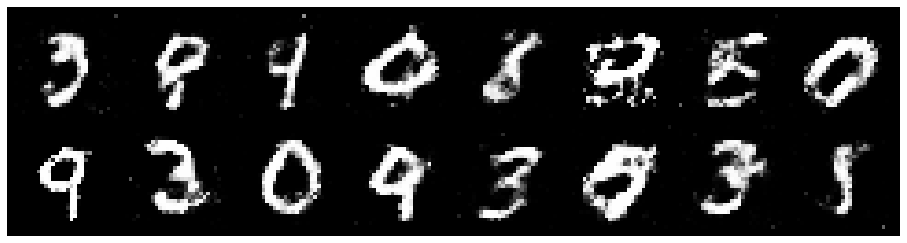

Epoch: [69/200], Batch Num: [500/600]
Discriminator Loss: 1.1370, Generator Loss: 0.8813
D(x): 0.5655, D(G(z)): 0.3940
gen_epochs:1 ,dis_epochs:1


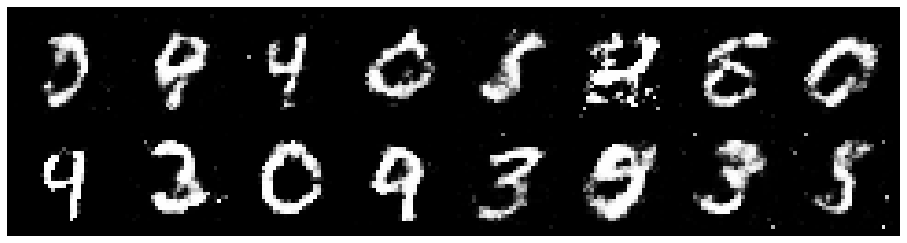

Epoch: [70/200], Batch Num: [0/600]
Discriminator Loss: 1.2525, Generator Loss: 0.7944
D(x): 0.5731, D(G(z)): 0.4690
gen_epochs:1 ,dis_epochs:1


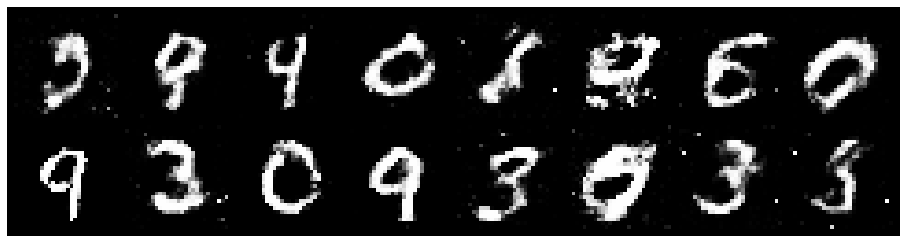

Epoch: [70/200], Batch Num: [100/600]
Discriminator Loss: 1.2726, Generator Loss: 1.0249
D(x): 0.5189, D(G(z)): 0.4026
gen_epochs:1 ,dis_epochs:1


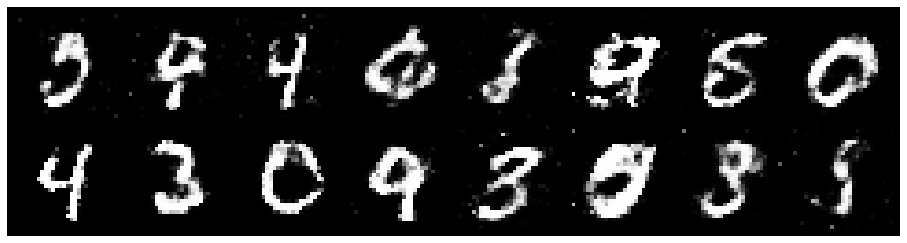

Epoch: [70/200], Batch Num: [200/600]
Discriminator Loss: 1.2090, Generator Loss: 0.8606
D(x): 0.5852, D(G(z)): 0.4535
gen_epochs:1 ,dis_epochs:1


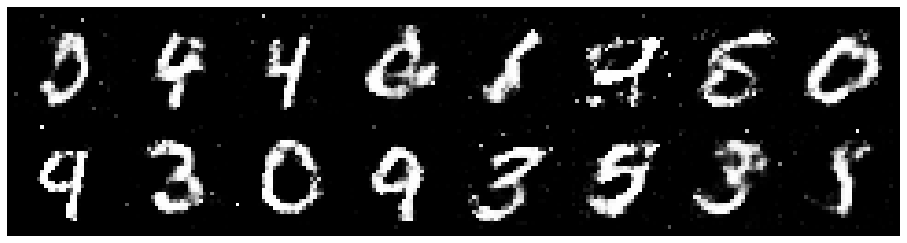

Epoch: [70/200], Batch Num: [300/600]
Discriminator Loss: 1.2767, Generator Loss: 0.9881
D(x): 0.5878, D(G(z)): 0.4480
gen_epochs:1 ,dis_epochs:1


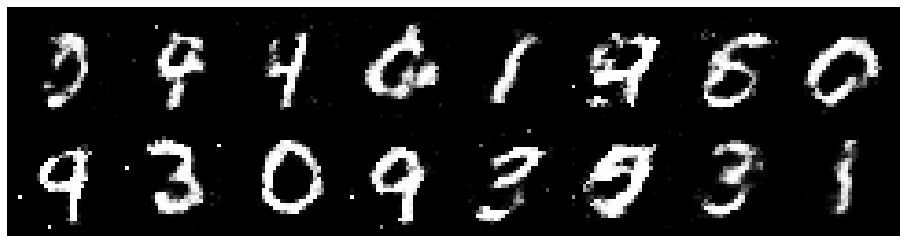

Epoch: [70/200], Batch Num: [400/600]
Discriminator Loss: 1.3463, Generator Loss: 1.0736
D(x): 0.5425, D(G(z)): 0.4326
gen_epochs:1 ,dis_epochs:1


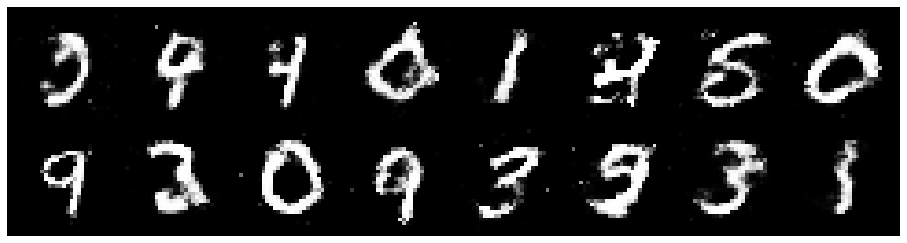

Epoch: [70/200], Batch Num: [500/600]
Discriminator Loss: 1.1219, Generator Loss: 1.0352
D(x): 0.5741, D(G(z)): 0.3602
gen_epochs:1 ,dis_epochs:1


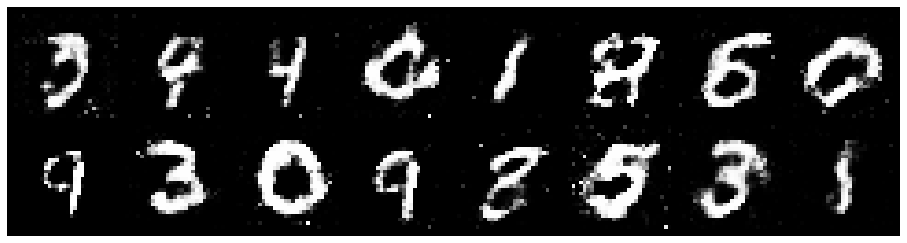

Epoch: [71/200], Batch Num: [0/600]
Discriminator Loss: 1.2944, Generator Loss: 0.9313
D(x): 0.5589, D(G(z)): 0.4310
gen_epochs:1 ,dis_epochs:1


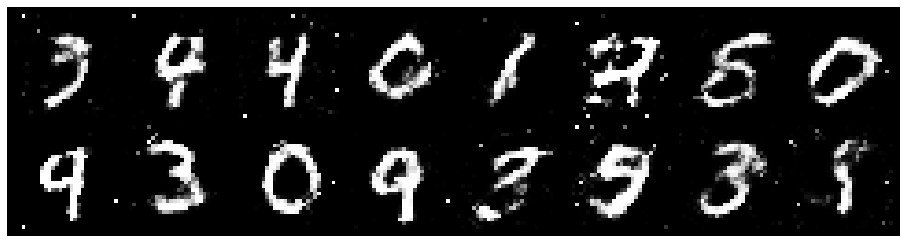

Epoch: [71/200], Batch Num: [100/600]
Discriminator Loss: 1.2552, Generator Loss: 1.0031
D(x): 0.5604, D(G(z)): 0.4115
gen_epochs:1 ,dis_epochs:1


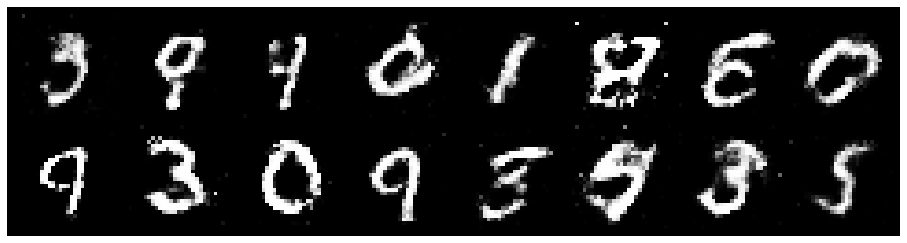

Epoch: [71/200], Batch Num: [200/600]
Discriminator Loss: 1.2485, Generator Loss: 1.0717
D(x): 0.5668, D(G(z)): 0.4125
gen_epochs:1 ,dis_epochs:1


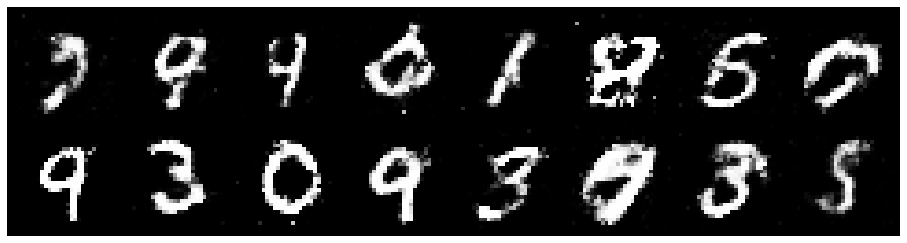

Epoch: [71/200], Batch Num: [300/600]
Discriminator Loss: 1.2915, Generator Loss: 0.9110
D(x): 0.5748, D(G(z)): 0.4591
gen_epochs:1 ,dis_epochs:1


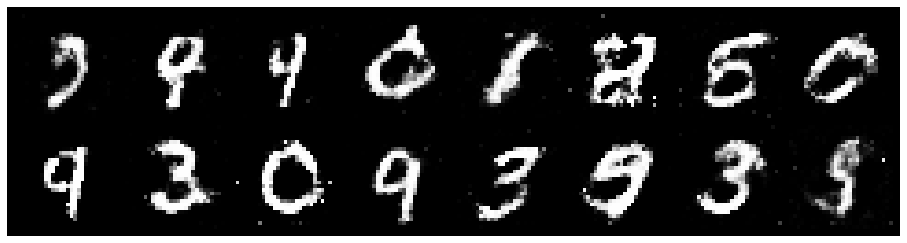

Epoch: [71/200], Batch Num: [400/600]
Discriminator Loss: 1.2517, Generator Loss: 1.0006
D(x): 0.5977, D(G(z)): 0.4558
gen_epochs:1 ,dis_epochs:1


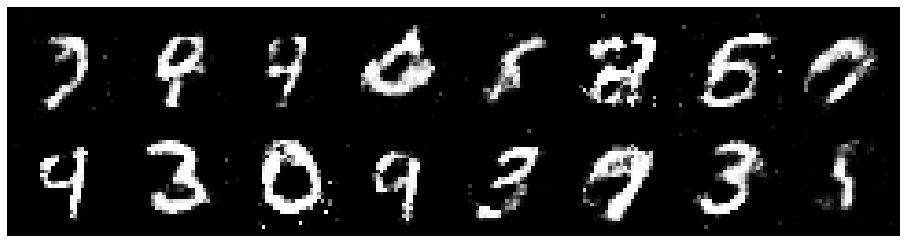

Epoch: [71/200], Batch Num: [500/600]
Discriminator Loss: 1.3374, Generator Loss: 0.9572
D(x): 0.5273, D(G(z)): 0.4348
gen_epochs:1 ,dis_epochs:1


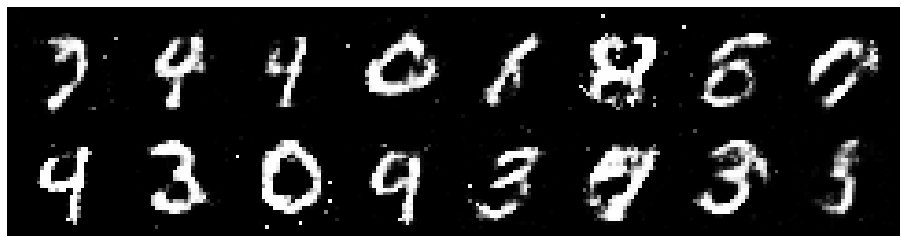

Epoch: [72/200], Batch Num: [0/600]
Discriminator Loss: 1.1963, Generator Loss: 1.1477
D(x): 0.6694, D(G(z)): 0.4692
gen_epochs:1 ,dis_epochs:1


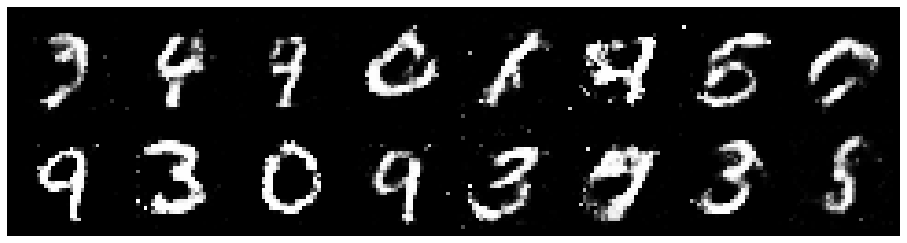

Epoch: [72/200], Batch Num: [100/600]
Discriminator Loss: 1.2740, Generator Loss: 1.0731
D(x): 0.5460, D(G(z)): 0.4336
gen_epochs:1 ,dis_epochs:1


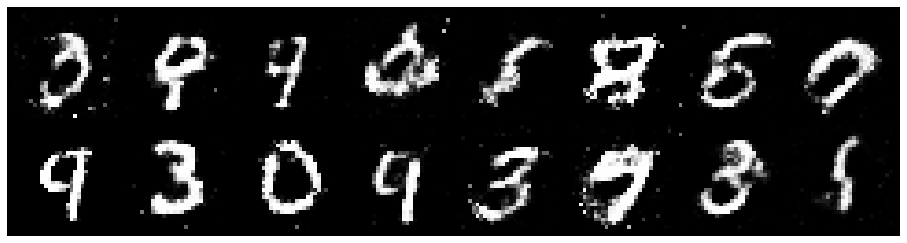

Epoch: [72/200], Batch Num: [200/600]
Discriminator Loss: 1.2056, Generator Loss: 0.9601
D(x): 0.5785, D(G(z)): 0.4011
gen_epochs:1 ,dis_epochs:1


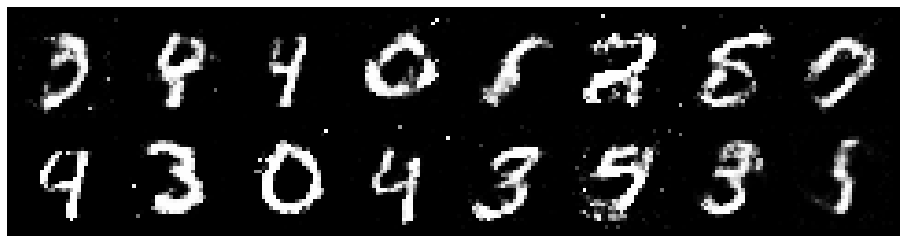

Epoch: [72/200], Batch Num: [300/600]
Discriminator Loss: 1.2260, Generator Loss: 0.9733
D(x): 0.5742, D(G(z)): 0.4169
gen_epochs:1 ,dis_epochs:1


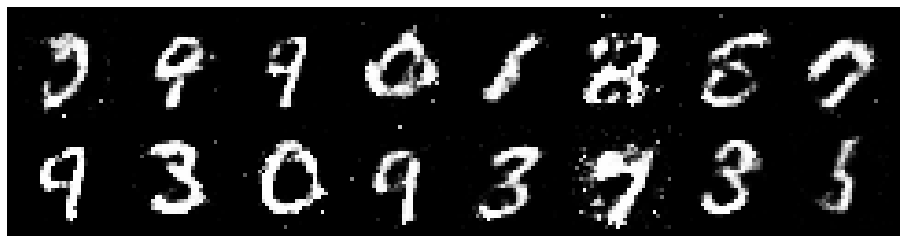

Epoch: [72/200], Batch Num: [400/600]
Discriminator Loss: 1.3742, Generator Loss: 0.8337
D(x): 0.5385, D(G(z)): 0.4671
gen_epochs:1 ,dis_epochs:1


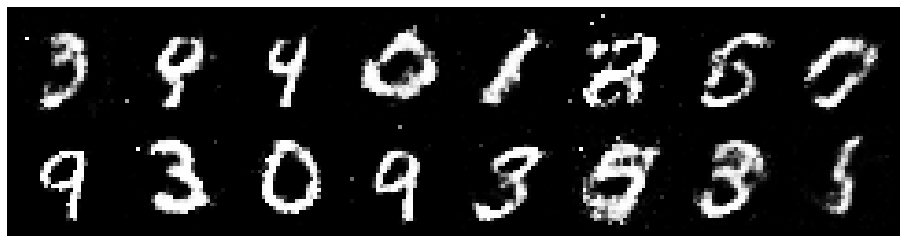

Epoch: [72/200], Batch Num: [500/600]
Discriminator Loss: 1.3038, Generator Loss: 0.8854
D(x): 0.5639, D(G(z)): 0.4489
gen_epochs:1 ,dis_epochs:1


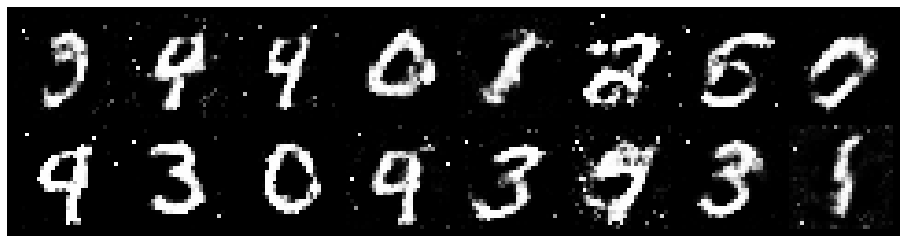

Epoch: [73/200], Batch Num: [0/600]
Discriminator Loss: 1.1443, Generator Loss: 1.0499
D(x): 0.5904, D(G(z)): 0.3924
gen_epochs:1 ,dis_epochs:1


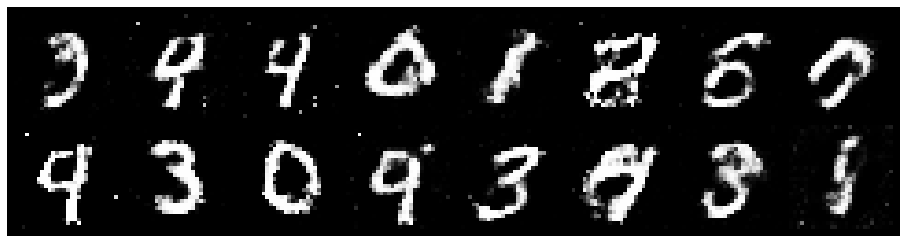

Epoch: [73/200], Batch Num: [100/600]
Discriminator Loss: 1.2426, Generator Loss: 0.9454
D(x): 0.5453, D(G(z)): 0.4031
gen_epochs:1 ,dis_epochs:1


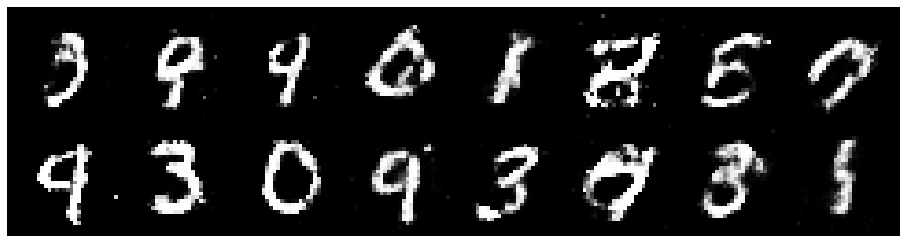

Epoch: [73/200], Batch Num: [200/600]
Discriminator Loss: 1.3690, Generator Loss: 0.9024
D(x): 0.5358, D(G(z)): 0.4698
gen_epochs:1 ,dis_epochs:1


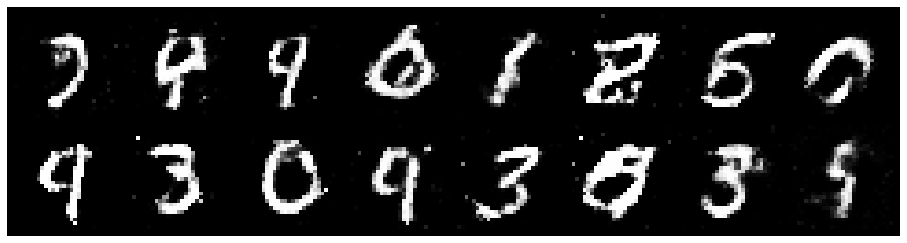

Epoch: [73/200], Batch Num: [300/600]
Discriminator Loss: 1.3683, Generator Loss: 0.8234
D(x): 0.5404, D(G(z)): 0.4694
gen_epochs:1 ,dis_epochs:1


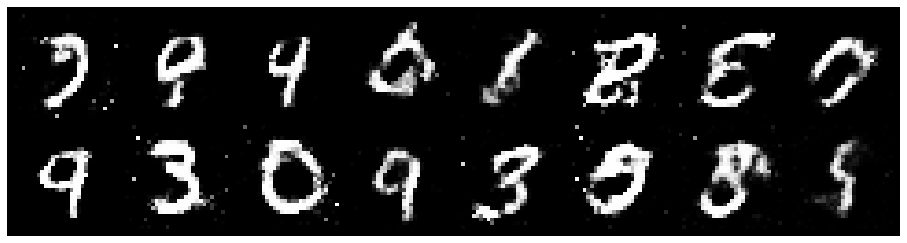

Epoch: [73/200], Batch Num: [400/600]
Discriminator Loss: 1.2654, Generator Loss: 0.9300
D(x): 0.5546, D(G(z)): 0.4016
gen_epochs:1 ,dis_epochs:1


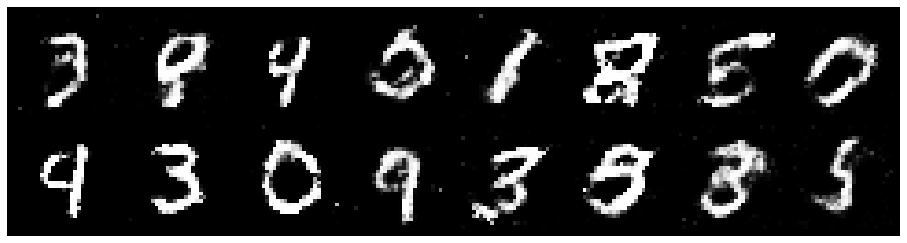

Epoch: [73/200], Batch Num: [500/600]
Discriminator Loss: 1.1966, Generator Loss: 1.1165
D(x): 0.5630, D(G(z)): 0.3974
gen_epochs:1 ,dis_epochs:1


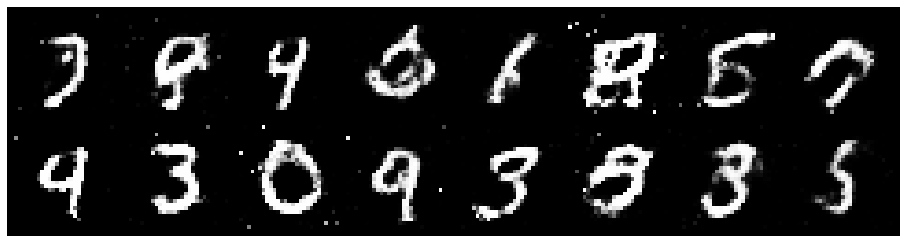

Epoch: [74/200], Batch Num: [0/600]
Discriminator Loss: 1.2986, Generator Loss: 0.9455
D(x): 0.5412, D(G(z)): 0.4391
gen_epochs:1 ,dis_epochs:1


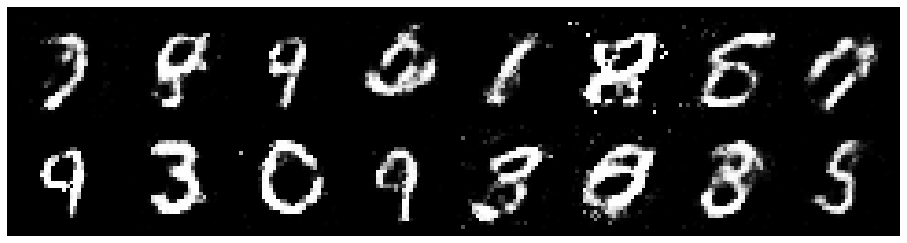

Epoch: [74/200], Batch Num: [100/600]
Discriminator Loss: 1.1850, Generator Loss: 0.8625
D(x): 0.6086, D(G(z)): 0.4252
gen_epochs:1 ,dis_epochs:1


KeyboardInterrupt: ignored

In [0]:


# Total number of epochs to train
num_epochs = 200
gen_epochs=1
dis_epochs=1
log_display=100
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
       
        # 1. Train Discriminator
        for i in range(dis_epochs):
          real_data = Variable(images_to_vectors(real_batch))
          # Generate fake data and detach 
          # (so gradients are not calculated for generator)
          fake_data = generator(noise(N)).detach()
          # Train D
          d_error, d_pred_real, d_pred_fake = \
                train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % log_display == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            # gen_epochs,dis_epochs=dis_epochs,gen_epochs
            
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )
            print('gen_epochs:{} ,dis_epochs:{}'.format(gen_epochs,dis_epochs))

In [0]:
gen_model_save_name = 'generator_model_b.pt'
dis_model_save_name = 'discriminator_model_b.pt'
gen_path=F"/gdrive/My Drive/Colab Notebooks/GANS/GAN_b/{gen_model_save_name}"
dis_path=F"/gdrive/My Drive/Colab Notebooks/GANS/GAN_b/{dis_model_save_name}"
torch.save(generator.state_dict(), gen_path)
torch.save(discriminator.state_dict(), dis_path)

In [0]:
!cp -r /content/runs /gdrive/My\ Drive/Colab\ Notebooks/GANS/GAN_b
!cp -r /content/data /gdrive/My\ Drive/Colab\ Notebooks/GANS/GAN_b